<h1> Uber H3 API examples on Urban Analytics in the city of Toulouse (France)</h1>

<br/><br/>
<font size="3"><b> Author: Camelia Ciolac </b></font><br/>
ciolac_c@inria-alumni.fr

<font size=3>

This notebook presents several spatial analytics using the H3 geospatial index, using open data from the city of Toulouse.  <br/>
Highlights:

* Spatial search (K nearest neighbors) and spatial join (point in polygon)
* Aggregates accompanied by 3D visualizations
* Tensorflow classifier of spatial point patterns using hexagonal convolutions

Sections:
 
<ol style="list-style-type: upper-roman;">
<li>Preliminaries  </li>
<li>Use H3 indexing for spatial operations  </li>
<li>Use H3 spatial index for aggregated analytics </li>
<li>Global Spatial Autocorrelation</li>
    IV.4. Spatial Autocorrelation Prediction with Tensorflow
<li>3D visualizations in JavaScript with deck.gl</li>
</ol>     
    
<br/>
Relevant references about H3:   <br/> 
<a href="https://h3geo.org/docs">https://h3geo.org/docs</a> <br/>
<a href="https://eng.uber.com/h3/"> https://eng.uber.com/h3/ </a><br/>    
<a href="https://portal.opengeospatial.org/files/?artifact_id=90338">https://portal.opengeospatial.org/files/?artifact_id=90338</a>
</font>

In [1]:
!pip install --disable-pip-version-check --quiet h3==3.6.4
!pip show h3

Name: h3
Version: 3.6.4
Summary: Hierarchical hexagonal geospatial indexing system
Home-page: https://github.com/uber/h3-py
Author: Uber Technologies
Author-email: AJ Friend <ajfriend@gmail.com>
License: Apache 2.0 License
Location: /home/camelia/github_repos/myh3/projenv_demo_h3/lib/python3.6/site-packages
Requires: 
Required-by: 


In [2]:
from IPython.core.display import display, HTML
from IPython.display import Image, display
from IPython.utils.text import columnize
#display(HTML("<style>.container { width:100% !important; }</style>"))

In [3]:
import h3

print(columnize(dir(h3), displaywidth=100))

H3CellError                                        get_pentagon_indexes             polyfill        
H3DistanceError                                    get_res0_indexes                 polyfill_geojson
H3EdgeError                                        h3                               polyfill_polygon
H3ResolutionError                                  h3_distance                      string_to_h3    
H3ValueError                                       h3_get_base_cell                 uncompact       
__builtins__                                       h3_get_faces                     versions        
__cached__                                         h3_get_resolution              
__doc__                                            h3_indexes_are_neighbors       
__file__                                           h3_is_pentagon                 
__loader__                                         h3_is_res_class_III            
__name__                                           h3_is_res_c

----------------

# Setup steps

Virtual environment was set up as follows:

```
virtualenv -p /usr/bin/python3.6 ./projenv_demo_h3   

source projenv_demo_h3/bin/activate  

pip3 install ipython==7.2.0 jupyter==1.0.0  

jupyter notebook  
```

For rtree (used in geopandas sjoin) the following is required  on Ubuntu:

```
sudo apt-get install libspatialindex-dev
```

In [4]:
import sys
sys.version_info

sys.version_info(major=3, minor=6, micro=7, releaselevel='final', serial=0)

In [5]:
%%sh
cat <<EOF > requirements_demo.txt
pandas>=0.23
statsmodels==0.11.1
tensorflow==2.2.0

h3==3.6.4
geopandas==0.8.1
geojson==2.4.1
Rtree==0.9.4 
pygeos==0.7.1 
Shapely==1.7.0 
libpysal==4.3.0
esda==2.3.1
pointpats==2.2.0 
descartes==1.1.0

annoy==1.16.3 

folium==0.11.0
seaborn==0.9.1
pydeck==0.4.1

more-itertools==8.4.0
tqdm==4.48.0
line-profiler==3.0.2
flake8==3.8.3
pycodestyle==2.6.0 
pycodestyle_magic==0.5
EOF

In [6]:
%%sh
pip3 install -U --quiet \
            --disable-pip-version-check \
            --use-feature=2020-resolver \
            -r requirements_demo.txt

In [7]:
%%bash
VAR_SEARCH='h3|pydeck|pandas|tensorflow|shapely|geopandas|esda|pointpats|libpysal|annoy'
pip3 freeze | grep -E $VAR_SEARCH

annoy==1.16.3
esda==2.3.1
geopandas==0.8.1
h3==3.6.4
libpysal==4.3.0
pandas==1.1.0
pointpats==2.2.0
pydeck==0.4.1
tensorflow==2.2.0
tensorflow-estimator==2.2.0


To enable pydeck for Jupyter:
    
```
jupyter nbextension install --sys-prefix --symlink --overwrite --py pydeck
jupyter nbextension enable --sys-prefix --py pydeck
```


For PlotNeuralNet:

```
sudo apt-get install texlive-latex-extra
```

In [9]:
!git clone https://github.com/HarisIqbal88/PlotNeuralNet

Cloning into 'PlotNeuralNet'...
remote: Enumerating objects: 270, done.
remote: Total 270 (delta 0), reused 0 (delta 0), pack-reused 270
Receiving objects: 100% (270/270), 2.11 MiB | 1.82 MiB/s, done.
Resolving deltas: 100% (119/119), done.
Checking connectivity... done.


-------------------

## Data sources for the examples:

Bus stops:
https://data.toulouse-metropole.fr/explore/dataset/arrets-de-bus0/information/

City subzones:
https://data.toulouse-metropole.fr/explore/dataset/communes/information/

Residential districts:
https://data.toulouse-metropole.fr/explore/dataset/recensement-population-2015-grands-quartiers-logement/information/



<b>Note:</b>  
We analyze only bus stops data for this example, however, the city of Toulouse has also trams and metro (underground) as part of the urban public transport network.  


In [10]:
%%sh
mkdir -p datasets_demo

In [11]:
%%sh
wget -O datasets_demo/busstops_Toulouse.geojson --content-disposition -q \
    "https://data.toulouse-metropole.fr/explore/dataset/arrets-de-bus0/download/?format=geojson&timezone=Europe/Helsinki"

In [12]:
%%sh
ls -alh datasets_demo/busstops_*.geojson

-rw-rw-r-- 1 camelia camelia 4,3M aug  9 07:11 datasets_demo/busstops_Toulouse.geojson


In [13]:
%%sh
wget -O datasets_demo/subzones_Toulouse.geojson --content-disposition -q \
    "https://data.toulouse-metropole.fr/explore/dataset/communes/download/?format=geojson&timezone=Europe/Helsinki"

In [14]:
%%sh
ls -alh datasets_demo/subzones_*.geojson

-rw-rw-r-- 1 camelia camelia 960K aug  9 07:11 datasets_demo/subzones_Toulouse.geojson


In [15]:
%%sh
wget -O datasets_demo/districts_Toulouse.geojson --content-disposition -q \
    "https://data.toulouse-metropole.fr/explore/dataset/recensement-population-2015-grands-quartiers-logement/download/?format=geojson&timezone=Europe/Helsinki"

In [16]:
%%sh
ls -alh datasets_demo/districts_*.geojson

-rw-rw-r-- 1 camelia camelia 368K aug  9 07:11 datasets_demo/districts_Toulouse.geojson


---

## Imports

In [17]:
import json
import pandas as pd
from pandas.io.json import json_normalize
import numpy as np

import statistics
import statsmodels as sm
import statsmodels.formula.api as sm_formula
from scipy import stats

import tensorflow as tf
from tensorflow.keras import layers, models

print(tf.__version__)

2.2.0


In [18]:
import warnings
warnings.filterwarnings('ignore')


# don't use scientific notation
np.set_printoptions(suppress=True) 
pd.set_option('display.float_format', lambda x: '%.5f' % x)

In [19]:
import h3

import geopandas as gpd

from shapely import geometry, ops
import libpysal as pys
import esda
import pointpats as pp

from geojson.feature import *

In [20]:
from annoy import AnnoyIndex

import bisect
import itertools
from more_itertools import unique_everseen

import math
import random
import decimal
from collections import Counter

from pprint import pprint
import copy

from tqdm import tqdm

In [21]:
import pydeck

from folium import Map, Marker, GeoJson
from folium.plugins import MarkerCluster
import branca.colormap as cm
from branca.colormap import linear
import folium

import seaborn as sns

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
import matplotlib.gridspec as gridspec

from PIL import Image as pilim

%matplotlib inline

In [22]:
import sys
sys.path.append('./PlotNeuralNet')
from pycore.tikzeng import *
from pycore.blocks  import *

In [23]:
%load_ext line_profiler
%load_ext pycodestyle_magic

See https://www.flake8rules.com/ for codes

In [24]:
# %flake8_on --ignore E251,E703,W293,W291 --max_line_length 90
# %flake8_off

--------------------

#  I. Preliminaries

## I.1. Metadata of H3 cells

For various H3 index resolutions, display metadata about the corresponding haxagon cells

In [25]:
max_res = 15
list_hex_edge_km = []
list_hex_edge_m = []
list_hex_perimeter_km = []
list_hex_perimeter_m = []
list_hex_area_sqkm = []
list_hex_area_sqm = []

for i in range(0, max_res + 1):
    ekm = h3.edge_length(resolution=i, unit='km')
    em = h3.edge_length(resolution=i, unit='m')
    list_hex_edge_km.append(round(ekm, 3))
    list_hex_edge_m.append(round(em, 3))
    list_hex_perimeter_km.append(round(6 * ekm, 3))
    list_hex_perimeter_m.append(round(6 * em, 3))

    akm = h3.hex_area(resolution=i, unit='km^2')
    am = h3.hex_area(resolution=i, unit='m^2')
    list_hex_area_sqkm.append(round(akm, 3))
    list_hex_area_sqm.append(round(am, 3))

df_meta = pd.DataFrame({"edge_length_km": list_hex_edge_km,
                        "perimeter_km": list_hex_perimeter_km,
                        "area_sqkm": list_hex_area_sqkm,
                        "edge_length_m": list_hex_edge_m,
                        "perimeter_m": list_hex_perimeter_m,
                        "area_sqm": list_hex_area_sqm
                        })

df_meta[["edge_length_km", "perimeter_km", "area_sqkm", 
         "edge_length_m", "perimeter_m", "area_sqm"]]

,edge_length_km,perimeter_km,area_sqkm,edge_length_m,perimeter_m,area_sqm
0,1107.71300,6646.27600,4250546.84800,1107712.59100,6646275.54600,4250546848000.00000
1,418.67600,2512.05600,607220.97800,418676.00500,2512056.03300,607220978200.00000
2,158.24500,949.46800,86745.85400,158244.65600,949467.93500,86745854030.00000
3,59.81100,358.86500,12392.26500,59810.85800,358865.14800,12392264860.00000
4,22.60600,135.63800,1770.32400,22606.37900,135638.27600,1770323552.00000
5,8.54400,51.26600,252.90300,8544.40800,51266.45000,252903364.50000
6,3.22900,19.37700,36.12900,3229.48300,19376.89700,36129052.10000
7,1.22100,7.32400,5.16100,1220.63000,7323.77900,5161293.20000
8,0.46100,2.76800,0.73700,461.35500,2768.12800,737327.60000
9,0.17400,1.04600,0.10500,174.37600,1046.25400,105332.50000


<h3> Index a central point in Toulouse at various resolutions of the H3 index</h3>

To better make sense of resolutions, we index spatially with H3 a central GPS point of the French city Toulouse: 

In [26]:
lat_centr_point = 43.600378
lon_centr_point = 1.445478
list_hex_res = []
list_hex_res_geom = []
list_res = range(0, max_res + 1)

for resolution in range(0, max_res + 1):
    # index the point in the H3 hexagon of given index resolution
    h = h3.geo_to_h3(lat = lat_centr_point,
                     lng = lon_centr_point,
                     resolution = resolution
                     )

    list_hex_res.append(h)
    # get the geometry of the hexagon and convert to geojson
    h_geom = {"type": "Polygon",
              "coordinates": [h3.h3_to_geo_boundary(h = h, geo_json = True)]
              }
    list_hex_res_geom.append(h_geom)


df_res_point = pd.DataFrame({"res": list_res,
                             "hex_id": list_hex_res,
                             "geometry": list_hex_res_geom
                             })
df_res_point["hex_id_binary"] = df_res_point["hex_id"].apply(
                                                lambda x: bin(int(x, 16))[2:])

pd.set_option('display.max_colwidth', 63)
df_res_point


,res,hex_id,geometry,hex_id_binary
0,0,8039fffffffffff,"{'type': 'Polygon', 'coordinates': [((-12.384126872990429, ...",100000000011100111111111111111111111111111111111111111111111
1,1,81397ffffffffff,"{'type': 'Polygon', 'coordinates': [((-2.4177958307002343, ...",100000010011100101111111111111111111111111111111111111111111
2,2,823967fffffffff,"{'type': 'Polygon', 'coordinates': [((-0.02800493241726908,...",100000100011100101100111111111111111111111111111111111111111
3,3,833960fffffffff,"{'type': 'Polygon', 'coordinates': [((0.8636445211789222, 4...",100000110011100101100000111111111111111111111111111111111111
4,4,8439601ffffffff,"{'type': 'Polygon', 'coordinates': [((1.3835244370466788, 4...",100001000011100101100000000111111111111111111111111111111111
5,5,8539601bfffffff,"{'type': 'Polygon', 'coordinates': [((1.4000204225223911, 4...",100001010011100101100000000110111111111111111111111111111111
6,6,8639601afffffff,"{'type': 'Polygon', 'coordinates': [((1.4738337521077767, 4...",100001100011100101100000000110101111111111111111111111111111
7,7,8739601aeffffff,"{'type': 'Polygon', 'coordinates': [((1.43518569514781, 43....",100001110011100101100000000110101110111111111111111111111111
8,8,8839601ae7fffff,"{'type': 'Polygon', 'coordinates': [((1.4422134450592052, 4...",100010000011100101100000000110101110011111111111111111111111
9,9,8939601ae67ffff,"{'type': 'Polygon', 'coordinates': [((1.4447222939943178, 4...",100010010011100101100000000110101110011001111111111111111111


Visualize on map:

In [27]:
!mkdir -p maps
!mkdir -p images

In [ ]:
map_example = Map(location = [43.600378, 1.445478],
                  zoom_start = 5.5,
                  tiles = "cartodbpositron",
                  attr = '''© <a href="http://www.openstreetmap.org/copyright">
                          OpenStreetMap</a>contributors ©
                          <a href="http://cartodb.com/attributions#basemaps">
                          CartoDB</a>'''
                  )

list_features = []
for i, row in df_res_point.iterrows():
    feature = Feature(geometry = row["geometry"],
                      id = row["hex_id"],
                      properties = {"resolution": int(row["res"])})
    list_features.append(feature)

feat_collection = FeatureCollection(list_features)
geojson_result = json.dumps(feat_collection)


GeoJson(
        geojson_result,
        style_function = lambda feature: {
            'fillColor': None,
            'color': ("green"
                      if feature['properties']['resolution'] % 2 == 0
                      else "red"),
            'weight': 2,
            'fillOpacity': 0.05
        },
        name = "Example"
    ).add_to(map_example)

map_example.save('maps/1_resolutions.html')
map_example


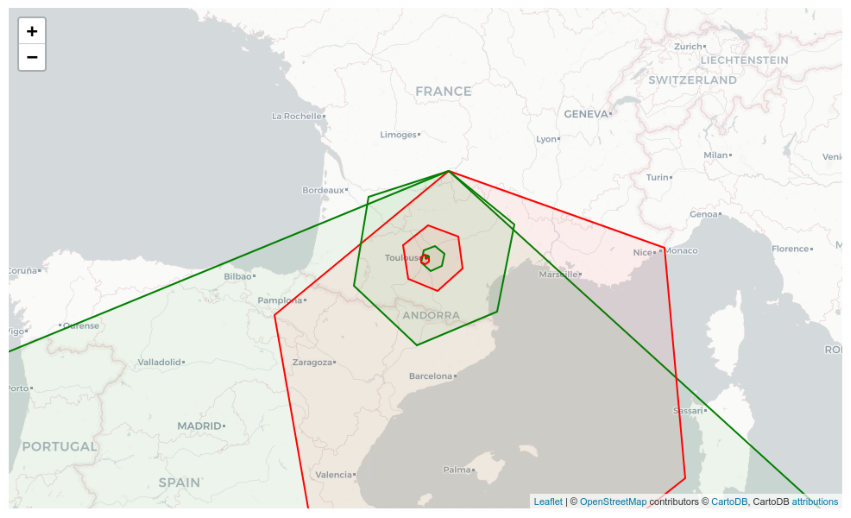

In [29]:
fig, ax = plt.subplots(1, 1, figsize = (15, 10))

im1 = pilim.open('images/1_resolutions.png', 'r')
ax.imshow(np.asarray(im1))
ax.set_axis_off();

Note: the color scheme of hexagons boundaries was coded with green for even resolution (0,2,4,etc) and red of odd resolution(1,3,5,etc)  


## I.2. Inspect the parent - children relationship in the H3 hierarchy



This section is particularly useful for understanding the implications of replacing children with the parent cell (as it is the case of using h3.compact)

In [30]:
res_parent = 9
h3_cell_parent = h3.geo_to_h3(lat = lat_centr_point,
                              lng = lon_centr_point,
                              resolution = res_parent
                              )
h3_cells_children = list(h3.h3_to_children(h = h3_cell_parent))
assert(len(h3_cells_children) == math.pow(7, 1))
# ------
h3_cells_grandchildren = list(h3.h3_to_children(h = h3_cell_parent, 
                                                res = res_parent + 2))
assert(len(h3_cells_grandchildren) == math.pow(7, 2))
# ------
h3_cells_2xgrandchildren = list(h3.h3_to_children(h = h3_cell_parent, 
                                                  res = res_parent + 3))
assert(len(h3_cells_2xgrandchildren) == math.pow(7, 3))

# ------
h3_cells_3xgrandchildren = list(h3.h3_to_children(h = h3_cell_parent, 
                                                  res = res_parent + 4))
assert(len(h3_cells_3xgrandchildren) == math.pow(7, 4))
# ------

msg_ = """Parent cell: {} has :
          {} direct children, 
          {} grandchildren,
          {} grandgrandchildren, 
          {} grandgrandgrandchildren"""
print(msg_.format(h3_cell_parent, len(h3_cells_children),
                  len(h3_cells_grandchildren), 
                  len(h3_cells_2xgrandchildren),
                  len(h3_cells_3xgrandchildren)))
      

Parent cell: 8939601ae67ffff has :
          7 direct children, 
          49 grandchildren,
          343 grandgrandchildren, 
          2401 grandgrandgrandchildren


In [31]:
def plot_parent_and_descendents(h3_cell_parent, h3_cells_children, ax=None):
                                
    list_distances_to_center = []
                                
    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize = (5, 5))
    
    boundary_parent_coords = h3.h3_to_geo_boundary(h=h3_cell_parent, geo_json=True)
    boundary_parent = geometry.Polygon(boundary_parent_coords)
    # print(boundary_parent.wkt, "\n")
    res_parent = h3.h3_get_resolution(h3_cell_parent)
    
    # get the central descendent at the resolution of h3_cells_children
    res_children = h3.h3_get_resolution(h3_cells_children[0])
    centerhex = h3.h3_to_center_child(h = h3_cell_parent, res = res_children)

    # get the boundary of the multipolygon of the H3 cells union
    boundary_children_union_coords = h3.h3_set_to_multi_polygon(
                                               hexes = h3_cells_children,
                                               geo_json = True)[0][0]
    # close the linestring
    boundary_children_union_coords.append(boundary_children_union_coords[0])
    boundary_children_union = geometry.Polygon(boundary_children_union_coords)
    # print(boundary_children_union.wkt, "\n")
    
    # compute the overlapping geometry
    # (the intersection of the boundary_parent with boundary_children_union):
    overlap_geom = boundary_parent.intersection(boundary_children_union)
    print("overlap approx: {}".format(round(overlap_geom.area / boundary_parent.area, 4))) 

    # plot
    dict_adjust_textpos = {7: 0.0003, 8: 0.0001, 9: 0.00005, 10: 0.00002}
    
    for child in h3_cells_children:
        boundary_child_coords = h3.h3_to_geo_boundary(h = child, geo_json = True)
        boundary_child = geometry.Polygon(boundary_child_coords)
        ax.plot(*boundary_child.exterior.coords.xy, color = "grey", linestyle="--")
        
        dist_to_centerhex = h3.h3_distance(h1 = centerhex, h2 = child)
        list_distances_to_center.append(dist_to_centerhex)
                                
        if res_children <= res_parent + 3:
            # add text
            ax.text(x = boundary_child.centroid.x - dict_adjust_textpos[res_parent],
                    y = boundary_child.centroid.y - dict_adjust_textpos[res_parent],
                    s = str(dist_to_centerhex),
                    fontsize = 12, color = "black", weight = "bold")
    
    ax.plot(*boundary_children_union.exterior.coords.xy, color = "blue")
    ax.plot(*boundary_parent.exterior.coords.xy, color = "red", linewidth=2)
                                
    return list_distances_to_center

overlap approx: 0.9286
overlap approx: 0.9388
overlap approx: 0.9344
overlap approx: 0.935


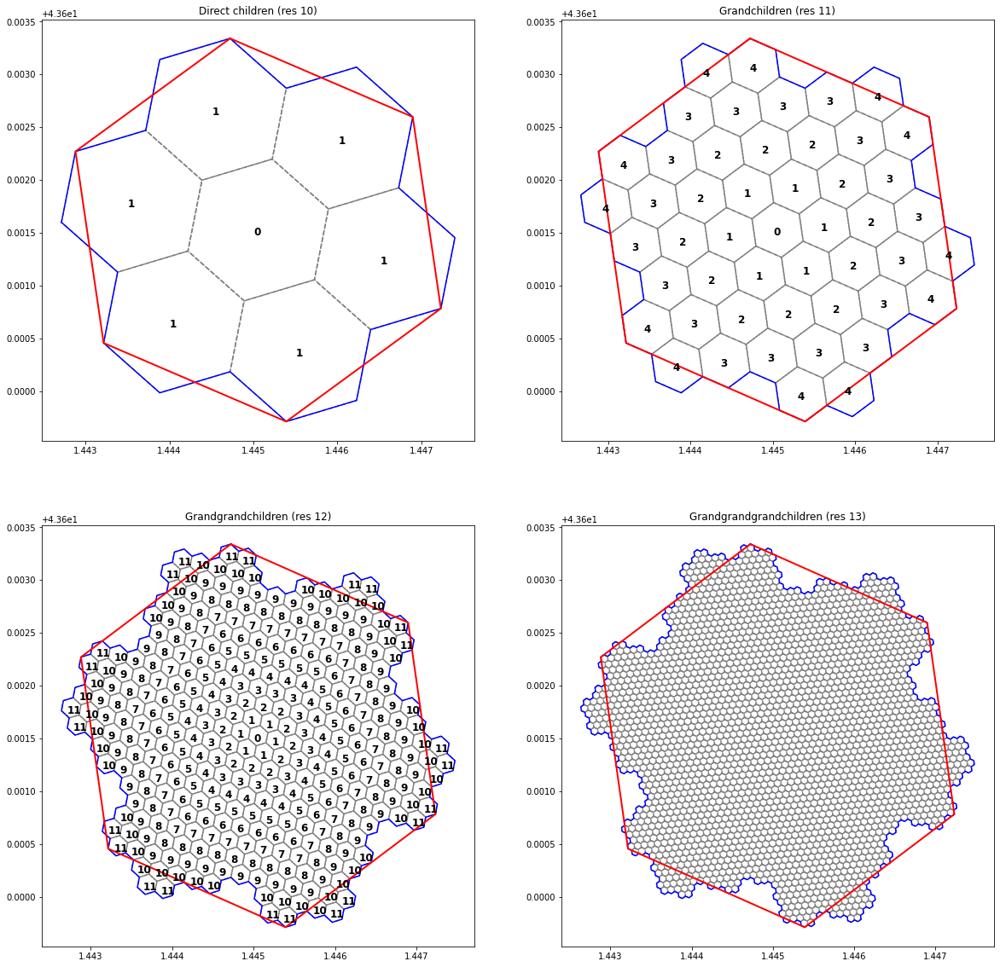

In [32]:
fig, ax = plt.subplots(2, 2, figsize = (20, 20))
list_distances_to_center_dc = plot_parent_and_descendents(h3_cell_parent, 
                                                          h3_cells_children, 
                                                          ax = ax[0][0])
list_distances_to_center_gc = plot_parent_and_descendents(h3_cell_parent,
                                                          h3_cells_grandchildren,
                                                          ax = ax[0][1])
list_distances_to_center_2xgc = plot_parent_and_descendents(h3_cell_parent, 
                                                            h3_cells_2xgrandchildren, 
                                                            ax = ax[1][0])
list_distances_to_center_3xgc = plot_parent_and_descendents(h3_cell_parent,
                                                            h3_cells_3xgrandchildren,
                                                            ax = ax[1][1])


ax[0][0].set_title("Direct children (res 10)")
ax[0][1].set_title("Grandchildren (res 11)")
ax[1][0].set_title("Grandgrandchildren (res 12)")
ax[1][1].set_title("Grandgrandgrandchildren (res 13)");
# ax[1][1].axis('off');

We could buffer the parent, so that all initial descendents are guaranteed to be included.   
For this, we determine the incomplete hollow rings relative to the central child at given resolution.

By default (if complete), on hollow ring k there are $k * 6$ cells, for $k >=1$ 

In [33]:
def highlight_incomplete_hollowrings(list_distances_to_center):
    c = Counter(list_distances_to_center)
    print(c)
    list_incomplete = []
    for k in c:
        if (k > 1) and (c[k] != 6 * k):
            list_incomplete.append(k)
    print("List incomplete hollow rings:", sorted(list_incomplete))

In [34]:
highlight_incomplete_hollowrings(list_distances_to_center_dc)
print("-----------------------------------------------------")
highlight_incomplete_hollowrings(list_distances_to_center_gc)
print("-----------------------------------------------------")
highlight_incomplete_hollowrings(list_distances_to_center_2xgc)
print("-----------------------------------------------------")
highlight_incomplete_hollowrings(list_distances_to_center_3xgc)

Counter({1: 6, 0: 1})
List incomplete hollow rings: []
-----------------------------------------------------
Counter({3: 18, 2: 12, 4: 12, 1: 6, 0: 1})
List incomplete hollow rings: [4]
-----------------------------------------------------
Counter({9: 54, 8: 48, 10: 48, 7: 42, 6: 36, 5: 30, 4: 24, 11: 24, 3: 18, 2: 12, 1: 6, 0: 1})
List incomplete hollow rings: [10, 11]
-----------------------------------------------------
Counter({23: 138, 22: 132, 24: 132, 21: 126, 20: 120, 19: 114, 25: 108, 18: 108, 17: 102, 16: 96, 15: 90, 26: 84, 30: 84, 29: 84, 14: 84, 28: 84, 27: 84, 13: 78, 12: 72, 11: 66, 31: 60, 10: 60, 9: 54, 8: 48, 7: 42, 6: 36, 5: 30, 4: 24, 32: 24, 3: 18, 2: 12, 1: 6, 0: 1})
List incomplete hollow rings: [24, 25, 26, 27, 28, 29, 30, 31, 32]


## I.3. Spatial arrangement of H3 cells in the ij coordinate system

Read: https://h3geo.org/docs/core-library/coordsystems


In [35]:
help(h3.experimental_h3_to_local_ij)

Help on function experimental_h3_to_local_ij in module h3.api._api_template:

experimental_h3_to_local_ij(origin, h)
    Return local (i,j) coordinates of cell `h` in relation to `origin` cell
    
    
    Parameters
    ----------
    origin : H3Cell
        Origin/central cell for defining i,j coordinates.
    h: H3Cell
        Destination cell whose i,j coordinates we'd like, based off
        of the origin cell.
    
    
    Returns
    -------
    Tuple (i, j) of integer local coordinates of cell `h`
    
    
    Implementation Notes
    --------------------
    
    The `origin` cell does not define (0, 0) for the IJ coordinate space.
    (0, 0) refers to the center of the base cell containing origin at the
    resolution of `origin`.
    Subtracting the IJ coordinates of `origin` from every cell would get
    you the property of (0, 0) being the `origin`.
    
    This is done so we don't need to keep recomputing the coordinates of
    `origin` if not needed.



In [36]:
def explore_ij_coords(lat_point, lon_point, num_rings = 3, ax = None):

    # an example at resolution 9
    hex_id_ex = h3.geo_to_h3(lat = lat_point,
                             lng = lon_point,
                             resolution = 9
                             )
    assert(h3.h3_get_resolution(hex_id_ex) == 9)

    # get its rings
    list_siblings = list(h3.hex_range_distances(h = hex_id_ex, 
                                                K = num_rings))

    dict_ij = {}
    dict_color = {}
    dict_s = {}

    if ax is None:
        figsize = (min(6 * num_rings, 15), min(6 * num_rings, 15))
        fig, ax = plt.subplots(1, 1, figsize = figsize)

    for ring_level in range(len(list_siblings)):

        if ring_level == 0:
            fontcol = "red"
        elif ring_level == 1:
            fontcol = "blue"
        elif ring_level == 2:
            fontcol = "green"
        else:
            fontcol = "brown"

        if ring_level == 0:
            # on ring 0 is only hex_id_ex
            geom_boundary_coords = h3.h3_to_geo_boundary(hex_id_ex,
                                                         geo_json = True)
            geom_shp = geometry.Polygon(geom_boundary_coords)
            ax.plot(*geom_shp.exterior.xy, color = "purple")

            ij_ex = h3.experimental_h3_to_local_ij(origin = hex_id_ex,
                                                   h = hex_id_ex)
            s = " {} \n \n (0,0)".format(ij_ex)

            dict_ij[hex_id_ex] = ij_ex
            dict_color[hex_id_ex] = "red"
            dict_s[hex_id_ex] = s        

            ax.text(x = geom_shp.centroid.x - 0.0017,
                    y = geom_shp.centroid.y - 0.0005,
                    s = s,
                    fontsize = 11, color = fontcol, weight = "bold")
        else:
            # get the hex ids resident on ring_level
            siblings_on_ring = list(list_siblings[ring_level])

            k = 1
            for sibling_hex in sorted(siblings_on_ring):
                geom_boundary_coords = h3.h3_to_geo_boundary(sibling_hex,
                                                             geo_json=True)
                geom_shp = geometry.Polygon(geom_boundary_coords)
                ax.plot(*geom_shp.exterior.xy, color = "purple")

                ij = h3.experimental_h3_to_local_ij(origin = hex_id_ex,
                                                    h = sibling_hex)
                ij_diff = (ij[0] - ij_ex[0], ij[1] - ij_ex[1])
                s = " {} \n \n {}".format(ij, ij_diff)
                k = k + 1

                dict_ij[sibling_hex] = ij    
                dict_color[sibling_hex] = fontcol
                dict_s[sibling_hex] = s

                ax.text(x = geom_shp.centroid.x - 0.0017,
                        y = geom_shp.centroid.y - 0.0005,
                        s = s,
                        fontsize = 11, color = fontcol, weight = "bold")

    ax.set_ylabel("Latitude")
    ax.set_xlabel("Longitude")
    
    return dict_ij, dict_color, dict_s

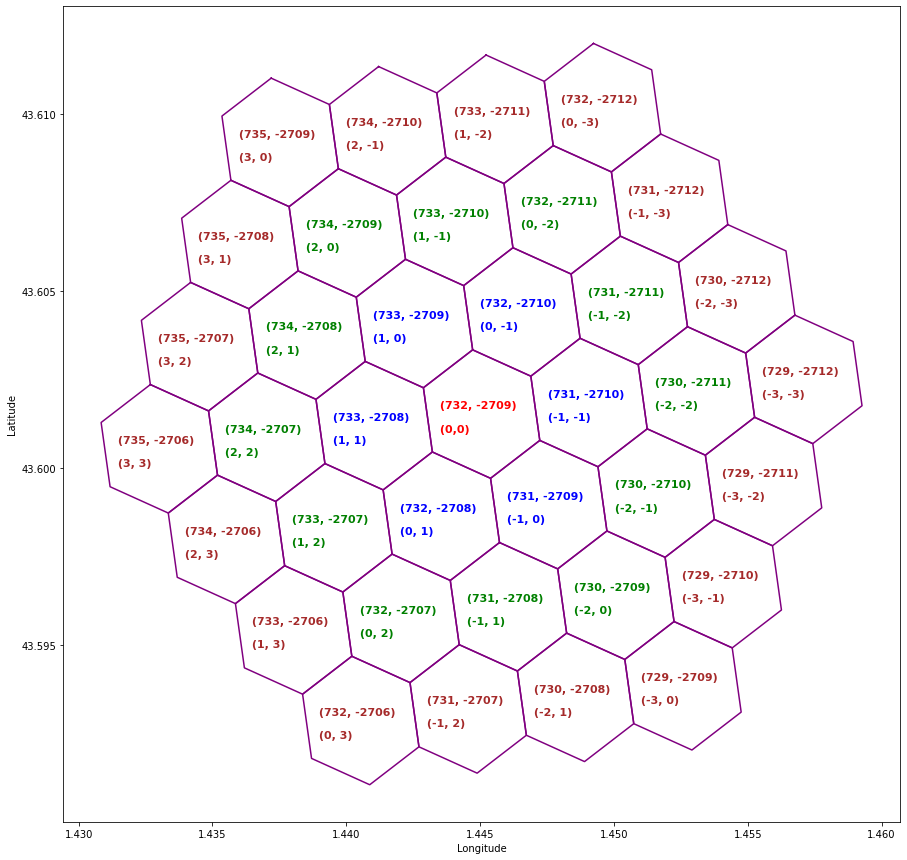

In [37]:
dict_ij, dict_color, dict_s = explore_ij_coords(lat_point = lat_centr_point,
                                                lon_point = lon_centr_point)

Note that choosing a GPS point in other parts of the world results in different relative i and j arrangements (with respect to compass NESW).  
Here is an illustration for ring 1 neighbours: 


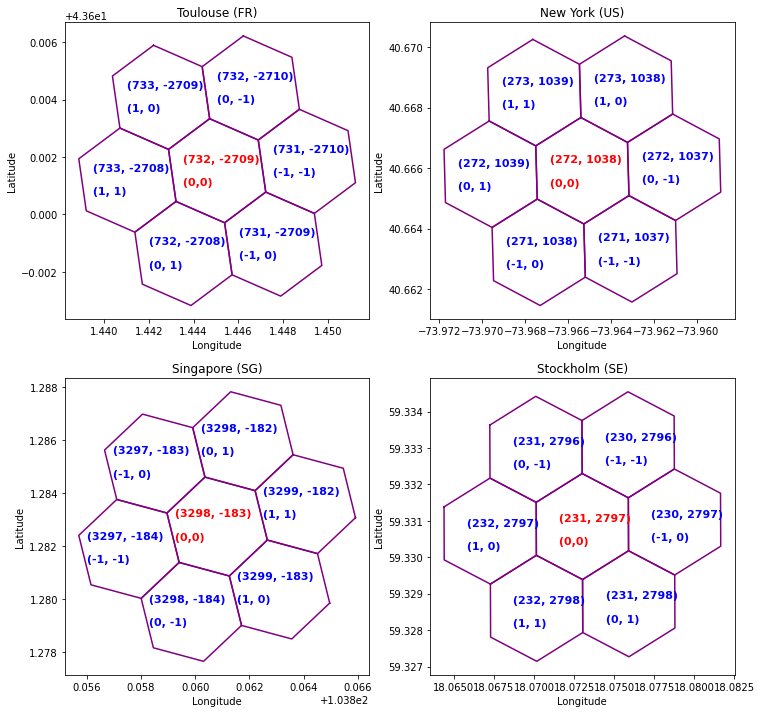

In [38]:
fig, ax = plt.subplots(2, 2, figsize = (12, 12))

# in Toulouse
_ = explore_ij_coords(lat_point = lat_centr_point,
                      lon_point = lon_centr_point,
                      num_rings = 1,
                      ax = ax[0][0])
ax[0][0].set_title("Toulouse (FR)")

# in New York
_ = explore_ij_coords(lat_point = 40.665634, 
                      lon_point = -73.964768,
                      num_rings = 1,
                      ax = ax[0][1])
ax[0][1].set_title("New York (US)")

# in Singapore
_ = explore_ij_coords(lat_point = 1.282892, 
                      lon_point = 103.862396,
                      num_rings = 1,
                      ax = ax[1][0])
ax[1][0].set_title("Singapore (SG)")


# in Stockholm 
_ = explore_ij_coords(lat_point = 59.330506, 
                      lon_point = 18.072043,
                      num_rings = 1,
                      ax = ax[1][1])
ax[1][1].set_title("Stockholm (SE)");


Anticipating the ML section of this notebook, we put these 4 rings of hexagons in a 2d array.  
A preliminary step is to transform i and j as follows:

In [39]:
min_i = min([dict_ij[h][0] for h in dict_ij])
min_j = min([dict_ij[h][1] for h in dict_ij])

max_i = max([dict_ij[h][0] for h in dict_ij])
max_j = max([dict_ij[h][1] for h in dict_ij])

print("i between {} and {}".format(min_i, max_i))
print("j between {} and {}".format(min_j, max_j))

# rescale
dict_ij_rescaled = {}
for h in dict_ij:
    dict_ij_rescaled[h] = [dict_ij[h][0] - min_i, dict_ij[h][1] - min_j]
    # print(dict_ij[h], "-->", dict_ij_rescaled[h])


i between 729 and 735
j between -2712 and -2706


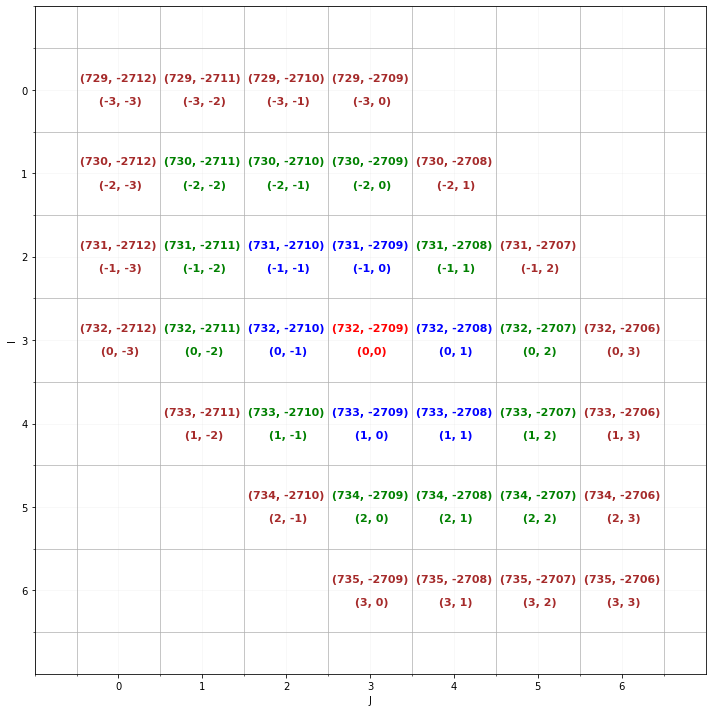

In [40]:
fig, ax = plt.subplots(1, 1, figsize = (10, 10))

i_range = list(range(0, max_i - min_i + 1))
j_range = list(range(0, max_j - min_j + 1))


ax.set_xticks(np.arange(len(j_range)))
ax.set_yticks(np.arange(len(i_range)))
ax.set_xticklabels(j_range)
ax.set_yticklabels(i_range)

minor_ticks_x = np.arange(-1, max_j - min_j + 1, 0.5)
minor_ticks_y = np.arange(-1, max_i - min_i + 1, 0.5)
ax.set_xticks(minor_ticks_x, minor=True)
ax.set_yticks(minor_ticks_y, minor=True)

for h in dict_ij_rescaled:
    ax.text(x = dict_ij_rescaled[h][1],
            y = dict_ij_rescaled[h][0],
            s = dict_s[h],
            fontsize = 11, color = dict_color[h],
            ha="center", va="center", weight = "bold")
    
ax.set_xlim(-1, max_j - min_j + 1)
ax.set_ylim(-1, max_i - min_i + 1)

ax.grid(which='major', alpha = 0.1)
ax.grid(which='minor', alpha = 0.9)

ax.set_xlabel("J")
ax.set_ylabel("I")

ax.invert_yaxis()

fig.tight_layout();

------------------------

-------------------

# II. Use H3 indexing for spatial operations

## II.1. Prepare data - GeoJSON file of bus stops

In [41]:
def load_and_prepare_busstops(filepath):
    """Loads a geojson files of point geometries and features,
    extracts the latitude and longitude into separate columns,
    deduplicates busstops (since multiple buslines share them)"""

    gdf_raw = gpd.read_file(filepath, driver="GeoJSON")
    print("Total number of bus stops in original dataset", gdf_raw.shape[0]) 

    gdf_raw["latitude"] = gdf_raw["geometry"].apply(lambda p: p.y)
    gdf_raw["longitude"] = gdf_raw["geometry"].apply(lambda p: p.x)

    # reset index to store it in a column
    gdf_raw.reset_index(inplace=True, drop = False)
    
    return gdf_raw

In [42]:
input_file_busstops = "datasets_demo/busstops_Toulouse.geojson"
gdf_raw = load_and_prepare_busstops(filepath = input_file_busstops)

# display first 5 rows of the geodataframe, transposed
gdf_raw.head().T

Total number of bus stops in original dataset 8706


,0,1,2,3,4
index,0,1,2,3,4
gir,6704,3722,1521,1521,2312
code_expl,6192449487677451,6192449487677451,6192449487677451,6192449487677451,6192449487677451
pty,67/92,37/86,152/19,152/19,23/53
code_log,17,348,658,83,158
nom_ligne,Arènes / Plaisance Monestié,Jolimont / Ramonville,Empalot / IUC,Empalot / IUC,Jeanne d'Arc / Rangueil
ligne,67,37,152,152,23
ordre,6.00000,30.00000,11.00000,1.00000,33.00000
nom_log,Ardennes,Heredia,Rond-Point Langlade,Empalot,Colombette
id_ligne,67,37,152,152,23


In [43]:
def base_empty_map():
    """Prepares a folium map centered in a central GPS point of Toulouse"""
    m = Map(location = [43.600378, 1.445478],
            zoom_start = 9.5,
            tiles = "cartodbpositron",
            attr = '''© <a href="http://www.openstreetmap.org/copyright">
                      OpenStreetMap</a>contributors ©
                      <a href="http://cartodb.com/attributions#basemaps">
                      CartoDB</a>'''
            )
    return m

In [ ]:
# quick visualization on map of raw data

m = base_empty_map()
mc = MarkerCluster()

gdf_dedup = gdf_raw.drop_duplicates(subset=["latitude", "longitude"])
print("Total number of bus stops in deduplicated dataset", gdf_dedup.shape[0]) 

for i, row in gdf_dedup.iterrows():
    mk = Marker(location=[row["latitude"], row["longitude"]])
    mk.add_to(mc)

mc.add_to(m)
m

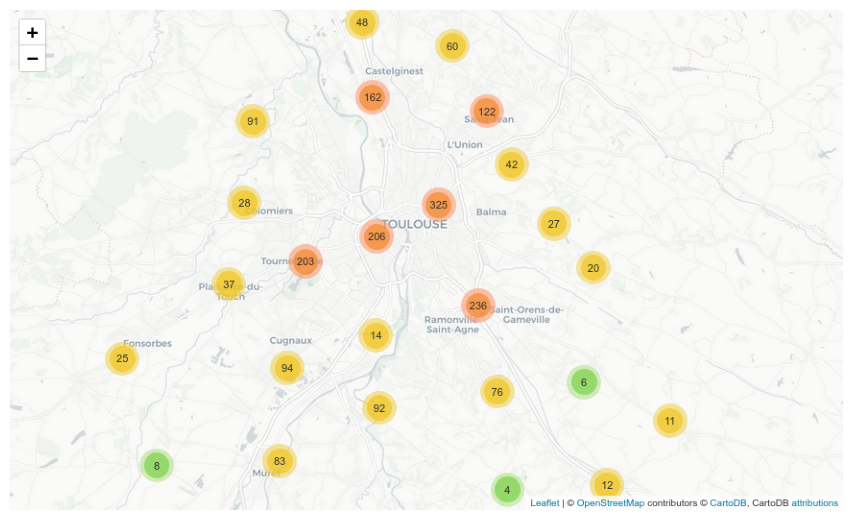

In [45]:
fig, ax = plt.subplots(1, 1, figsize = (15, 10))

im1 = pilim.open('images/2_markers_busstops.png', 'r')
ax.imshow(np.asarray(im1))
ax.set_axis_off();


Better yet, we can plot a heatmap with pydeck (Docs at https://pydeck.gl/index.html):

In [ ]:
help(pydeck.Deck.__init__)

In [47]:
# print(dir(cm.linear))

steps = 5
color_map = cm.linear.RdYlGn_10.scale(0, 1).to_step(steps)

# in reverse order (green to red)
for i in range(steps-1, -1, -1):
    # would be fractional values, but we need them as RGB in [0,255]
    # also drop the alpha (4th element)
    print([int(255 * x) for x in color_map.colors[i][:-1]])

color_map

[0, 104, 55]
[117, 195, 100]
[235, 231, 139]
[246, 125, 74]
[165, 0, 38]


In [ ]:
COLOR_SCALE = [
    [0, 104, 55],
    [117, 195, 100],
    [235, 231, 139],
    [246, 125, 74],
    [165, 0, 38]
]

busstops_layer = pydeck.Layer(
                    "HeatmapLayer",
                    data = gdf_dedup,
                    opacity = 0.2,
                    get_position = ["longitude", "latitude"],
                    threshold = 0.05,
                    intensity = 1,
                    radiusPixels = 30,
                    pickable = False,
                    color_range=COLOR_SCALE,
                )

view = pydeck.data_utils.compute_view(gdf_dedup[["longitude", "latitude"]])
view.zoom = 6

MAPBOX_TOKEN = '<THE_MAPBOX_API_TOKEN_HERE>';

r = pydeck.Deck(
    layers=[busstops_layer],
    initial_view_state = view,
    mapbox_key = MAPBOX_TOKEN,
    map_style='mapbox://styles/mapbox/light-v9'
)

r.show()

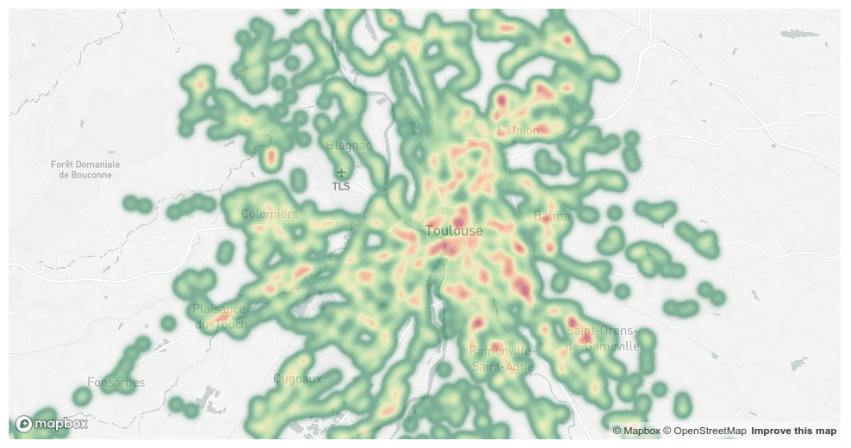

In [49]:
fig, ax = plt.subplots(1, 1, figsize = (15, 10))

im1 = pilim.open('images/heatmap_busstop_.png', 'r')
ax.imshow(np.asarray(im1))
ax.set_axis_off();

**Create a new dataframe to work with throughout the notebook:**

In [50]:
gdf_raw_cpy = gdf_raw.reset_index(inplace = False, drop = False)
df_stops_to_buslines = gdf_raw_cpy.groupby(by=["longitude", "latitude"]).agg(
                                    {"index": list, "ligne": set, "nom_log": "first"})

df_stops_to_buslines["info"] = df_stops_to_buslines[["nom_log", "ligne"]].apply(
                                  lambda x: "{} ({})".format(x[0], ",".join(list(x[1]))), 
                                  axis = 1)
df_stops_to_buslines.reset_index(inplace = True, drop = False)
df_stops_to_buslines.head()


,longitude,latitude,index,ligne,nom_log,info
0,1.16201,43.51514,"[1208, 6653]",{116},Saint Lys Rossignols,Saint Lys Rossignols (116)
1,1.17214,43.51300,"[4134, 4135, 7880, 7881]","{315, 116}",Piscine,"Piscine (315,116)"
2,1.17354,43.50968,"[4138, 4139, 4140, 6657]","{315, 116}",8 mai 1945,"8 mai 1945 (315,116)"
3,1.17521,43.50767,"[1212, 4136, 4137, 6656]","{315, 116}",Barrat,"Barrat (315,116)"
4,1.17616,43.51513,"[2390, 4133]",{315},Boulodrome,Boulodrome (315)


## II.2. Index data spatially with H3

In [51]:
# index each data point into the spatial index of the specified resolution
for res in range(7, 11):
    col_hex_id = "hex_id_{}".format(res)
    col_geom = "geometry_{}".format(res)
    msg_ = "At resolution {} -->  H3 cell id : {} and its geometry: {} "
    print(msg_.format(res, col_hex_id, col_geom))

    df_stops_to_buslines[col_hex_id] = df_stops_to_buslines.apply(
                                        lambda row: h3.geo_to_h3(
                                                    lat = row["latitude"],
                                                    lng = row["longitude"],
                                                    resolution = res),
                                        axis = 1)

    # use h3.h3_to_geo_boundary to obtain the geometries of these hexagons
    df_stops_to_buslines[col_geom] = df_stops_to_buslines[col_hex_id].apply(
                                        lambda x: {"type": "Polygon",
                                                   "coordinates":
                                                   [h3.h3_to_geo_boundary(
                                                       h=x, geo_json=True)]
                                                   }
                                         )
# transpose for better display
df_stops_to_buslines.head().T

At resolution 7 -->  H3 cell id : hex_id_7 and its geometry: geometry_7 
At resolution 8 -->  H3 cell id : hex_id_8 and its geometry: geometry_8 
At resolution 9 -->  H3 cell id : hex_id_9 and its geometry: geometry_9 
At resolution 10 -->  H3 cell id : hex_id_10 and its geometry: geometry_10 


,0,1,2,3,4
longitude,1.16201,1.17214,1.17354,1.17521,1.17616
latitude,43.51514,43.51300,43.50968,43.50767,43.51513
index,"[1208, 6653]","[4134, 4135, 7880, 7881]","[4138, 4139, 4140, 6657]","[1212, 4136, 4137, 6656]","[2390, 4133]"
ligne,{116},"{315, 116}","{315, 116}","{315, 116}",{315}
nom_log,Saint Lys Rossignols,Piscine,8 mai 1945,Barrat,Boulodrome
info,Saint Lys Rossignols (116),"Piscine (315,116)","8 mai 1945 (315,116)","Barrat (315,116)",Boulodrome (315)
hex_id_7,873960cd0ffffff,873960cd0ffffff,873960cd0ffffff,873960cd0ffffff,873960cd0ffffff
geometry_7,"{'type': 'Polygon', 'coordinates': [((1.1682108111794347, 4...","{'type': 'Polygon', 'coordinates': [((1.1682108111794347, 4...","{'type': 'Polygon', 'coordinates': [((1.1682108111794347, 4...","{'type': 'Polygon', 'coordinates': [((1.1682108111794347, 4...","{'type': 'Polygon', 'coordinates': [((1.1682108111794347, 4..."
hex_id_8,883960cd0dfffff,883960cd01fffff,883960cd01fffff,883960cd01fffff,883960cd0bfffff
geometry_8,"{'type': 'Polygon', 'coordinates': [((1.1612006014059548, 4...","{'type': 'Polygon', 'coordinates': [((1.1717612358664187, 4...","{'type': 'Polygon', 'coordinates': [((1.1717612358664187, 4...","{'type': 'Polygon', 'coordinates': [((1.1717612358664187, 4...","{'type': 'Polygon', 'coordinates': [((1.178771443825885, 43..."


## II.3 Compute K Nearest Neighbors (spatial search) using the H3 index

In [52]:
help(h3.hex_ring)

Help on function hex_ring in module h3.api._api_template:

hex_ring(h, k=1)
    Return unordered set of cells with H3 distance `== k` from `h`.
    That is, the "hollow" ring.
    
    Parameters
    ----------
    h : H3Cell
    k : int
        Size of ring.
    
    Returns
    -------
    unordered collection of H3Cell



Create an inverted index hex_id_9 to list of row indices in df_stops_to_buslines:

In [53]:
resolution_lookup = 9
hexes_column = "hex_id_{}".format(resolution_lookup)
print("Will operate on column: ", hexes_column)
df_aux = df_stops_to_buslines[[hexes_column]]
df_aux.reset_index(inplace = True, drop = False)
# columns are [index, hex_id_9]
lookup_hex_to_indices = pd.DataFrame(
                          df_aux.groupby(by = hexes_column)["index"].apply(list)
                        ).reset_index(inplace = False, drop = False)
lookup_hex_to_indices.rename(columns = {"index": "list_indices"}, inplace = True)
lookup_hex_to_indices["num_indices"] = lookup_hex_to_indices["list_indices"].apply(
                                                                   lambda x: len(x))

lookup_hex_to_indices.set_index(hexes_column, inplace = True)

print("Using {} hexagons".format(lookup_hex_to_indices.shape[0]))
lookup_hex_to_indices.sort_values(by = "num_indices", ascending = False).head()

Will operate on column:  hex_id_9
Using 1709 hexagons


,list_indices,num_indices
hex_id_9,,
893960185b7ffff,"[1012, 1029, 1035, 1036]",4
89396018dc3ffff,"[1602, 1607, 1612, 1613]",4
8939601ab17ffff,"[1561, 1566, 1570]",3
89396018677ffff,"[662, 680, 688]",3
89396018c9bffff,"[1342, 1343, 1364]",3


For a given GPS location, we index it and then iterate over its hollow rings until we collect the candidates. Last step for computing result in descending distance, is to compute the actual Haversine distance: 

In [54]:
chosen_point = (43.595707, 1.452252)
num_neighbors_wanted = 10

hex_source = h3.geo_to_h3(lat = chosen_point[0],
                          lng = chosen_point[1], 
                          resolution = 9)

list_candidates = []
rest_needed = num_neighbors_wanted - len(list_candidates)
ring_seqno = 0
hexes_processed = []

while rest_needed > 0:
    list_hexes_hollow_ring = list(h3.hex_ring(h = hex_source, k = ring_seqno))
    for hex_on_ring in list_hexes_hollow_ring:
        try:
            new_candidates = lookup_hex_to_indices.loc[hex_on_ring]["list_indices"]
            list_candidates.extend(new_candidates)
        except Exception:
            # we may get KeyError when no entry in lookup_hex_to_indices for a hex id
            pass
        hexes_processed.append(hex_on_ring)
    
    msg_ = "processed ring: {}, candidates before: {}, candidates after: {}"
    print(msg_.format(ring_seqno, 
                      num_neighbors_wanted - rest_needed, 
                      len(list_candidates)))
    
    rest_needed = num_neighbors_wanted - len(list_candidates)
    ring_seqno = ring_seqno + 1
    
print("Candidate rows: \n", list_candidates)

processed ring: 0, candidates before: 0, candidates after: 1
processed ring: 1, candidates before: 1, candidates after: 9
processed ring: 2, candidates before: 9, candidates after: 19
Candidate rows: 
 [1220, 1267, 1256, 1280, 1231, 1255, 1195, 1201, 1211, 1222, 1120, 1137, 1148, 1152, 1204, 1171, 1315, 1261, 1279]


In [55]:
def haversine_dist(lon_src, lat_src, lon_dst, lat_dst):
    '''returns distance between GPS points, measured in meters'''

    lon1_rad, lat1_rad, lon2_rad, lat2_rad = map(np.radians, 
                                                 [lon_src, lat_src, lon_dst, lat_dst])

    dlon = lon2_rad - lon1_rad
    dlat = lat2_rad - lat1_rad

    a = np.sin(dlat / 2.0) ** 2 + np.cos(lat1_rad) * \
        np.cos(lat2_rad) * np.sin(dlon / 2.0) ** 2

    c = 2 * np.arcsin(np.sqrt(a))
    km = 6367 * c
    return km * 1000

In [56]:
ordered_candidates_by_distance = []

for candid in list_candidates:
    candid_busstop_lat = df_stops_to_buslines.iloc[candid]["latitude"]
    candid_busstop_lon = df_stops_to_buslines.iloc[candid]["longitude"]
    
    # compute Haversine to source
    dist_to_source = haversine_dist(lon_src = chosen_point[1], 
                                    lat_src = chosen_point[0], 
                                    lon_dst = candid_busstop_lon,
                                    lat_dst = candid_busstop_lat)
    
    if len(ordered_candidates_by_distance) == 0:
        ordered_candidates_by_distance.append((dist_to_source, candid))
    else:
        bisect.insort(ordered_candidates_by_distance, (dist_to_source, candid))


pprint(ordered_candidates_by_distance)

print("-------------------------------------------------")
# the final result
final_result = ordered_candidates_by_distance[0:num_neighbors_wanted]
list_candidates_result = [x[1] for x in final_result]
print(list_candidates_result)

[(110.30090345004336, 1220),
 (211.08447647799304, 1201),
 (241.09973884919881, 1171),
 (343.8694433008194, 1211),
 (394.46277577154916, 1256),
 (430.12188861082956, 1267),
 (469.8637112761113, 1137),
 (483.1633371728286, 1231),
 (550.8099362366282, 1280),
 (558.5488318871681, 1222),
 (561.4638710344096, 1152),
 (561.984178495105, 1195),
 (566.3756339553231, 1204),
 (573.5175535493113, 1120),
 (580.5753879614737, 1255),
 (647.3504992196245, 1148),
 (818.3981808448962, 1315),
 (830.3178617453524, 1279),
 (859.4396937242238, 1261)]
-------------------------------------------------
[1220, 1201, 1171, 1211, 1256, 1267, 1137, 1231, 1280, 1222]


Nearest bus stops: 
Grand Rond (L7,29,31,44)
Passerelle St-Sauveur (27)
Seel (27)
Périssé (SCOL6,L8,SCOL7)
Place Dupuy (L8,L1)
Port St-Etienne (SCOL6,L1,SCOL7)
François Verdier (L9,L8,29,L7,14,L1,44)
Quartier Général (L7,29,44)
Jardin des Plantes (L7,44)
Frizac (L7)
Salin-Parlement (L4)
Féral (VILLE)
Boulbonne (L9,L7,14,44)
Trois Banquets (VILLE)
Duméril (44)
Jardin Royal (31)
Lanfant (SCOL6,L8,SCOL7)
Guilhemery (27)
Aqueduc (SCOL6,L1,SCOL7)


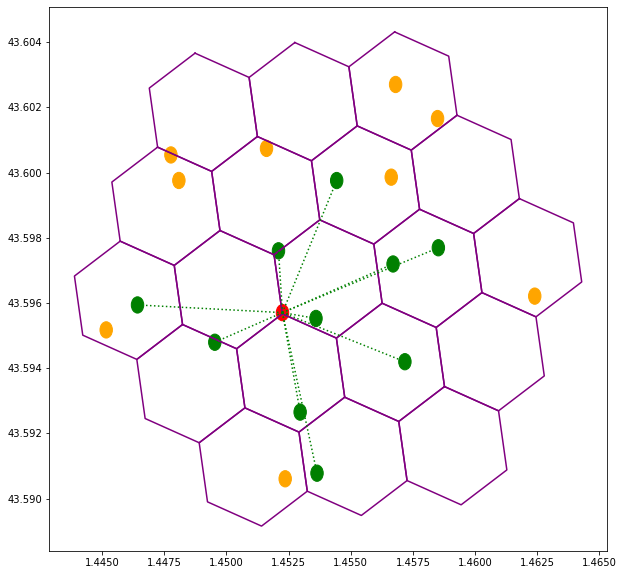

In [57]:
# plot the candidates
fig, ax = plt.subplots(1, 1, figsize = (10, 10))

for hex_id in hexes_processed:
    geom_boundary_coords = h3.h3_to_geo_boundary(hex_id,
                                                 geo_json = True)
    geom_shp = geometry.Polygon(geom_boundary_coords)
    ax.plot(*geom_shp.exterior.xy, color = "purple")
    
# the source in red
circle_source = plt.Circle((chosen_point[1], chosen_point[0]), 
                           0.00025, color='red')
ax.add_artist(circle_source)

print("Nearest bus stops: \n======================================")

# the nearest candidates in green, the rest of the candidates in orange
for candid in list_candidates:
    candid_busstop_lat = df_stops_to_buslines.iloc[candid]["latitude"]
    candid_busstop_lon = df_stops_to_buslines.iloc[candid]["longitude"]
    candid_busstop_info = df_stops_to_buslines.iloc[candid]["info"]
    
    print("{}".format(candid_busstop_info))
    
    if candid in list_candidates_result:
        circle_candid = plt.Circle((candid_busstop_lon, candid_busstop_lat), 
                                   0.00025, color='green')
        # draw a line if it's in he nearest neighbours final result
        ax.plot([chosen_point[1], candid_busstop_lon], 
                [chosen_point[0], candid_busstop_lat], 
                'green', linestyle=':', marker='')
    else:    
        circle_candid = plt.Circle((candid_busstop_lon, candid_busstop_lat), 
                                   0.00025, color='orange')
    ax.add_artist(circle_candid)
    

Note: there exist bus stops on the 2nd hollow ring that are nearer to the source (which is marked by red circle) than some of the bus stops on the 1st hollow ring.  
So it is adviseabale to always include one additional hollow ring of candidates before computing Haversine distance.

-------------

## II.4. Compute Point in Polygon (spatial join) using the H3 index

For this demo, we use the set of districts of Toulouse:

In [58]:
def load_and_prepare_districts(filepath):
    """Loads a geojson files of polygon geometries and features,
    swaps the latitude and longitude andstores geojson"""

    gdf_districts = gpd.read_file(filepath, driver="GeoJSON")
    
    gdf_districts["geom_geojson"] = gdf_districts["geometry"].apply(
                                              lambda x: geometry.mapping(x))

    gdf_districts["geom_swap"] = gdf_districts["geometry"].map(
                                              lambda polygon: ops.transform(
                                                  lambda x, y: (y, x), polygon))

    gdf_districts["geom_swap_geojson"] = gdf_districts["geom_swap"].apply(
                                              lambda x: geometry.mapping(x))
    
    return gdf_districts


In [59]:
input_file_districts = "datasets_demo/districts_Toulouse.geojson"
gdf_districts = load_and_prepare_districts(filepath = input_file_districts) 
 
print(gdf_districts.shape)
print("\n--------------------------------------------------------\n")
list_districts = list(gdf_districts["libelle_du_grand_quartier"].unique())
list_districts.sort()
print(columnize(list_districts, displaywidth=100))
print("\n--------------------------------------------------------\n")

gdf_districts[["libelle_du_grand_quartier", "geometry", 
               "geom_swap", "geom_swap_geojson"]].head()

(60, 90)

--------------------------------------------------------

AMIDONNIERS        CROIX-DE-PIERRE       LE BUSCA               RANGUEIL - CHR - FACULTES
ARENES             EMPALOT               LES CHALETS            REYNERIE                 
ARNAUD BERNARD     FAOURETTE             LES IZARDS             ROSERAIE                 
BAGATELLE          FER-A-CHEVAL          LES PRADETTES          SAINT-AGNE               
BARRIERE-DE-PARIS  FONTAINE-LESTANG      MARENGO - JOLIMONT     SAINT-AUBIN - DUPUY      
BASSO-CAMBO        GINESTOUS             MATABIAU               SAINT-CYPRIEN            
BELLEFONTAINE      GRAMONT               MINIMES                SAINT-ETIENNE            
BONNEFOY           GUILHEMERY            MIRAIL-UNIVERSITE      SAINT-GEORGES            
CAPITOLE           JULES JULIEN          MONTAUDRAN - LESPINET  SAINT-MARTIN-DU-TOUCH    
CARMES             JUNCASSE - ARGOULETS  PAPUS                  SAINT-MICHEL             
CASSELARDIT        LA CEPIERE   

,libelle_du_grand_quartier,geometry,geom_swap,geom_swap_geojson
0,POUVOURVILLE,"POLYGON ((1.43836 43.54349, 1.43861 43.54391, 1.43896 43.54...","POLYGON ((43.54349 1.43836, 43.54391 1.43861, 43.54451 1.43...","{'type': 'Polygon', 'coordinates': (((43.543488564769895, 1..."
1,MIRAIL-UNIVERSITE,"POLYGON ((1.40771 43.57711, 1.40926 43.57469, 1.40991 43.57...","POLYGON ((43.57711 1.40771, 43.57469 1.40926, 43.57367 1.40...","{'type': 'Polygon', 'coordinates': (((43.57710502457672, 1...."
2,BONNEFOY,"POLYGON ((1.46186 43.62289, 1.46217 43.62286, 1.46277 43.62...","POLYGON ((43.62289 1.46186, 43.62286 1.46217, 43.62269 1.46...","{'type': 'Polygon', 'coordinates': (((43.62289091647399, 1...."
3,GINESTOUS,"POLYGON ((1.42352 43.64833, 1.42323 43.64673, 1.42333 43.64...","POLYGON ((43.64833 1.42352, 43.64673 1.42323, 43.64672 1.42...","{'type': 'Polygon', 'coordinates': (((43.64832971716174, 1...."
4,SAINT-MARTIN-DU-TOUCH,"POLYGON ((1.35109 43.60620, 1.35224 43.60798, 1.35297 43.60...","POLYGON ((43.60620 1.35109, 43.60798 1.35224, 43.60899 1.35...","{'type': 'Polygon', 'coordinates': (((43.60620250781113, 1...."


The approach is to fill each district geometry with hexgons at resolution 13 and then compact them.

**Initial fill:**

In [60]:
help(h3.polyfill)

Help on function polyfill in module h3.api._api_template:

polyfill(geojson, res, geo_json_conformant=False)
    Get set of hexagons whose *centers* are contained within
    a GeoJSON-style polygon.
    
    Parameters
    ----------
    geojson : dict
        GeoJSON-style input dictionary describing a polygon (optionally
        including holes).
    
        Dictionary should be formatted like:
    
        ```
        {
            'type': 'Polygon',
            'coordinates': [outer, hole1, hole2, ...],
        }
        ```
        `outer`, `hole1`, etc., are lists of geo coordinate tuples.
        The holes are optional.
    
    res : int
        Desired output resolution for cells.
    geo_json_conformant : bool, optional
        When `True`, `outer`, `hole1`, etc. must be sequences of
        lng/lat pairs, with the last the same as the first.
        When `False`, they must be sequences of lat/lng pairs,
        with the last not needing to match the first.
    
    Returns


In [61]:
def fill_hexagons(geom_geojson, res, flag_swap = False, flag_return_df = False):
    """Fills a geometry given in geojson format with H3 hexagons at specified
    resolution. The flag_reverse_geojson allows to specify whether the geometry
    is lon/lat or swapped"""

    set_hexagons = h3.polyfill(geojson = geom_geojson,
                               res = res,
                               geo_json_conformant = flag_swap)
    list_hexagons_filling = list(set_hexagons)

    if flag_return_df is True:
        # make dataframe
        df_fill_hex = pd.DataFrame({"hex_id": list_hexagons_filling})
        df_fill_hex["value"] = 0
        df_fill_hex['geometry'] = df_fill_hex.hex_id.apply(
                                    lambda x:
                                    {"type": "Polygon",
                                     "coordinates": [
                                        h3.h3_to_geo_boundary(h=x,
                                                              geo_json=True)
                                        ]
                                     })
        assert(df_fill_hex.shape[0] == len(list_hexagons_filling))
        return df_fill_hex
    else:
        return list_hexagons_filling


In [62]:
gdf_districts["hex_fill_initial"] = gdf_districts["geom_swap_geojson"].apply(
                                         lambda x: list(fill_hexagons(geom_geojson = x, 
                                                                      res = 13))
                                          )
gdf_districts["num_hex_fill_initial"] = gdf_districts["hex_fill_initial"].apply(len)

total_num_hex_initial = gdf_districts["num_hex_fill_initial"].sum()
print("Until here, we'd have to search over {} hexagons".format(total_num_hex_initial))

gdf_districts[["libelle_du_grand_quartier", "geometry", "num_hex_fill_initial"]].head()

Until here, we'd have to search over 2851449 hexagons


,libelle_du_grand_quartier,geometry,num_hex_fill_initial
0,POUVOURVILLE,"POLYGON ((1.43836 43.54349, 1.43861 43.54391, 1.43896 43.54...",68255
1,MIRAIL-UNIVERSITE,"POLYGON ((1.40771 43.57711, 1.40926 43.57469, 1.40991 43.57...",25403
2,BONNEFOY,"POLYGON ((1.46186 43.62289, 1.46217 43.62286, 1.46277 43.62...",36671
3,GINESTOUS,"POLYGON ((1.42352 43.64833, 1.42323 43.64673, 1.42333 43.64...",168200
4,SAINT-MARTIN-DU-TOUCH,"POLYGON ((1.35109 43.60620, 1.35224 43.60798, 1.35297 43.60...",158445


To reduce the number of hexagons we can benefit from H3 cells compacting.

**Compacted fill:**

In [63]:
help(h3.compact)

Help on function compact in module h3.api._api_template:

compact(hexes)
    Compact a collection of H3 cells by combining
    smaller cells into larger cells, if all child cells
    are present.
    
    Parameters
    ----------
    hexes : iterable of H3Cell
    
    Returns
    -------
    unordered collection of H3Cell



In [64]:
gdf_districts["hex_fill_compact"] = gdf_districts["hex_fill_initial"].apply(
                                                lambda x: list(h3.compact(x)))
gdf_districts["num_hex_fill_compact"] = gdf_districts["hex_fill_compact"].apply(len)

print("Reduced number of cells from {} to {} \n".format(
            gdf_districts["num_hex_fill_initial"].sum(),
            gdf_districts["num_hex_fill_compact"].sum()))

# count cells by index resolution after compacting

gdf_districts["hex_resolutions"] = gdf_districts["hex_fill_compact"].apply(
                                            lambda x: 
                                            [h3.h3_get_resolution(hexid) for hexid in x])
gdf_districts["hex_resolutions_counts"] = gdf_districts["hex_resolutions"].apply(
                                            lambda x: Counter(x))


gdf_districts[["libelle_du_grand_quartier", "geometry", 
               "num_hex_fill_initial", "num_hex_fill_compact", 
               "hex_resolutions_counts"]].head()

Reduced number of cells from 2851449 to 94287 



,libelle_du_grand_quartier,geometry,num_hex_fill_initial,num_hex_fill_compact,hex_resolutions_counts
0,POUVOURVILLE,"POLYGON ((1.43836 43.54349, 1.43861 43.54391, 1.43896 43.54...",68255,2813,"{12: 668, 13: 1839, 11: 224, 10: 71, 9: 11}"
1,MIRAIL-UNIVERSITE,"POLYGON ((1.40771 43.57711, 1.40926 43.57469, 1.40991 43.57...",25403,1175,"{13: 749, 12: 288, 11: 105, 10: 30, 9: 3}"
2,BONNEFOY,"POLYGON ((1.46186 43.62289, 1.46217 43.62286, 1.46277 43.62...",36671,1811,"{11: 158, 13: 1167, 12: 438, 10: 44, 9: 4}"
3,GINESTOUS,"POLYGON ((1.42352 43.64833, 1.42323 43.64673, 1.42333 43.64...",168200,3446,"{13: 2132, 12: 834, 10: 120, 11: 323, 9: 36, 8: 1}"
4,SAINT-MARTIN-DU-TOUCH,"POLYGON ((1.35109 43.60620, 1.35224 43.60798, 1.35297 43.60...",158445,3459,"{13: 2219, 11: 274, 12: 849, 10: 98, 9: 15, 8: 4}"


In [65]:
# this column of empty lists is a placeholder, will be used further in this section
gdf_districts["compacted_novoids"] = [[] for _ in range(gdf_districts.shape[0])]

In [66]:
def plot_basemap_region_fill(df_boundaries_zones, initial_map = None):
    
    """On a folium map, add the boundaries of the geometries in geojson formatted
       column of df_boundaries_zones"""

    if initial_map is None:
        initial_map = base_empty_map()

    feature_group = folium.FeatureGroup(name='Boundaries')

    for i, row in df_boundaries_zones.iterrows():
        feature_sel = Feature(geometry = row["geom_geojson"], id=str(i))
        feat_collection_sel = FeatureCollection([feature_sel])
        geojson_subzone = json.dumps(feat_collection_sel)

        GeoJson(
                geojson_subzone,
                style_function=lambda feature: {
                    'fillColor': None,
                    'color': 'blue',
                    'weight': 5,
                    'fillOpacity': 0
                }
            ).add_to(feature_group)

    feature_group.add_to(initial_map)
    return initial_map

# ---------------------------------------------------------------------------


def hexagons_dataframe_to_geojson(df_hex, hex_id_field,
                                  geometry_field, value_field,
                                  file_output = None):

    """Produce the GeoJSON representation containing all geometries in a dataframe
     based on a column in geojson format (geometry_field)"""

    list_features = []

    for i, row in df_hex.iterrows():
        feature = Feature(geometry = row[geometry_field],
                          id = row[hex_id_field],
                          properties = {"value": row[value_field]})
        list_features.append(feature)

    feat_collection = FeatureCollection(list_features)

    geojson_result = json.dumps(feat_collection)

    # optionally write to file
    if file_output is not None:
        with open(file_output, "w") as f:
            json.dump(feat_collection, f)

    return geojson_result

# ---------------------------------------------------------------------------------


def map_addlayer_filling(df_fill_hex, layer_name, map_initial, fillcolor = None):
    """ On a folium map (likely created with plot_basemap_region_fill),
        add a layer of hexagons that filled the geometry at given H3 resolution
        (df_fill_hex returned by fill_hexagons method)"""

    geojson_hx = hexagons_dataframe_to_geojson(df_fill_hex,
                                               hex_id_field = "hex_id",
                                               value_field = "value",
                                               geometry_field = "geometry")

    GeoJson(
            geojson_hx,
            style_function=lambda feature: {
                'fillColor': fillcolor,
                'color': 'red',
                'weight': 2,
                'fillOpacity': 0.1
            },
            name = layer_name
        ).add_to(map_initial)

    return map_initial

# -------------------------------------------------------------------------------------


def visualize_district_filled_compact(gdf_districts, 
                                      list_districts_names, 
                                      fillcolor = None):
       
    overall_map = base_empty_map()
    gdf_districts_sel = gdf_districts[gdf_districts["libelle_du_grand_quartier"]
                                      .isin(list_districts_names)] 
    
    map_district = plot_basemap_region_fill(gdf_districts_sel, 
                                            initial_map = overall_map)
    
    for i, row in gdf_districts_sel.iterrows():
    
        district_name = row["libelle_du_grand_quartier"]
        if len(row["compacted_novoids"]) > 0:
            list_hexagons_filling_compact = row["compacted_novoids"]
        else:
            list_hexagons_filling_compact = []
            
        list_hexagons_filling_compact.extend(row["hex_fill_compact"])
        list_hexagons_filling_compact = list(set(list_hexagons_filling_compact))

        # make dataframes
        df_fill_compact = pd.DataFrame({"hex_id": list_hexagons_filling_compact})
        df_fill_compact["value"] = 0
        df_fill_compact['geometry'] = df_fill_compact.hex_id.apply(
                                        lambda x: 
                                        {"type": "Polygon",
                                         "coordinates": [
                                             h3.h3_to_geo_boundary(h=x,
                                                                   geo_json=True)
                                         ]
                                         })

        map_fill_compact = map_addlayer_filling(df_fill_hex = df_fill_compact, 
                                                layer_name = district_name,
                                                map_initial = map_district,
                                                fillcolor = fillcolor)
        
    folium.map.LayerControl('bottomright', collapsed=True).add_to(map_fill_compact)

    return map_fill_compact

In [ ]:
list_districts_names = ["MIRAIL-UNIVERSITE", "BAGATELLE", "PAPUS",
                        "FAOURETTE", "CROIX-DE-PIERRE"]
visualize_district_filled_compact(gdf_districts = gdf_districts,
                                  list_districts_names = list_districts_names)

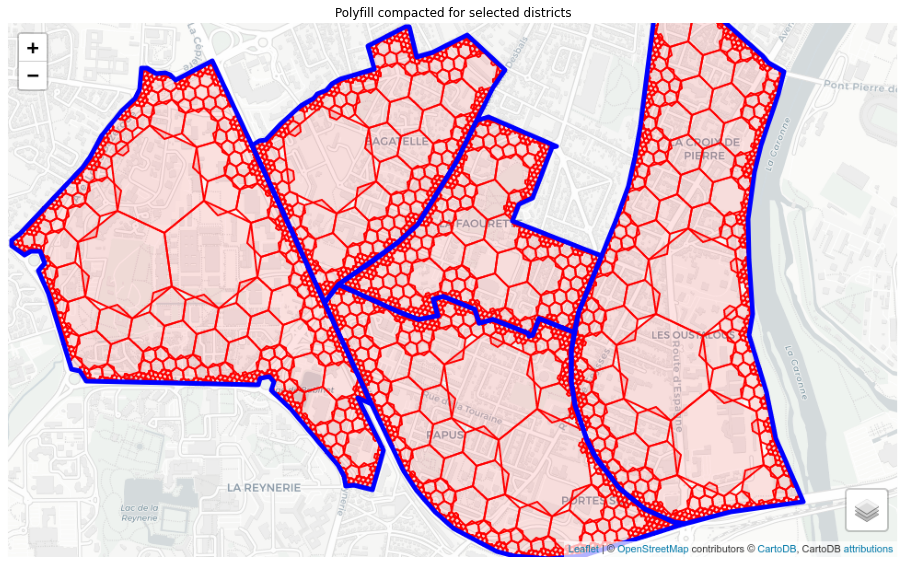

In [68]:
fig, ax = plt.subplots(1, 1, figsize=(16, 16))

im1 = pilim.open('images/districts_fill_compact.png', 'r')
ax.imshow(np.asarray(im1))
ax.set_title("Polyfill compacted for selected districts")
ax.set_axis_off();


In the detail zoom that follows, we can observe that some small areas remained uncovered after compacting the set of hexagons used for filling districts geometries.   
These small voids occur at the juxtaposition of hexagon cells of different H3 resolutions. 
As explained in section I.2 of the preliminaries, the parent's polygon does not overlap completely with the multipolygon of its children union.

A consequence of this, for our spatial join, is that any point that would fall exactly in such a void would  be wrongly labelled as outside the district.


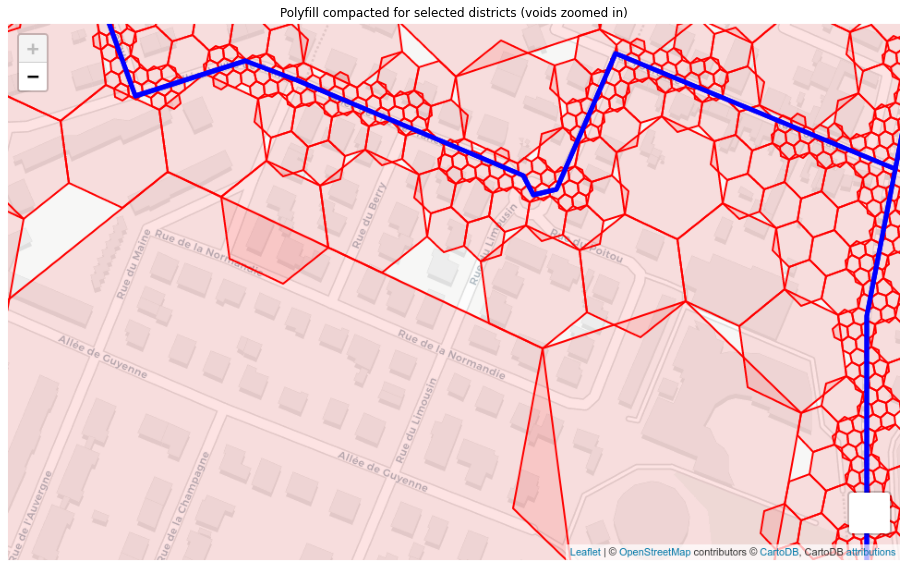

In [69]:
fig, ax = plt.subplots(1, 1, figsize=(16, 16))

im1 = pilim.open('images/compacted_voids.png', 'r')
ax.imshow(np.asarray(im1))
ax.set_title("Polyfill compacted for selected districts (voids zoomed in)")
ax.set_axis_off();

So far, how many hexagons belonged to more than one district (i.e were on the border between districts)?

In [70]:
def check_hexes_on_multiple_districts(gdf_districts, hexes_column):
    
    # map district name --> list of cells after compacting
    dict_district_hexes = dict(zip(gdf_districts["libelle_du_grand_quartier"], 
                                   gdf_districts[hexes_column]))

    # reverse dict to map cell id --> district name 
    # basically we're performing an inverting of a dictionary with list values

    dict_hex_districts = {}
    for k, v in dict_district_hexes.items():
        for x in v:
            dict_hex_districts.setdefault(x, []).append(k)

    list_keys = list(dict_hex_districts.keys())
    print("Total number of keys in dict reversed:", len(list_keys))
    print("Example:", list_keys[0], " ==> ", dict_hex_districts[list_keys[0]])

    print("---------------------------------------------------")
    # check if any hex maps to more than 1 district name
    dict_hex_of_multiple_districts = {}
    for k, v in dict_hex_districts.items():
        if len(v) > 1:
            dict_hex_of_multiple_districts[k] = v

    print("Hexes mapped to multiple districts:", 
          len(dict_hex_of_multiple_districts.keys()))
    c = Counter([h3.h3_get_resolution(k) for k in dict_hex_of_multiple_districts])
    pprint(c)
    
    return dict_hex_districts

In [71]:
_ = check_hexes_on_multiple_districts(gdf_districts, hexes_column = "hex_fill_compact")

Total number of keys in dict reversed: 94287
Example: 8c396018ec19dff  ==>  ['POUVOURVILLE']
---------------------------------------------------
Hexes mapped to multiple districts: 0
Counter()


**Fill the voids**

In [72]:
help(h3.h3_line)

Help on function h3_line in module h3.api._api_template:

h3_line(start, end)
    Returns the ordered collection of cells denoting a
    minimum-length non-unique path between cells.
    
    Parameters
    ----------
    start : H3Cell
    end : H3Cell
    
    Returns
    -------
    ordered collection of H3Cell
        Starting with `start`, and ending with `end`.



In [73]:
def get_hexes_traversed_by_borders(gdf_districts, res):
    """Identify the resolution 12 hexagons that are traversed by districts boundaries"""
    set_traversed_hexes = set()
    
    for i, row in gdf_districts.iterrows():
        coords = row["geometry"].boundary.coords
        for j in range(len(coords)-1):
            # for each "leg" (segment) of the linestring
            start_leg = coords[j]
            stop_leg = coords[j]
            # note: they are (lon,lat)
            start_hexid = h3.geo_to_h3(lat = start_leg[1],
                                       lng = start_leg[0],
                                       resolution = res)
            stop_hexid = h3.geo_to_h3(lat = stop_leg[1],
                                      lng = stop_leg[0],
                                      resolution = res)
            traversed_hexes = h3.h3_line(start = start_hexid,
                                         end = stop_hexid) 
            set_traversed_hexes |= set(traversed_hexes)
            
    return list(set_traversed_hexes)   
    

In [74]:
boundary_hexes_res11 = get_hexes_traversed_by_borders(gdf_districts, res = 11)
boundary_hexes_res12 = get_hexes_traversed_by_borders(gdf_districts, res = 12)
boundary_hexes_res13 = get_hexes_traversed_by_borders(gdf_districts, res = 13)

print("{} hexes on boundary at res {}".format(len(boundary_hexes_res11), 11))
print("{} hexes on boundary at res {}".format(len(boundary_hexes_res12), 12))
print("{} hexes on boundary at res {}".format(len(boundary_hexes_res13), 13))

2379 hexes on boundary at res 11
2775 hexes on boundary at res 12
2858 hexes on boundary at res 13


In [75]:
def fill_voids(row, fill_voids_res = 12):
    """For each cell resulted from compacting, get its central child at resolution
    fill_voids_res; compute specific hollow rings of this central child, overall achieving
    an envelope(buffer) of each of the coarser hexagons with more fine-grained hexagons"""
    
    hexes_compacted = row["hex_fill_compact"]
    
    set_fillvoids = set()
    for i in range(len(hexes_compacted)):
        hex_id = hexes_compacted[i]
        res_hex = h3.h3_get_resolution(hex_id)
        if res_hex < fill_voids_res:
            center_hex = h3.h3_to_center_child(h = hex_id, 
                                               res = fill_voids_res)
            if res_hex - fill_voids_res == -4:
                # e.g. res_hex = 8, fill_voids_res = 12
                # ==> include 3xgrandchildren on rings [30, .., 32, 33]
                for j in range(30, 34):
                    hollow_ring = h3.hex_ring(h = center_hex, k = j)
                    set_fillvoids |= hollow_ring                    
            elif res_hex - fill_voids_res == -3:
                # e.g. res_hex = 9, fill_voids_res = 12
                # ==> include 2xgrandchildren on rings [10,11,12]
                for j in range(10, 13):
                    hollow_ring = h3.hex_ring(h = center_hex, k = j)
                    set_fillvoids |= hollow_ring  
            elif res_hex - fill_voids_res == -2:
                # e.g. res_hex = 10, fill_voids_res = 12
                # ==> include grandchildren on rings 4 and 5
                for j in [4, 5]:
                    hollow_ring = h3.hex_ring(h = center_hex, k = j)
                    set_fillvoids |= hollow_ring 
            elif res_hex - fill_voids_res == -1:
                # e.g. res_hex = 11, fill_voids_res = 12
                # ==> include children on ring 1
                for j in [1]:
                    hollow_ring = h3.hex_ring(h = center_hex, k = j)
                    set_fillvoids |= hollow_ring 

    # exclude any hexagon that would be on border
    set_interior = (set_fillvoids - set(boundary_hexes_res13)) - set(boundary_hexes_res12)
    list_interior = list(set_interior)
    return list_interior

In [76]:
%%time
gdf_districts["compacted_novoids"] = gdf_districts.apply(lambda r: fill_voids(r), axis = 1)

CPU times: user 672 ms, sys: 8 ms, total: 680 ms
Wall time: 681 ms


In [77]:
_ = check_hexes_on_multiple_districts(
                          gdf_districts, 
                          hexes_column = "compacted_novoids")

Total number of keys in dict reversed: 193763
Example: 8c396019d16c1ff  ==>  ['POUVOURVILLE']
---------------------------------------------------
Hexes mapped to multiple districts: 19
Counter({12: 19})


In [ ]:
list_districts_names = ["MIRAIL-UNIVERSITE", "BAGATELLE", "PAPUS",
                        "FAOURETTE", "CROIX-DE-PIERRE"]
visualize_district_filled_compact(gdf_districts = gdf_districts,
                                  list_districts_names = list_districts_names)

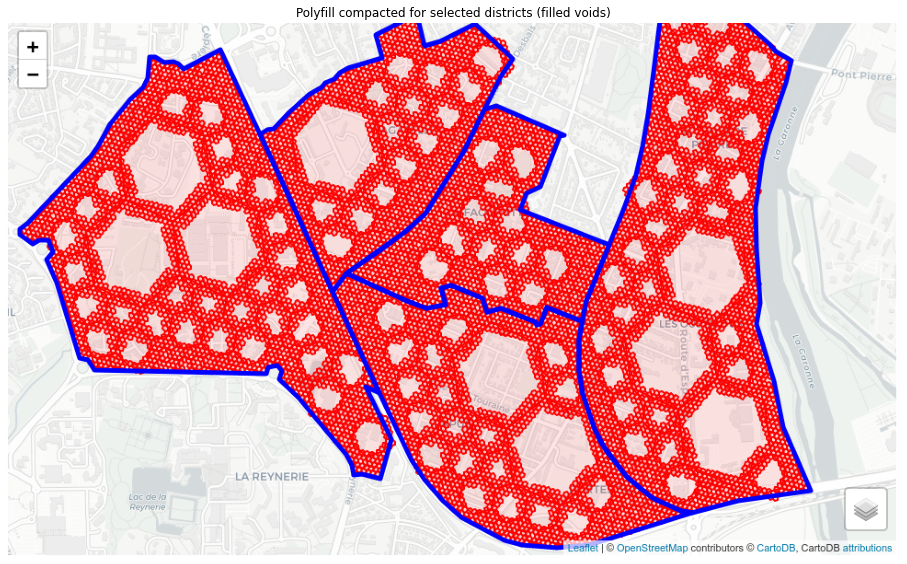

In [79]:
fig, ax = plt.subplots(1, 1, figsize=(16, 16))

im1 = pilim.open('images/districts_fill_compact_novoids.png', 'r')
ax.imshow(np.asarray(im1))
ax.set_title("Polyfill compacted for selected districts (filled voids)")
ax.set_axis_off();

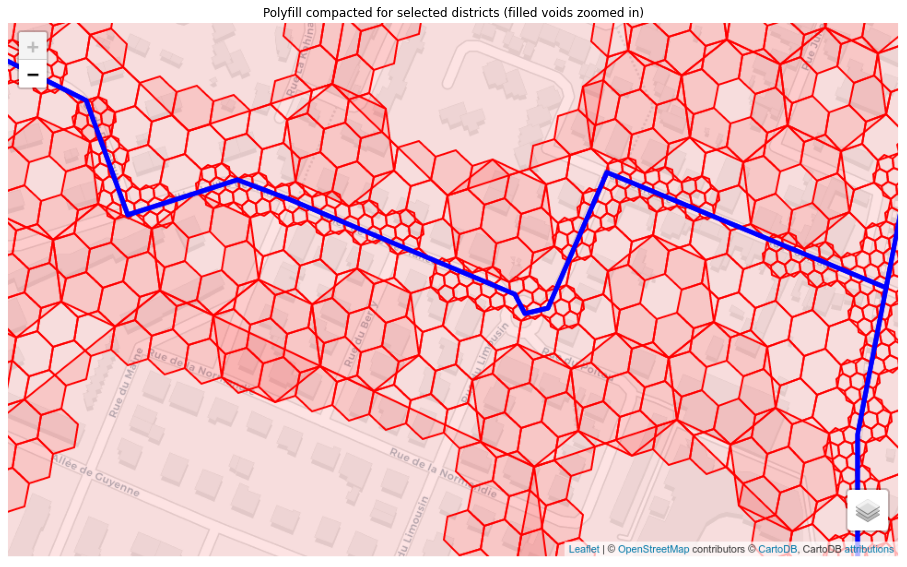

In [80]:
fig, ax = plt.subplots(1, 1, figsize=(16, 16))

im1 = pilim.open('images/filled_voids.png', 'r')
ax.imshow(np.asarray(im1))
ax.set_title("Polyfill compacted for selected districts (filled voids zoomed in)")
ax.set_axis_off()

In [81]:
# sidenote - how it works itertools.chain.from_iterable
l1 = ["a", "b"]
l2 = ["a", "c"]
list(itertools.chain.from_iterable([l1, l2]))

['a', 'b', 'a', 'c']

In [82]:
gdf_districts["union_compacted_novoids"] = \
             gdf_districts[["compacted_novoids", "hex_fill_compact"]].apply(
             lambda x: list(itertools.chain.from_iterable([x[0], x[1]])), axis = 1)
gdf_districts["union_compacted_novoids"] = gdf_districts["union_compacted_novoids"].apply(
             lambda x: list(set(x)))
gdf_districts["num_final"] = gdf_districts["union_compacted_novoids"].apply(
             lambda x: len(x))

gdf_districts["num_final"].sum()

282148

Note: these 282148 multi-resolution H3 cells seem as a good trade-off compared with the former 2 extremes: the initial dense filling at resolution 13 with 2851449 hexagons versus the 94287 hexagons after compacting which left uncovered areas(voids) 

In [83]:
dict_hex_districts = check_hexes_on_multiple_districts(
                          gdf_districts, 
                          hexes_column = "union_compacted_novoids")

Total number of keys in dict reversed: 281794
Example: 8c396019d16c1ff  ==>  ['POUVOURVILLE']
---------------------------------------------------
Hexes mapped to multiple districts: 354
Counter({12: 354})


Now, for a given point, index it at all resolutions between 6 and 12 and search starting from coarser resolution towards finer resolutions:

In [84]:
def spatial_join_districts(row, dict_hex_districts, minres_compact, maxres_compact):
    for res in range(minres_compact, maxres_compact + 1):
        hexid = h3.geo_to_h3(lat = row["latitude"], 
                             lng = row["longitude"], 
                             resolution = res)
        if hexid in dict_hex_districts:
            if len(dict_hex_districts[hexid]) > 1:
                return ",".join(dict_hex_districts[hexid])
            else:
                return dict_hex_districts[hexid][0]
    return "N/A"

In [85]:
list_res_after_compact_novoids = [h3.h3_get_resolution(x) for x in dict_hex_districts]
finest_res = max(list_res_after_compact_novoids)
coarsest_res = min(list_res_after_compact_novoids)
print("Resolution between {} and {}".format(coarsest_res, finest_res))

Resolution between 8 and 13


In [86]:
%%time

df_sjoin_h3 = df_stops_to_buslines.copy()

df_sjoin_h3["district"] = df_sjoin_h3.apply(spatial_join_districts, 
                                            args=(dict_hex_districts,
                                                  coarsest_res,
                                                  finest_res), 
                                            axis = 1)

CPU times: user 244 ms, sys: 0 ns, total: 244 ms
Wall time: 241 ms


In [87]:
counts_by_district = pd.DataFrame(df_sjoin_h3["district"].value_counts())
counts_by_district.columns = ["num_busstops"]
counts_by_district.head()

,num_busstops
N/A,1385
CROIX-DAURADE,52
MONTAUDRAN - LESPINET,47
RANGUEIL - CHR - FACULTES,33
ZONES D'ACTIVITES SUD,24


Note: the N/A category includes all busstops that are outside the districts (but in the wider metropolitan area of Toulouse)

In [88]:
# the number of bus stops that were found inside the districts
counts_by_district[counts_by_district.index != "N/A"]["num_busstops"].sum()

661

In [89]:
# bus stops situated on the border of 2 districts
counts_by_district[counts_by_district.index.str.contains(",")]

,num_busstops
"COTE PAVEE,GUILHEMERY",1
"LE BUSCA,PONT-DES-DEMOISELLES",1
"AMIDONNIERS,CASSELARDIT",1
"GUILHEMERY,MARENGO - JOLIMONT",1
"BASSO-CAMBO,LES PRADETTES",1
"LES CHALETS,ARNAUD BERNARD",1


In [ ]:
special_map = visualize_district_filled_compact(
                     gdf_districts = gdf_districts,
                     list_districts_names =["AMIDONNIERS", "CASSELARDIT"],
                     fillcolor="pink")

df_on_border = df_sjoin_h3[df_sjoin_h3["district"] == "AMIDONNIERS,CASSELARDIT"]

for i, row in df_on_border.iterrows():
    mk = Marker(location=[row["latitude"], row["longitude"]],
                icon = folium.Icon(icon='circle', color='darkgreen'),
                popup=str(row["info"]))
    mk.add_to(special_map)
    
special_map

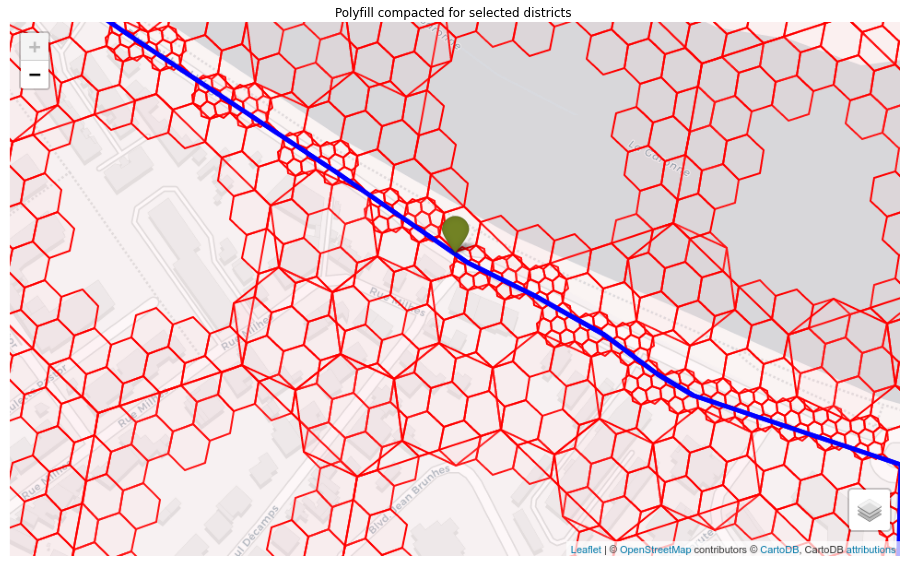

In [91]:
fig, ax = plt.subplots(1, 1, figsize=(16, 16))

im1 = pilim.open('images/onborder_districts.png', 'r')
ax.imshow(np.asarray(im1))
ax.set_title("Polyfill compacted for selected districts")
ax.set_axis_off()

**After having computed the spatial join, we can use the results for identifying which are the districts served by each bus line**

In [92]:
selected_busline = "14"
print(gdf_raw[gdf_raw["ligne"] == selected_busline]["pty"].unique())
print(gdf_raw[gdf_raw["ligne"] == selected_busline].groupby(by="pty")["sens"].apply(set))

df_route_busline = pd.merge(left = gdf_raw[gdf_raw["pty"].isin(['14/106', '14/13'])], 
                            right = df_sjoin_h3,
                            left_on = ["latitude", "longitude"],
                            right_on = ["latitude", "longitude"],
                            how = "left")

df_route_busline.sort_values(by = ["pty", "sens", "ordre"], inplace = True)
df_route_busline[["pty", "sens", "ordre", "info", "district"]]

['14/106' '14/67' '14/13']
pty
14/106    {1.0}
14/13     {0.0}
14/67     {1.0}
Name: sens, dtype: object


,pty,sens,ordre,info,district
27,14/106,1.00000,1.00000,"Marengo-SNCF (14,L8,CIMTR)",MARENGO - JOLIMONT
59,14/106,1.00000,2.00000,"Riquet (14,L8,23,27)",SAINT-AUBIN - DUPUY
24,14/106,1.00000,3.00000,"Bachelier (14,L8,23)",MATABIAU
51,14/106,1.00000,4.00000,"Jean Jaurès (23,VILLE,L9,L8,29,L1,14,CIMTR)",SAINT-AUBIN - DUPUY
61,14/106,1.00000,5.00000,"St-Georges (L9,L8,29,14,L1)",SAINT-AUBIN - DUPUY
...,...,...,...,...,...
47,14/13,0.00000,30.00000,"St-Georges (L9,L8,29,14,L1)",SAINT-AUBIN - DUPUY
22,14/13,0.00000,31.00000,"Jean Jaurès (23,VILLE,L9,L8,29,L1,14,CIMTR)",SAINT-AUBIN - DUPUY
23,14/13,0.00000,32.00000,"Bachelier (14,L8,23)",MATABIAU
34,14/13,0.00000,33.00000,"Riquet (14,L8,23,27)",SAINT-AUBIN - DUPUY


In [93]:
direction_0 = df_route_busline[df_route_busline["sens"] == 0]["district"]
list(unique_everseen(direction_0))

['REYNERIE',
 'BELLEFONTAINE',
 'MIRAIL-UNIVERSITE',
 'LA CEPIERE',
 'ARENES',
 "PATTE D'OIE",
 'SAINT-CYPRIEN',
 'CARMES',
 'SAINT-GEORGES',
 'SAINT-AUBIN - DUPUY',
 'MATABIAU',
 'MARENGO - JOLIMONT']

In [94]:
list_aux = list(unique_everseen(df_route_busline["district"].values))
list_distr = []
for s in list_aux:
    if "," in s:
        # if on border, add both districts 
        list_distr.extend(s.split(","))
    else:
        list_distr.append(s)
        
gdf_bus_traversed_districts = gdf_districts[
                          gdf_districts["libelle_du_grand_quartier"].isin(list_distr)]
gdf_bus_traversed_districts = gdf_bus_traversed_districts[
                                            ["geometry", "libelle_du_grand_quartier"]]
gdf_bus_traversed_districts.to_file("datasets_demo/bus_14_districts.geojson",
                                    driver = "GeoJSON")

In [95]:
!ls -alh datasets_demo/bus_14_districts.geojson

-rw-rw-r-- 1 camelia camelia 29K aug  9 07:34 datasets_demo/bus_14_districts.geojson


Recall that we have comma in district when the point was found on the border between 2 districts.

Prepare files for the section V.1

In [96]:
list_projected_columns = ["latitude", "longitude", "sens", "ordre", "info", "district"]
df_route_busline_cpy = df_route_busline[list_projected_columns]
df_route_busline_cpy.sort_values(by = ["sens", "ordre"], inplace = True)

# shift
df_route_busline_cpy['next_longitude'] = df_route_busline_cpy["longitude"].shift(-1)
df_route_busline_cpy['next_latitude'] = df_route_busline_cpy["latitude"].shift(-1)
df_route_busline_cpy['next_sens'] = df_route_busline_cpy["sens"].shift(-1)
df_route_busline_cpy['next_ordre'] = df_route_busline_cpy["ordre"].shift(-1)

# the last row will have next_{} all none, we manually match it to the start of the route
df_route_busline_cpy["next_latitude"].fillna(df_route_busline_cpy.iloc[0]["latitude"],
                                             inplace=True)
df_route_busline_cpy["next_longitude"].fillna(df_route_busline_cpy.iloc[0]["longitude"],
                                              inplace=True)
df_route_busline_cpy["next_sens"].fillna(0, inplace=True)
df_route_busline_cpy["next_ordre"].fillna(1, inplace=True)

df_route_busline_cpy

,latitude,longitude,sens,ordre,info,district,next_longitude,next_latitude,next_sens,next_ordre
53,43.57021,1.39233,0.00000,1.00000,"Basso Cambo (49,58,57,L4,18,50,14,21,47)",REYNERIE,1.39369,43.56689,0.00000,2.00000
33,43.56689,1.39369,0.00000,2.00000,"Place Bouillière (58,49,53,L4,14,87,50)",REYNERIE,1.39924,43.56570,0.00000,3.00000
45,43.56570,1.39924,0.00000,3.00000,Bellefontaine (14),BELLEFONTAINE,1.40382,43.56750,0.00000,4.00000
12,43.56750,1.40382,0.00000,4.00000,Le Lac Reynerie (14),REYNERIE,1.40784,43.56843,0.00000,5.00000
39,43.56843,1.40784,0.00000,5.00000,Cité du Parc (14),REYNERIE,1.40859,43.57048,0.00000,6.00000
...,...,...,...,...,...,...,...,...,...,...
4,43.56843,1.40784,1.00000,29.00000,Cité du Parc (14),REYNERIE,1.40382,43.56750,1.00000,30.00000
13,43.56750,1.40382,1.00000,30.00000,Le Lac Reynerie (14),REYNERIE,1.39924,43.56570,1.00000,31.00000
46,43.56570,1.39924,1.00000,31.00000,Bellefontaine (14),BELLEFONTAINE,1.39369,43.56689,1.00000,32.00000
55,43.56689,1.39369,1.00000,32.00000,"Place Bouillière (58,49,53,L4,14,87,50)",REYNERIE,1.39233,43.57021,1.00000,33.00000


In [97]:
json_rep = df_route_busline_cpy.to_dict(orient='record')

with open("datasets_demo/bus_14_route.json", mode="w") as f:
    json.dump(json_rep, f)

In [98]:
%%sh
ls -alh datasets_demo/bus_14_route.json

-rw-rw-r-- 1 camelia camelia 18K aug  9 07:34 datasets_demo/bus_14_route.json


**See the corresponding 3d visualization with Deck.gl in section V.1 at the end of this notebook.**

------------------

-------------------

# III. Use H3 spatial index for aggregated analytics

## III.1. Count busstops groupped by H3 cell

In [99]:
def counts_by_hexagon(df, res):
    """Aggregates the number of busstops at hexagon level"""

    col_hex_id = "hex_id_{}".format(res)
    col_geometry = "geometry_{}".format(res)

    # within each group preserve the first geometry and count the ids
    df_aggreg = df.groupby(by = col_hex_id).agg({col_geometry: "first",
                                                "latitude": "count"})

    df_aggreg.reset_index(inplace = True)
    df_aggreg.rename(columns={"latitude": "value"}, inplace = True)

    df_aggreg.sort_values(by = "value", ascending = False, inplace = True)
    return df_aggreg

In [100]:
# demo at resolution 8
df_aggreg_8 = counts_by_hexagon(df = df_stops_to_buslines, res = 8)
print(df_aggreg_8.shape)
df_aggreg_8.head(5)

(722, 3)


,hex_id_8,geometry_8,value
297,8839601893fffff,"{'type': 'Polygon', 'coordinates': [((1.5299253493073752, 4...",10
258,883960181bfffff,"{'type': 'Polygon', 'coordinates': [((1.4527478813977899, 4...",10
327,88396018e3fffff,"{'type': 'Polygon', 'coordinates': [((1.4737994684890512, 4...",10
468,8839601ac5fffff,"{'type': 'Polygon', 'coordinates': [((1.442211698802212, 43...",9
447,8839601a93fffff,"{'type': 'Polygon', 'coordinates': [((1.5054229236100751, 4...",9


## III.2. Visualization with choropleth map

In [101]:
def hexagons_dataframe_to_geojson(df_hex, hex_id_field,
                                  geometry_field, value_field,
                                  file_output = None):

    """Produce the GeoJSON representation containing all geometries in a dataframe
     based on a column in geojson format (geometry_field)"""

    list_features = []

    for i, row in df_hex.iterrows():
        feature = Feature(geometry = row[geometry_field],
                          id = row[hex_id_field],
                          properties = {"value": row[value_field]})
        list_features.append(feature)

    feat_collection = FeatureCollection(list_features)

    geojson_result = json.dumps(feat_collection)

    # optionally write to file
    if file_output is not None:
        with open(file_output, "w") as f:
            json.dump(feat_collection, f)

    return geojson_result


# --------------------------------------------------------------------


def choropleth_map(df_aggreg, hex_id_field, geometry_field, value_field,
                   layer_name, initial_map = None, kind = "linear",
                   border_color = 'black', fill_opacity = 0.7,
                   with_legend = False):

    """Plots a choropleth map with folium"""

    if initial_map is None:
        initial_map = base_empty_map()

    # the custom colormap depends on the map kind
    if kind == "linear":
        min_value = df_aggreg[value_field].min()
        max_value = df_aggreg[value_field].max()
        m = round((min_value + max_value) / 2, 0)
        custom_cm = cm.LinearColormap(['green', 'yellow', 'red'],
                                      vmin = min_value,
                                      vmax = max_value)
    elif kind == "outlier":
        # for outliers, values would be -1,0,1
        custom_cm = cm.LinearColormap(['blue', 'white', 'red'],
                                      vmin=-1, vmax=1)
    elif kind == "filled_nulls":
        min_value = df_aggreg[df_aggreg[value_field] > 0][value_field].min()
        max_value = df_aggreg[df_aggreg[value_field] > 0][value_field].max()
        m = round((min_value + max_value) / 2, 0)
        custom_cm = cm.LinearColormap(['silver', 'green', 'yellow', 'red'],
                                      index = [0, min_value, m, max_value],
                                      vmin = min_value,
                                      vmax = max_value)

    # create geojson data from dataframe
    geojson_data = hexagons_dataframe_to_geojson(df_aggreg, hex_id_field,
                                                 geometry_field, value_field)

    # plot on map
    GeoJson(
        geojson_data,
        style_function=lambda feature: {
            'fillColor': custom_cm(feature['properties']['value']),
            'color': border_color,
            'weight': 1,
            'fillOpacity': fill_opacity
        },
        name = layer_name
    ).add_to(initial_map)

    # add legend (not recommended if multiple layers)
    if with_legend is True:
        custom_cm.add_to(initial_map)

    return initial_map

In [ ]:
m_hex = choropleth_map(df_aggreg = df_aggreg_8,
                       hex_id_field = "hex_id_8",
                       geometry_field = "geometry_8",
                       value_field = "value",
                       layer_name = "Choropleth 8",
                       with_legend = True)
m_hex

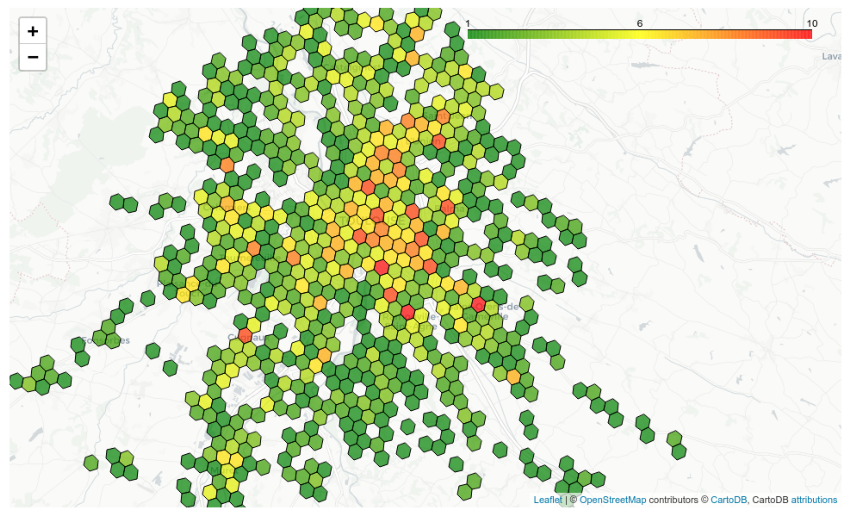

In [103]:
fig, ax = plt.subplots(1, 1, figsize = (15, 10))

im1 = pilim.open('images/4_choroplth_multiresol_8_region.png', 'r')
ax.imshow(np.asarray(im1))
ax.set_axis_off();

Better yet, plot it 3d with pydeck:

In [104]:
norm = mpl.colors.Normalize(vmin = df_aggreg_8["value"].min(), 
                            vmax = df_aggreg_8["value"].max())
f2rgb = mpl.cm.ScalarMappable(norm = norm, cmap = mpl.cm.get_cmap('RdYlGn_r'))


def get_color(value):
    return [int(255 * x) for x in f2rgb.to_rgba(value)[:-1]]


get_color(value = 10)

[165, 0, 38]

In [ ]:
df_aux = df_aggreg_8.copy()
df_aux["coloring"] = df_aux["value"].apply(lambda x: get_color(value = x))

aggreg_layer = pydeck.Layer(
                    "H3HexagonLayer",
                    data = df_aux,
                    pickable=True,
                    stroked=True,
                    filled=True,
                    extruded=True,
                    get_hexagon="hex_id_8",
                    get_fill_color= "coloring",
                    get_line_color=[255, 255, 255],
                    line_width_min_pixels=1,
                    get_elevation="value",
                    elevation_scale=500,
                    opacity=0.9
                )

view = pydeck.data_utils.compute_view(gdf_dedup[["longitude", "latitude"]])
view.zoom = 6


r = pydeck.Deck(
    layers=[aggreg_layer],
    initial_view_state = view,
    mapbox_key = MAPBOX_TOKEN,
    map_style='mapbox://styles/mapbox/light-v9',
    tooltip={"text": "Count: {value}"}
)

r.show()

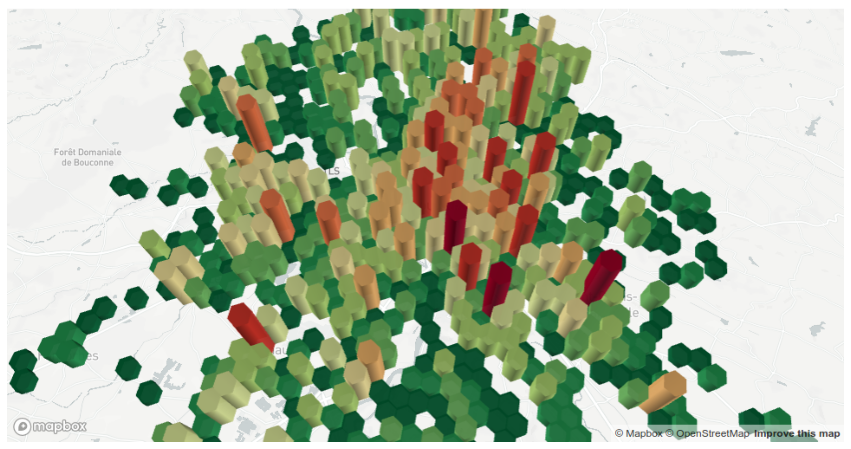

In [106]:
fig, ax = plt.subplots(1, 1, figsize = (15, 10))

im1 = pilim.open('images/3d_aggreg_res8.png', 'r')
ax.imshow(np.asarray(im1));
ax.set_axis_off()

**Aggregate at  coarser and at finer resolutions:**


In [107]:
# coarser resolutions than 8
df_aggreg_7 = counts_by_hexagon(df = df_stops_to_buslines, res = 7)

# finer resolutions than 8
df_aggreg_9 = counts_by_hexagon(df = df_stops_to_buslines, res = 9)
df_aggreg_10 = counts_by_hexagon(df = df_stops_to_buslines, res = 10)

In [108]:
# make a dictionary of mappings resolution -> dataframes, for future use
dict_aggreg_hex = {7: df_aggreg_7,
                   8: df_aggreg_8,
                   9: df_aggreg_9,
                   10: df_aggreg_10}

msg_ = "At resolution {} we used {} H3 cells for indexing the bus stops"
for res in dict_aggreg_hex:
    print(msg_.format(res, dict_aggreg_hex[res].shape[0]))


At resolution 7 we used 181 H3 cells for indexing the bus stops
At resolution 8 we used 722 H3 cells for indexing the bus stops
At resolution 9 we used 1709 H3 cells for indexing the bus stops
At resolution 10 we used 2023 H3 cells for indexing the bus stops


In [ ]:
initial_map = base_empty_map()

for res in dict_aggreg_hex:
    initial_map = choropleth_map(df_aggreg = dict_aggreg_hex[res],
                                 hex_id_field = "hex_id_{}".format(res),
                                 geometry_field = "geometry_{}".format(res),
                                 value_field = "value",
                                 initial_map = initial_map,
                                 layer_name = "Choropleth {}".format(res),
                                 with_legend = False)

folium.map.LayerControl('bottomright', collapsed=True).add_to(initial_map)

initial_map

First we focus (zoom in) on the city center and display H3 cells covering the same zone at various resolutions:


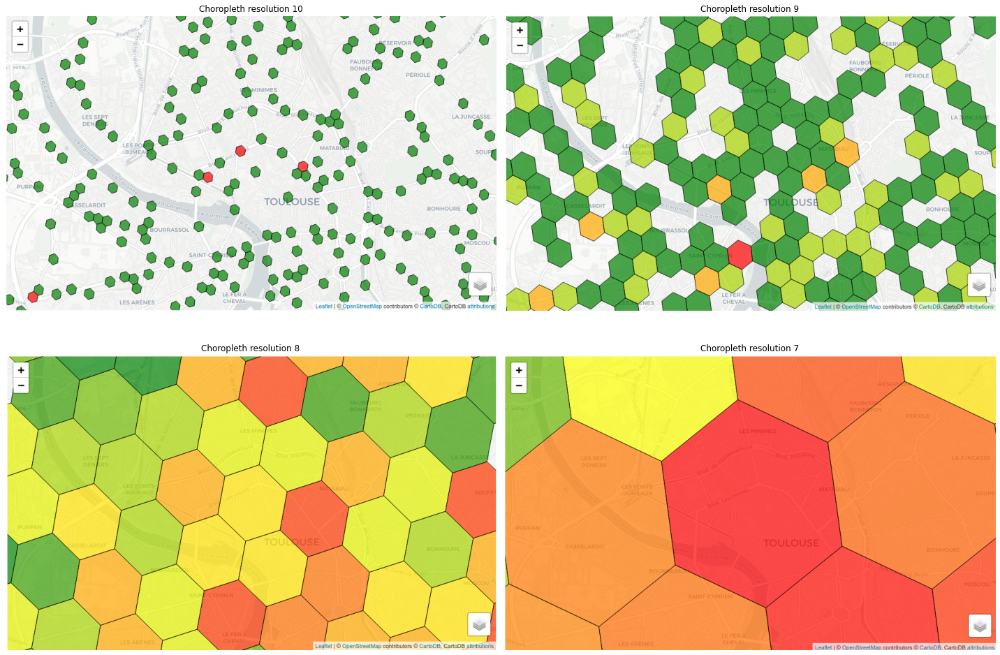

In [110]:
fig, ax = plt.subplots(2, 2, figsize=(20, 14))

im1 = pilim.open('images/4_choropleth_multiresol_10.png', 'r')
ax[0][0].imshow(np.asarray(im1))
ax[0][0].set_title("Choropleth resolution 10")
im1 = pilim.open('images/4_choropleth_multiresol_9.png', 'r')
ax[0][1].imshow(np.asarray(im1))
ax[0][1].set_title("Choropleth resolution 9")
im1 = pilim.open('images/4_choropleth_multiresol_8.png', 'r')
ax[1][0].imshow(np.asarray(im1))
ax[1][0].set_title("Choropleth resolution 8")
im1 = pilim.open('images/4_choropleth_multiresol_7.png', 'r')
ax[1][1].imshow(np.asarray(im1))
ax[1][1].set_title("Choropleth resolution 7")

for i in [0, 1]:
    for j in [0, 1]:
        ax[i][j].set_axis_off()
fig.tight_layout()

Depending on the resolution at which we computed the aggregates, we sometimes got a sparse spatial distribution of H3 cells with busstops.  
Next we want to include all the H3 cells that cover the city's area and thus put these aggregates in a better perspective.

## III.3. Study aggregates in the context of the city's hexagons coverage set

In [111]:
input_file_subzones = "datasets_demo/subzones_Toulouse.geojson"
gdf_subzones = load_and_prepare_districts(filepath = input_file_subzones) 
 
print(gdf_subzones.shape)
print("\n--------------------------------------------------------\n")
list_subzones = list(gdf_subzones["libcom"].unique())
list_subzones.sort()
print(columnize(list_subzones, displaywidth=100))
print("\n--------------------------------------------------------\n")

gdf_subzones[["libcom", "geometry", 
              "geom_swap", "geom_swap_geojson"]].head()

(37, 9)

--------------------------------------------------------

AIGREFEUILLE  BRUGUIERES     FONBEAUZARD         MONS               SAINT ORENS DE GAMEVILLE
AUCAMVILLE    CASTELGINEST   GAGNAC SUR GARONNE  MONTRABE           SEILH                   
AUSSONNE      COLOMIERS      GRATENTOUR          PIBRAC             TOULOUSE                
BALMA         CORNEBARRIEU   L UNION             PIN BALMA          TOURNEFEUILLE           
BEAUPUY       CUGNAUX        LAUNAGUET           QUINT FONSEGRIVES  VILLENEUVE TOLOSANE     
BEAUZELLE     DREMIL LAFAGE  LESPINASSE          SAINT ALBAN      
BLAGNAC       FENOUILLET     MONDONVILLE         SAINT JEAN       
BRAX          FLOURENS       MONDOUZIL           SAINT JORY       


--------------------------------------------------------



,libcom,geometry,geom_swap,geom_swap_geojson
0,TOULOUSE,"POLYGON ((1.36648 43.62503, 1.36725 43.62552, 1.36784 43.62...","POLYGON ((43.62503 1.36648, 43.62552 1.36725, 43.62619 1.36...","{'type': 'Polygon', 'coordinates': (((43.62502895130769, 1...."
1,GAGNAC SUR GARONNE,"POLYGON ((1.34424 43.72209, 1.34424 43.72209, 1.34424 43.72...","POLYGON ((43.72209 1.34424, 43.72209 1.34424, 43.72209 1.34...","{'type': 'Polygon', 'coordinates': (((43.72209365274882, 1...."
2,FONBEAUZARD,"POLYGON ((1.42285 43.67870, 1.42291 43.67870, 1.42301 43.67...","POLYGON ((43.67870 1.42285, 43.67870 1.42291, 43.67875 1.42...","{'type': 'Polygon', 'coordinates': (((43.6786979962066, 1.4..."
3,LESPINASSE,"POLYGON ((1.38946 43.72494, 1.39079 43.72314, 1.39103 43.72...","POLYGON ((43.72494 1.38946, 43.72314 1.39079, 43.72270 1.39...","{'type': 'Polygon', 'coordinates': (((43.7249372676293, 1.3..."
4,BEAUZELLE,"POLYGON ((1.35080 43.67911, 1.35129 43.67880, 1.35251 43.67...","POLYGON ((43.67911 1.35080, 43.67880 1.35129, 43.67823 1.35...","{'type': 'Polygon', 'coordinates': (((43.679113059442535, 1..."


There are 37 subzones that form Toulouse metropolitan territory, here we'll focus on the central subzone: 

In [112]:
# we select the main subzone of the city
selected_subzone = "TOULOUSE"
gdf_subzone_sel = gdf_subzones[gdf_subzones["libcom"] == "TOULOUSE"]
gdf_subzone_sel


,cugt,libcom,libelle,code_insee,code_fantoir,geometry,geom_geojson,geom_swap,geom_swap_geojson
0,T,TOULOUSE,Toulouse,31555,310555,"POLYGON ((1.36648 43.62503, 1.36725 43.62552, 1.36784 43.62...","{'type': 'Polygon', 'coordinates': (((1.366481542003093, 43...","POLYGON ((43.62503 1.36648, 43.62552 1.36725, 43.62619 1.36...","{'type': 'Polygon', 'coordinates': (((43.62502895130769, 1...."


Fill the subzone's geometry with H3 cells (as we've done before with districts, but without compacting this time)

In [113]:
geom_to_fill = gdf_subzone_sel.iloc[0]["geom_swap_geojson"]

dict_fillings = {}
msg_ = "the subzone was filled with {} hexagons at resolution {}"

for res in [8, 9, 10]:
    # lat/lon in geometry_swap_geojson -> flag_reverse_geojson = False
    df_fill_hex = fill_hexagons(geom_geojson = geom_to_fill,
                                res = res,
                                flag_return_df = True)
    print(msg_.format(df_fill_hex.shape[0], res))

    # add entry in dict_fillings
    dict_fillings[res] = df_fill_hex

# --------------------------
dict_fillings[8].head()

the subzone was filled with 172 hexagons at resolution 8
the subzone was filled with 1194 hexagons at resolution 9
the subzone was filled with 8323 hexagons at resolution 10


,hex_id,value,geometry
0,8839601acbfffff,0,"{'type': 'Polygon', 'coordinates': [((1.456265967818373, 43..."
1,88396018e9fffff,0,"{'type': 'Polygon', 'coordinates': [((1.4597660508709986, 4..."
2,883960185dfffff,0,"{'type': 'Polygon', 'coordinates': [((1.4176288721212273, 4..."
3,8839601a35fffff,0,"{'type': 'Polygon', 'coordinates': [((1.4035708293751048, 4..."
4,8839601a15fffff,0,"{'type': 'Polygon', 'coordinates': [((1.4141012828920243, 4..."


**Merge (by left outer join) two H3 spatially indexed datasets at the same H3 index resolution**

In [114]:
dict_filled_aggreg = {}

for res in dict_fillings:
    col_hex_id = "hex_id_{}".format(res)
    df_outer = pd.merge(left = dict_fillings[res][["hex_id", "geometry"]],
                        right = dict_aggreg_hex[res][[col_hex_id, "value"]],
                        left_on = "hex_id",
                        right_on = col_hex_id,
                        how = "left")
    df_outer.drop(columns = [col_hex_id], inplace = True)
    df_outer["value"].fillna(value = 0, inplace = True)

    # add entry to dict
    dict_filled_aggreg[res] = df_outer

# -----------------------------
dict_filled_aggreg[8].sort_values(by="value", ascending=False).head()

,hex_id,geometry,value
12,883960181bfffff,"{'type': 'Polygon', 'coordinates': [((1.4527478813977899, 4...",10.00000
101,8839601ac5fffff,"{'type': 'Polygon', 'coordinates': [((1.442211698802212, 43...",9.00000
107,88396018ddfffff,"{'type': 'Polygon', 'coordinates': [((1.491357587988625, 43...",9.00000
65,8839601ab1fffff,"{'type': 'Polygon', 'coordinates': [((1.4843474923966924, 4...",9.00000
92,883960185bfffff,"{'type': 'Polygon', 'coordinates': [((1.4351897352424738, 4...",9.00000


<b>Visualize on map</b>

In [ ]:
res_to_plot = 9
m_filled_aggreg = choropleth_map(df_aggreg = dict_filled_aggreg[res_to_plot],
                                 hex_id_field = "hex_id",
                                 value_field = "value",
                                 geometry_field = "geometry",
                                 initial_map=None,
                                 layer_name = "Polyfill aggreg",
                                 with_legend = True,
                                 kind = "filled_nulls")

m_filled_aggreg

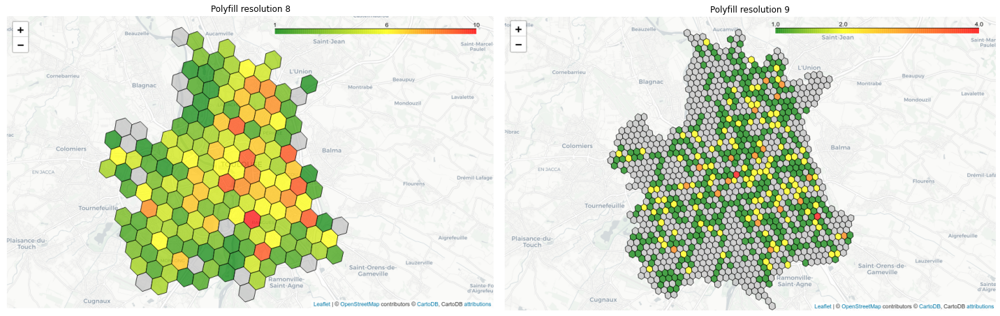

In [116]:
fig, ax = plt.subplots(1, 2, figsize=(20, 14))

im1 = pilim.open('images/filled_aggreg_merged_res8.png', 'r')
ax[0].imshow(np.asarray(im1))
ax[0].set_title("Polyfill resolution 8")
im1 = pilim.open('images/filled_aggreg_merged_res9.png', 'r')
ax[1].imshow(np.asarray(im1))
ax[1].set_title("Polyfill resolution 9")

ax[0].set_axis_off()
ax[1].set_axis_off()
fig.tight_layout()


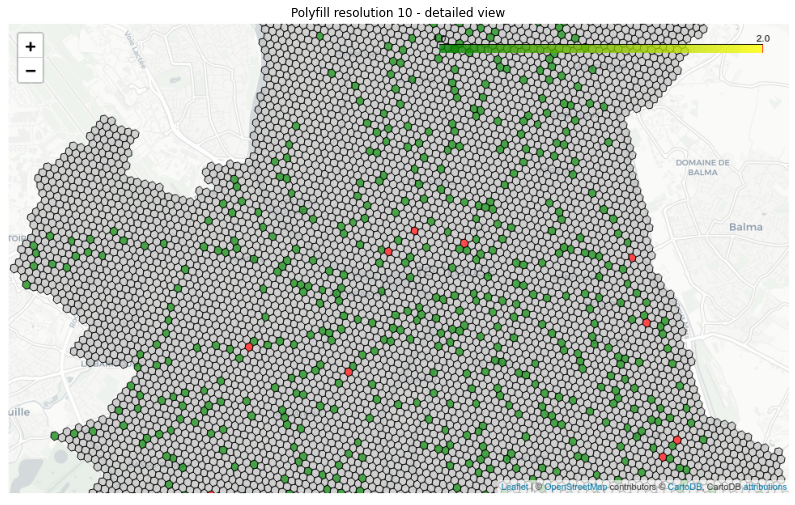

In [117]:
fig, ax = plt.subplots(1, 1, figsize=(14, 14))

im1 = pilim.open('images/filled_aggreg_merged_res10.png', 'r')
ax.imshow(np.asarray(im1))
ax.set_title("Polyfill resolution 10 - detailed view")
ax.set_axis_off()

In [118]:
# percentage of cells with value zero at varius index resolutions

msg_ = "Percentage of cells with value zero at resolution {}: {} %"
for res in dict_filled_aggreg:
    df_outer = dict_filled_aggreg[res]
    perc_hexes_zeros = 100 * df_outer[df_outer["value"] == 0].shape[0] / df_outer.shape[0]
    print(msg_.format(res, round(perc_hexes_zeros, 2)))


Percentage of cells with value zero at resolution 8: 9.3 %
Percentage of cells with value zero at resolution 9: 56.95 %
Percentage of cells with value zero at resolution 10: 92.15 %


**See the corresponding 3d visualization with Deck.gl in section V.2 at the end of this notebook.**

In [119]:
df_aux = dict_filled_aggreg[9].drop(columns = ["geometry"])
df_aux.to_json("datasets_demo/counts_res9.json", orient = "records", indent = 4)

In [120]:
!ls -alh datasets_demo/counts_res9.json

-rw-rw-r-- 1 camelia camelia 81K aug  9 07:36 datasets_demo/counts_res9.json


In [121]:
!head -n 20 datasets_demo/counts_res9.json

[
    {
        "hex_id":"893960112cfffff",
        "value":0.0
    },
    {
        "hex_id":"8939601843bffff",
        "value":1.0
    },
    {
        "hex_id":"8939601a80bffff",
        "value":0.0
    },
    {
        "hex_id":"89396019583ffff",
        "value":0.0
    },
    {
        "hex_id":"8939601805bffff",
        "value":1.0


---------------------------------

------------------------------

# IV. Global Spatial Autocorrelation

## IV.1 Background

Global spatial autocorrelation is a measure of the relationship between the values of a variable across space. When a spatial pattern exists, it may be of clustering (positive spatial autocorrelation, similar values are in proximity of each other) or of competition (negative spatial autocorrelation, dissimilarity among neighbors, high values repel other high values).

**Global Moran's I** is the most commonly used measure of spatial autocorrelation.

Its formula is usually written as:

$$I = \frac{N}{\sum_{i}{\sum_{j}{w_{ij}}}} * \frac{ \sum_{i}{\sum_{j}{w_{ij} * (X_i - \bar X) * (X_j - \bar X) }} }{\sum_{i} (X_i - \bar X)^2 }   \tag{1}$$

and it takes values $I \in [-1,1]$ 


However, we can replace the variance identified in the formula above, which leads to:

$$I = \frac{1}{\sum_{i}{\sum_{j}{w_{ij}}}} * \frac{ \sum_{i}{\sum_{j}{w_{ij} * (X_i - \bar X) * (X_j - \bar X) }} }{ \sigma _X ^2 }    \tag{2}$$

Further on, we can distribute the standard deviation to the factors of the cross-product:

$$I = \frac{1}{\sum_{i}{\sum_{j}{w_{ij}}}} *  \sum_{i}{\sum_{j}{w_{ij} * \frac{X_i - \bar X}{\sigma _X} * \frac{X_j - \bar X}{\sigma _X} }}    \tag{3}$$

And finally re-write the formula using z-scores:

$$I = \frac{1}{\sum_{i}{\sum_{j}{w_{ij}}}} *  \sum_{i}{\sum_{j}{w_{ij} * z_i * z_j }}    \tag{4}$$  


For our case, weights are computed using Queen contiguity of first order, which means that $w_{ij} = 1$ if geometries i and j touch on their boundary. Weights are usually arranged in a row-standardized (row-stochastic) weights matrix (i.e. sum on each row is 1). While the binary matrix of weights is symmetric, the row-standardized matrix of weights is asymmetric.   
Applying this row-standardization, we obtain: $\sum_{i}{\sum_{j}{w_{ij}}} = N $

Formula of Global Moran's I becomes:  
$$I = \frac{ \sum_{i}{ z_i * \sum_{j}{ w_{ij} * z_j }} }{N} \tag{5}$$

  
A first indication about the existance (or absence) of a spatial pattern in the data is obtained by comparing the observed value of I with the expected value of I under the null hypothesis of spatial randomness $\frac{-1}{N-1}$   . 
  
<br/>

Statistical test of global spatial autocorrelation:

```
H0:  complete spatial randomness (values are randomly distributed on the geometries)

H1 (for the two-tailed test):  global spatial autocorrelation
H1 (for a one-tailed test):    clustered pattern (resp. dispersed pattern)  
```

The method of choice is Permutation inference, which builds an empirical distribution for Global Moran's I,  randomly reshuffling the data among the geometries (for 999 times in our case).  
Relative to this distribution, we can assess how likely is to obtain the observed value of Global Moran's I under the null hypothesis.  
For the computation of the pseudo p-value we can use the empirical CDF, and depending on the H1 use either $1 - ECDF(I_{obs})$ for the right tail or $ECDF(I_{obs})$ for the left tail. The pseudo p-value is compared to the significance level $\alpha$ to decide if we can reject H0.


Readings:   
[1] https://www.sciencedirect.com/topics/computer-science/spatial-autocorrelation  
[2] https://www.insee.fr/en/statistiques/fichier/3635545/imet131-g-chapitre-3.pdf  
[3] https://pro.arcgis.com/en/pro-app/tool-reference/spatial-statistics/h-how-spatial-autocorrelation-moran-s-i-spatial-st.htm   

**Prepare the dataframes with precomputed z-scores and first hollow ring, at various resolutions**

In [122]:
def prepare_geodataframe_GMI(df_aggreg, num_rings = 2, 
                             flag_debug = False, flag_return_gdf = True):
    """Prepares dataframe for Global Moran's I computation, namely by
       computing z-score and geometry object for each row of the input df_aggreg"""

    df_aux = df_aggreg.copy()

    # get resolution from the hex_id of the first row (assume all the same in df_aggreg)
    res = h3.h3_get_resolution(df_aux.iloc[0]["hex_id"])

    mean_busstops_cell = df_aux["value"].mean()
    stddev_busstops_cell = df_aux["value"].std(ddof = 0)

    if flag_debug is True:
        msg_ = "Average number of busstops per H3 cell at resolution {} : {}"
        print(msg_.format(res, mean_busstops_cell))

    # z_score column
    df_aux["z_score"] = (df_aux["value"] - mean_busstops_cell) / stddev_busstops_cell

    # list of cell ids on hollow rings
    for i in range(1, num_rings + 1):
        df_aux["ring{}".format(i)] = df_aux["hex_id"].apply(lambda x:
                                                            list(h3.hex_ring(h = x,
                                                                             k = i)))

    if flag_return_gdf is True:
        # make shapely geometry objects out of geojson
        df_aux["geometry_shp"] = df_aux["geometry"].apply(
                                              lambda x:
                                              geometry.Polygon(geometry.shape(x)))
        df_aux.rename(columns={"geometry": "geometry_geojson"}, inplace=True)

        geom = df_aux["geometry_shp"]
        df_aux.drop(columns=["geometry_shp"], inplace = True)
        gdf_aux = gpd.GeoDataFrame(df_aux, crs="EPSG:4326", geometry=geom)

        return gdf_aux
    else:
        return df_aux

In [123]:
dict_prepared_GMI = {}

for res in dict_filled_aggreg:
    gdf_gmi_prepared = prepare_geodataframe_GMI(dict_filled_aggreg[res],
                                                num_rings = 1,
                                                flag_debug = True)
    dict_prepared_GMI[res] = gdf_gmi_prepared

# -----------------------
dict_prepared_GMI[8].head()

Average number of busstops per H3 cell at resolution 8 : 3.854651162790698
Average number of busstops per H3 cell at resolution 9 : 0.5577889447236181
Average number of busstops per H3 cell at resolution 10 : 0.07977892586807642


,hex_id,geometry_geojson,value,z_score,ring1,geometry
0,8839601acbfffff,"{'type': 'Polygon', 'coordinates': [((1.456265967818373, 43...",4.00000,0.05781,"[8839601ac3fffff, 8839601137fffff, 8839601ac1fffff, 8839601...","POLYGON ((1.45627 43.64015, 1.45041 43.63876, 1.44924 43.63..."
1,88396018e9fffff,"{'type': 'Polygon', 'coordinates': [((1.4597660508709986, 4...",9.00000,2.04640,"[88396018ebfffff, 8839601813fffff, 88396018c5fffff, 8839601...","POLYGON ((1.45977 43.56592, 1.45392 43.56452, 1.45275 43.55..."
2,883960185dfffff,"{'type': 'Polygon', 'coordinates': [((1.4176288721212273, 4...",7.00000,1.25096,"[8839601a37fffff, 8839601843fffff, 8839601855fffff, 8839601...","POLYGON ((1.41763 43.59561, 1.41178 43.59421, 1.41061 43.58..."
3,8839601a35fffff,"{'type': 'Polygon', 'coordinates': [((1.4035708293751048, 4...",2.00000,-0.73763,"[8839601a37fffff, 8839601a3dfffff, 8839601a31fffff, 8839601...","POLYGON ((1.40357 43.60550, 1.39772 43.60411, 1.39655 43.59..."
4,8839601a15fffff,"{'type': 'Polygon', 'coordinates': [((1.4141012828920243, 4...",3.00000,-0.33991,"[8839601a17fffff, 8839601a1dfffff, 8839601a39fffff, 8839601...","POLYGON ((1.41410 43.62569, 1.40824 43.62429, 1.40708 43.61..."


When we look in the Global Moran'I numerator in (5), the sum $\sum_{j}{ w_{ij} * z_j }$ is in fact the spatial lag of cell $i$ .  

Moran's diagram is a scatterplot that visualizes the relationship between the spatial lag and the z-score of each geometry. The slope of the fitted regression line is quite the value of the Global Moran's I.

In [124]:
def compute_spatial_lags_using_H3(gdf_prepared, variable_col = "z_score"):
    """Computes spatial lags for an input dataframe which was prepared with method
       prepare_geodataframe_GMI"""

    gdf_aux = gdf_prepared.copy()
    gdf_aux["spatial_lag"] = np.nan

    # for better performance on lookup
    dict_z = dict(zip(gdf_prepared["hex_id"], gdf_prepared[variable_col]))
    dict_ring1 = dict(zip(gdf_prepared["hex_id"], gdf_prepared["ring1"]))

    # in step 2, for each hexagon get its hollow ring 1
    for hex_id in dict_z.keys():
        list_hexes_ring = dict_ring1[hex_id]

        # filter and keep only the hexagons of this ring that have a value in our dataset
        hexes_ring_with_value = [item for item in list_hexes_ring if item in dict_z]
        num_hexes_ring_with_value = len(hexes_ring_with_value)

        # ensure row-standardized weights
        wij_adjusted = 1 / num_hexes_ring_with_value

        if num_hexes_ring_with_value > 0:
            sum_neighbors = sum([dict_z[k] for k in hexes_ring_with_value])
            # spatial lag
            spatial_lag = wij_adjusted * sum_neighbors

            gdf_aux.loc[gdf_aux["hex_id"] == hex_id, "spatial_lag"] = spatial_lag

    return gdf_aux

In [125]:
gdf_spatial_lags_8 = compute_spatial_lags_using_H3(gdf_prepared = dict_prepared_GMI[8],
                                                   variable_col = "z_score")

gdf_spatial_lags_8.head()

,hex_id,geometry_geojson,value,z_score,ring1,geometry,spatial_lag
0,8839601acbfffff,"{'type': 'Polygon', 'coordinates': [((1.456265967818373, 43...",4.00000,0.05781,"[8839601ac3fffff, 8839601137fffff, 8839601ac1fffff, 8839601...","POLYGON ((1.45627 43.64015, 1.45041 43.63876, 1.44924 43.63...",1.44982
1,88396018e9fffff,"{'type': 'Polygon', 'coordinates': [((1.4597660508709986, 4...",9.00000,2.04640,"[88396018ebfffff, 8839601813fffff, 88396018c5fffff, 8839601...","POLYGON ((1.45977 43.56592, 1.45392 43.56452, 1.45275 43.55...",-0.00848
2,883960185dfffff,"{'type': 'Polygon', 'coordinates': [((1.4176288721212273, 4...",7.00000,1.25096,"[8839601a37fffff, 8839601843fffff, 8839601855fffff, 8839601...","POLYGON ((1.41763 43.59561, 1.41178 43.59421, 1.41061 43.58...",0.52181
3,8839601a35fffff,"{'type': 'Polygon', 'coordinates': [((1.4035708293751048, 4...",2.00000,-0.73763,"[8839601a37fffff, 8839601a3dfffff, 8839601a31fffff, 8839601...","POLYGON ((1.40357 43.60550, 1.39772 43.60411, 1.39655 43.59...",0.32295
4,8839601a15fffff,"{'type': 'Polygon', 'coordinates': [((1.4141012828920243, 4...",3.00000,-0.33991,"[8839601a17fffff, 8839601a1dfffff, 8839601a39fffff, 8839601...","POLYGON ((1.41410 43.62569, 1.40824 43.62429, 1.40708 43.61...",-0.47248


**The Linear Regression:**

In [126]:
result = sm_formula.ols(formula = "spatial_lag ~ z_score", 
                        data = gdf_spatial_lags_8).fit()

params = result.params.to_dict()
print(params, "\n")
slope = params["z_score"]
print("Global Moran'I approximated by slope of the regression line:", slope)
print("\n----------------------------------------------------------------\n")

print(result.summary())

{'Intercept': 0.03718980568058459, 'z_score': 0.3587297555967853} 

Global Moran'I approximated by slope of the regression line: 0.3587297555967853

----------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:            spatial_lag   R-squared:                       0.291
Model:                            OLS   Adj. R-squared:                  0.287
Method:                 Least Squares   F-statistic:                     69.92
Date:                Sun, 09 Aug 2020   Prob (F-statistic):           2.14e-14
Time:                        07:37:46   Log-Likelihood:                -144.13
No. Observations:                 172   AIC:                             292.3
Df Residuals:                     170   BIC:                             298.6
Df Model:                           1                                         
Covariance Type:            nonrobust                                     

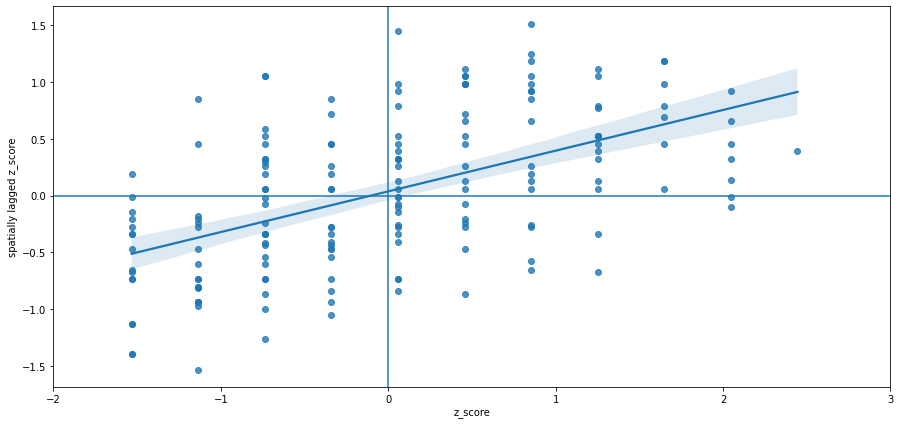

In [127]:
# plot
fig, ax = plt.subplots(1, 1, figsize=(15, 7))
sns.regplot(x = "z_score", y = "spatial_lag", data = gdf_spatial_lags_8, ax = ax)
ax.axhline(0.0)
ax.axvline(0.0)

x_min = math.floor(gdf_spatial_lags_8["z_score"].min())
x_max = math.ceil(gdf_spatial_lags_8["z_score"].max())

ax.set_xlim(x_min, x_max)
ax.set_xlabel("z_score")
ax.set_ylabel("spatially lagged z_score");

## IV.2. The PySAL baseline 

Read docs at: https://splot.readthedocs.io/en/stable/users/tutorials/autocorrelation.html

Based on our column of geometries (Shapely objects), PySAL will build its own weights matrix.

In [128]:
help(esda.moran.Moran.__init__)

Help on function __init__ in module esda.moran:

__init__(self, y, w, transformation='r', permutations=999, two_tailed=True)
    Initialize self.  See help(type(self)) for accurate signature.



In [129]:
def wrapper_over_esda_Global_Moran_I(gdf_prepared, geometry_field, value_field):

    # weights
    wq = pys.weights.Queen.from_dataframe(df = gdf_prepared,
                                          geom_col = "geometry")
    y = gdf_prepared[value_field].values

    # transformation="r" performs row-standardization of weights matrix
    mi = esda.moran.Moran(y = y, w = wq, transformation="r",
                          permutations=999, two_tailed=True)
    return mi

In [130]:
mi = wrapper_over_esda_Global_Moran_I(gdf_prepared = dict_prepared_GMI[8],
                                      geometry_field = "geometry",
                                      value_field = "value")

print("\nGlobal Moran I:", mi.I, "   p_sim =", mi.p_sim)


Global Moran I: 0.3587297555967855    p_sim = 0.001


In [131]:
%%capture 
# we used capture to prevent displaying lots of warnings of island geometries, such as:
# ('WARNING: ', 208, ' is an island (no neighbors)')

mi = wrapper_over_esda_Global_Moran_I(gdf_prepared = dict_prepared_GMI[9],
                                      geometry_field = "geometry",
                                      value_field = "value")

In [132]:
print("\nGlobal Moran I:", mi.I, "   p_sim =", mi.p_sim)


Global Moran I: 0.12473611802014678    p_sim = 0.001


In [133]:
%%capture 
# we used capture to prevent displaying lots of warnings of island geometries
mi = wrapper_over_esda_Global_Moran_I(gdf_prepared = dict_prepared_GMI[10],
                                      geometry_field = "geometry",
                                      value_field = "value")

In [134]:
print("\nGlobal Moran I:", mi.I, "   p_sim =", mi.p_sim)


Global Moran I: -0.012496648434402879    p_sim = 0.023


Interpretation: while at resolution 10, we fail to reject H0 of spatial randomness, at resolution 8 and at resolution 9 we can reject H0 and conclude that there is positive global spatial autocorrelation (clustering) in the dataset.

## IV.3. Implementation of Global Moran's I formula from scratch using H3 

This time we manage the whole computation and use the ring1 column, instead of geometries.

In [135]:
def compute_Global_Moran_I_using_H3(gdf_prepared, variable_col = "z_score"):
    """Computes Global Moran I for an input dataframe which was prepared with method
       prepare_geodataframe_GMI"""

    S_wijzizj = 0
    S_wij = gdf_prepared.shape[0]

    # for better performance on lookup
    dict_z = dict(zip(gdf_prepared["hex_id"], gdf_prepared[variable_col]))
    dict_ring1 = dict(zip(gdf_prepared["hex_id"], gdf_prepared["ring1"]))

    # now, in step 2, for each hexagon get its hollow ring 1
    for hex_id in dict_z.keys():
        zi = dict_z[hex_id]
        list_hexes_ring = dict_ring1[hex_id]

        # filter and keep only the hexagons of this ring that have a value in our dataset
        hexes_ring_with_value = [item for item in list_hexes_ring if item in dict_z]
        num_hexes_ring_with_value = len(hexes_ring_with_value)

        # ensure row-standardized weights
        wij_adjusted = 1 / num_hexes_ring_with_value

        if num_hexes_ring_with_value > 0:
            # update sum
            sum_neighbors = sum([dict_z[k] for k in hexes_ring_with_value])
            S_wijzizj += wij_adjusted * zi * sum_neighbors

    GMI = S_wijzizj / S_wij
    return GMI


In [136]:
def reshuffle_and_recompute_GMI(gdf_prepared, variable_col = "z_score",
                                num_permut = 999, I_observed = None,
                                alpha = 0.005, alternative = "greater",
                                flag_plot = True, flag_verdict = True):
    """Permutation inference with number of permutations given by num_permut and
       pseudo significance level specified by alpha"""

    gdf_aggreg_reshuff = gdf_prepared.copy()
    list_reshuff_I = []

    for i in range(num_permut):
        # simulate by reshuffling column
        gdf_aggreg_reshuff[variable_col] = np.random.permutation(
                                             gdf_aggreg_reshuff[variable_col].values)

        I_reshuff = compute_Global_Moran_I_using_H3(gdf_prepared = gdf_aggreg_reshuff)
        list_reshuff_I.append(I_reshuff)

    # for hypothesis testing
    list_reshuff_I.append(I_observed)

    # empirical CDF
    ecdf_GMI = sm.distributions.empirical_distribution.ECDF(list_reshuff_I, side = "left")

    percentile_observedI = stats.percentileofscore(list_reshuff_I,
                                                   I_observed,
                                                   kind='strict')
    # note: use decimal to avoid 99.9 / 100 = 0.9990000000000001
    percentile_observedI_ = float(str(decimal.Decimal(str(percentile_observedI)) / 100))

    try:
        assert(ecdf_GMI(I_observed) == percentile_observedI_)
    except Exception:
        pass
        # print(ecdf_GMI(I_observed), " vs ", percentile_observedI_)

    msg_reject_H0 = "P_sim = {:3f} , we can reject H0"
    msg_failtoreject_H0 = "P_sim = {:3f} , we fail to reject H0 under alternative {}"
        
    if alternative == "greater":
        pseudo_p_value = 1 - ecdf_GMI(I_observed)
        if flag_verdict is True:
            if pseudo_p_value < alpha:
                print(msg_reject_H0.format(pseudo_p_value))
            else:
                print(msg_failtoreject_H0.format(pseudo_p_value, alternative))
    elif alternative == "less":
        pseudo_p_value = ecdf_GMI(I_observed)
        if flag_verdict is True:
            if pseudo_p_value < alpha:
                print(msg_reject_H0.format(pseudo_p_value))
            else:
                print(msg_failtoreject_H0.format(pseudo_p_value, alternative))
    elif alternative == "two-tailed":
        pseudo_p_value_greater = 1 - ecdf_GMI(I_observed)
        pseudo_p_value_less = ecdf_GMI(I_observed)
        pseudo_p_value = min(pseudo_p_value_greater, pseudo_p_value_less)
        
        if flag_verdict is True:
            if (pseudo_p_value_greater < alpha/2):
                print(msg_reject_H0.format(pseudo_p_value_greater))
            elif (pseudo_p_value_less < alpha/2):
                print(msg_reject_H0.format(pseudo_p_value_less))
            else:
                pseudo_p_value = min(pseudo_p_value_greater, pseudo_p_value_less)
                print(msg_failtoreject_H0.format(pseudo_p_value, alternative))
        
    if flag_plot is True:
        fig, ax = plt.subplots(1, 2, figsize=(20, 7),
                               gridspec_kw={'width_ratios': [2, 3]})
        gdf_prepared.plot(column=variable_col, cmap= "viridis", ax=ax[0], legend=False)

        ax[1].hist(list_reshuff_I, density=True, bins=50)
        ax[1].axvline(I_observed, color = 'red', linestyle = '--', linewidth = 3)
        fig.tight_layout()
        
    return pseudo_p_value 

**Compute at various index resolutions**

In [137]:
%%time

I_8 = compute_Global_Moran_I_using_H3(gdf_prepared = dict_prepared_GMI[8])
print("I =", I_8)

I = 0.3587297555967855
CPU times: user 0 ns, sys: 0 ns, total: 0 ns
Wall time: 789 µs


P_sim = 0.001000 , we can reject H0
CPU times: user 1.6 s, sys: 232 ms, total: 1.83 s
Wall time: 1.7 s


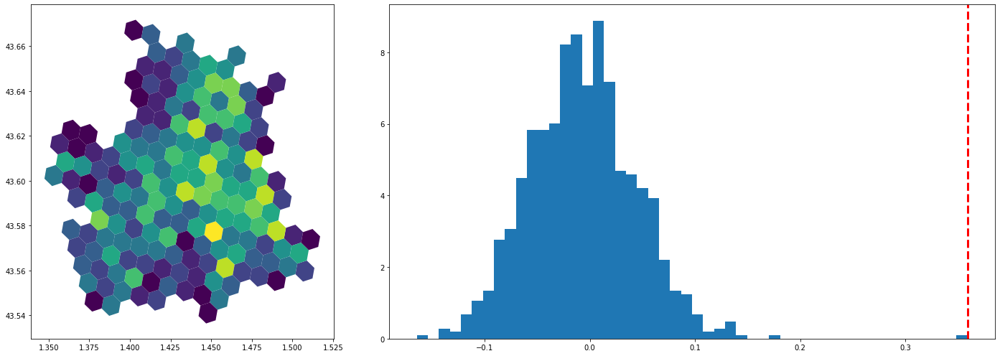

In [138]:
%%time
p_sim = reshuffle_and_recompute_GMI(gdf_prepared = dict_prepared_GMI[8],   
                                    num_permut = 999,                            
                                    I_observed = I_8,
                                    alternative = "two-tailed",
                                    flag_plot = True)

In [139]:
%%time
p_sim = reshuffle_and_recompute_GMI(gdf_prepared = dict_prepared_GMI[8],   
                                    num_permut = 999,                            
                                    I_observed = I_8,
                                    alternative = "greater",
                                    flag_plot = False)

P_sim = 0.001000 , we can reject H0
CPU times: user 760 ms, sys: 0 ns, total: 760 ms
Wall time: 761 ms


In [140]:
%%time
I_9 = compute_Global_Moran_I_using_H3(gdf_prepared = dict_prepared_GMI[9])
print("I =",I_9)

I = 0.12473611802014639
CPU times: user 0 ns, sys: 4 ms, total: 4 ms
Wall time: 3.58 ms


P_sim = 0.001000 , we can reject H0
CPU times: user 4.3 s, sys: 260 ms, total: 4.56 s
Wall time: 4.2 s


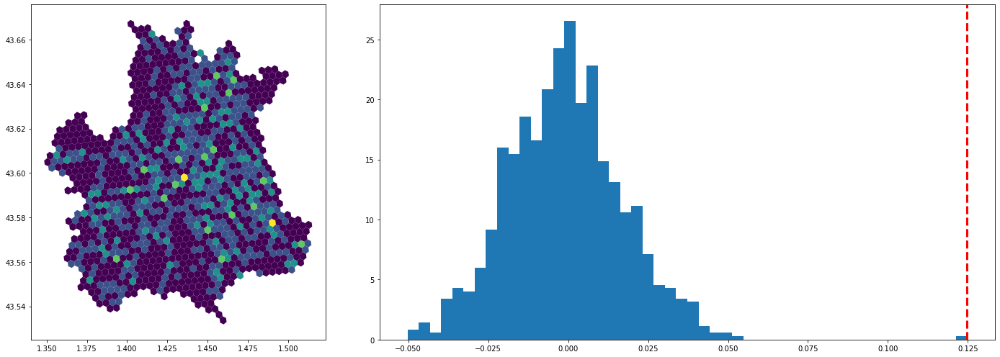

In [141]:
%%time
p_sim = reshuffle_and_recompute_GMI(gdf_prepared = dict_prepared_GMI[9], 
                                    num_permut = 999,                            
                                    I_observed = I_9,
                                    alternative = "two-tailed",
                                    flag_plot = True)

In [142]:
%%time
p_sim = reshuffle_and_recompute_GMI(gdf_prepared = dict_prepared_GMI[9], 
                                    num_permut = 999,                            
                                    I_observed = I_9,
                                    alternative = "greater",
                                    flag_plot = False)

P_sim = 0.001000 , we can reject H0
CPU times: user 3.61 s, sys: 4 ms, total: 3.61 s
Wall time: 3.61 s


In [144]:
%%time
I_10 = compute_Global_Moran_I_using_H3(gdf_prepared = dict_prepared_GMI[10])

print("I =",I_10)

I = -0.012496648434402664
CPU times: user 32 ms, sys: 0 ns, total: 32 ms
Wall time: 30.4 ms


P_sim = 0.023000 , we fail to reject H0 under alternative two-tailed
CPU times: user 30.8 s, sys: 288 ms, total: 31.1 s
Wall time: 30.6 s


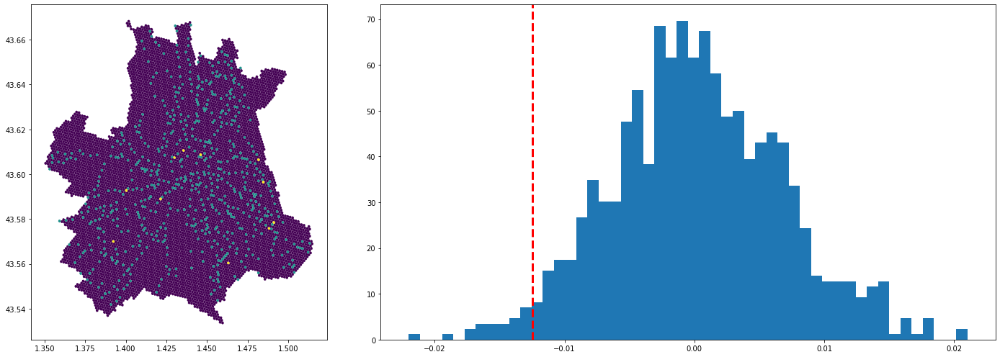

In [145]:
%%time
p_sim = reshuffle_and_recompute_GMI(gdf_prepared = dict_prepared_GMI[10],  
                                    num_permut = 999,                            
                                    I_observed = I_10,
                                    alternative = "two-tailed",
                                    flag_plot = True)

In [146]:
%%time
p_sim = reshuffle_and_recompute_GMI(gdf_prepared = dict_prepared_GMI[10],  
                                    num_permut = 999,                            
                                    I_observed = I_10,
                                    alternative = "less",
                                    flag_plot = False)

P_sim = 0.018000 , we fail to reject H0 under alternative less
CPU times: user 26.3 s, sys: 24 ms, total: 26.4 s
Wall time: 26.4 s


## IV.4. Spatial Autocorrelation Prediction with Tensorflow

We build a Convolutional Neural Network with Tensorflow, able to classify an input spatial distribution of points (over the central subzone of Toulouse), bucketed into H3 cells at resolution 9 and converted to a matrix using H3 IJ coordinates system, into one of the following 2 classes: 
 * complete spatial randomness
 * global spatial autocorrelation (clustered)
 
Note: the IJ coordinate system was overviewed in the preliminaries section I.3. of this notebook.

Having chosen to prototype for resolution 9 of the H3 index, let's first see the matrix size corresponding to the central subzone of Toulouse: 

In [147]:
df_test = dict_prepared_GMI[9][["hex_id", "z_score"]]
df_test.head()

,hex_id,z_score
0,893960112cfffff,-0.75803
1,8939601843bffff,0.60096
2,8939601a80bffff,-0.75803
3,89396019583ffff,-0.75803
4,8939601805bffff,0.60096


### IV.4.1. Dataframe to matrix

In [148]:
def df_to_matrix(df):
    
    """Given a dataframe with columns hex_id and value, with the set of all rows' hex_id 
       covering the geometry under study (a district, a subzone, any custom polygon),
       create the marix with values in ij coordinate system"""

    # take first row's hex_id as local origin
    # (it doesn't matter this choice, as we'll post-process the resulted ij)
    dict_ij = {}
    dict_values = {}

    local_origin = df.iloc[0]["hex_id"]

    for i, row in df.iterrows():
        ij_ex = h3.experimental_h3_to_local_ij(origin = local_origin,
                                               h = row["hex_id"])
        dict_ij[row["hex_id"]] = ij_ex
        dict_values[row["hex_id"]] = row["z_score"]

    # post-process
    min_i = min([dict_ij[h][0] for h in dict_ij])
    min_j = min([dict_ij[h][1] for h in dict_ij])

    max_i = max([dict_ij[h][0] for h in dict_ij])
    max_j = max([dict_ij[h][1] for h in dict_ij])

    # rescale
    dict_ij_rescaled = {}
    for h in dict_ij:
        dict_ij_rescaled[h] = [dict_ij[h][0] - min_i, dict_ij[h][1] - min_j]

    num_rows = max_i - min_i + 1
    num_cols = max_j - min_j + 1

    arr_ij = np.zeros(shape=(num_rows, num_cols), dtype = np.float32)

    for h in dict_ij_rescaled:
        arr_ij[dict_ij_rescaled[h][0]][dict_ij_rescaled[h][1]] = dict_values[h]

    return arr_ij

In [149]:
arr_ij_busstops = df_to_matrix(df = df_test)
print(arr_ij_busstops.shape)



(48, 52)


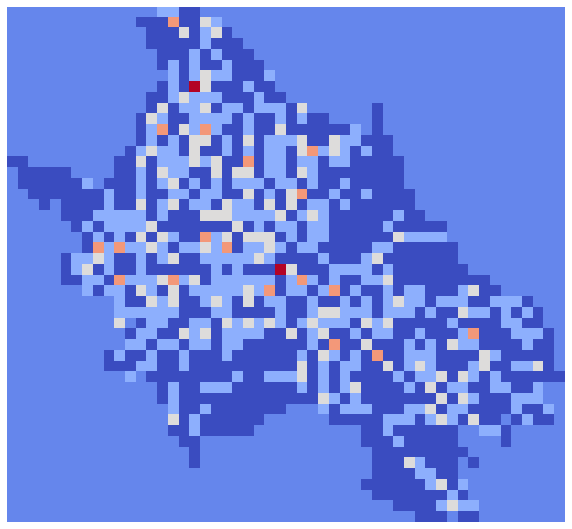

In [151]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.imshow(arr_ij_busstops, cmap='coolwarm', interpolation = None)
ax.set_axis_off()
fig.savefig("images/matrix_city_busstops.png");

### IV.4.2. Generate dataset for training:

For this, we'll use PySAL's Pointpats library:

In [152]:
help(pp.PoissonPointProcess.__init__)

Help on function __init__ in module pointpats.process:

__init__(self, window, n, samples, conditioning=False, asPP=False)
    Initialize self.  See help(type(self)) for accurate signature.



In [153]:
help(pp.PoissonClusterPointProcess.__init__)

Help on function __init__ in module pointpats.process:

__init__(self, window, n, parents, radius, samples, keep=False, asPP=False, conditioning=False)
    Initialize self.  See help(type(self)) for accurate signature.



In [154]:
# create spatial window for generating points
geom_subzone = gdf_subzone_sel["geometry"].values[0]
xs = geom_subzone.exterior.coords.xy[0]
ys = geom_subzone.exterior.coords.xy[1]
vertices = [(xs[i], ys[i]) for i in range(len(xs))]
print(vertices[0:10])
print(" ------------------------------------------------------------------- ")

window = pp.Window(vertices)
print("Window's bbox:", window.bbox)

[(1.366481542003093, 43.62502895130769), (1.367247214839326, 43.62552087347647), (1.367844669417537, 43.62618638661475), (1.367922768695578, 43.62626937505768), (1.368188803129415, 43.626490196179844), (1.369398298913127, 43.62829157447098), (1.369598911890843, 43.628772980780425), (1.37015062973521, 43.62856575333628), (1.370422426589066, 43.62843088351541), (1.37070492407524, 43.62827906823929)]
 ------------------------------------------------------------------- 
Window's bbox: [1.350331161193069, 43.532696867124294, 1.515335602799037, 43.66870192797021]


In [155]:
# demo a CSR and a clustered point pattern generated with PySAL
np.random.seed(13)
num_points_to_gen = 500
num_parents = 50

samples_csr = pp.PoissonPointProcess(window = window, 
                                     n = num_points_to_gen, 
                                     samples = 1, 
                                     conditioning = False,
                                     asPP = False)
pp_csr = pp.PointPattern(samples_csr.realizations[0])
print(samples_csr.realizations[0][0:3], "\n")
df_csr = pd.DataFrame(samples_csr.realizations[0], 
                      columns= ["longitude", "latitude"])
print(df_csr.head(3))
print(" ----------------------------------------------------- ")

samples_clustered = pp.PoissonClusterPointProcess(window = window, 
                                                  n = num_points_to_gen, 
                                                  parents = num_parents, 
                                                  radius = 0.01, 
                                                  samples = 1, 
                                                  asPP = False, 
                                                  conditioning = False)
pp_clustered = pp.PointPattern(samples_clustered.realizations[0])
print(samples_clustered.realizations[0][0:3], "\n")
df_clustered = pd.DataFrame(samples_clustered.realizations[0], 
                            columns= ["longitude", "latitude"])
print(df_clustered.head(3))
# --------------------------------------------------------

[[ 1.47865551 43.60626597]
 [ 1.38952652 43.56736603]
 [ 1.48634078 43.56247971]] 

   longitude  latitude
0    1.47866  43.60627
1    1.38953  43.56737
2    1.48634  43.56248
 ----------------------------------------------------- 
[[ 1.45673755 43.56461533]
 [ 1.44174544 43.55417856]
 [ 1.39315868 43.61808366]] 

   longitude  latitude
0    1.45674  43.56462
1    1.44175  43.55418
2    1.39316  43.61808


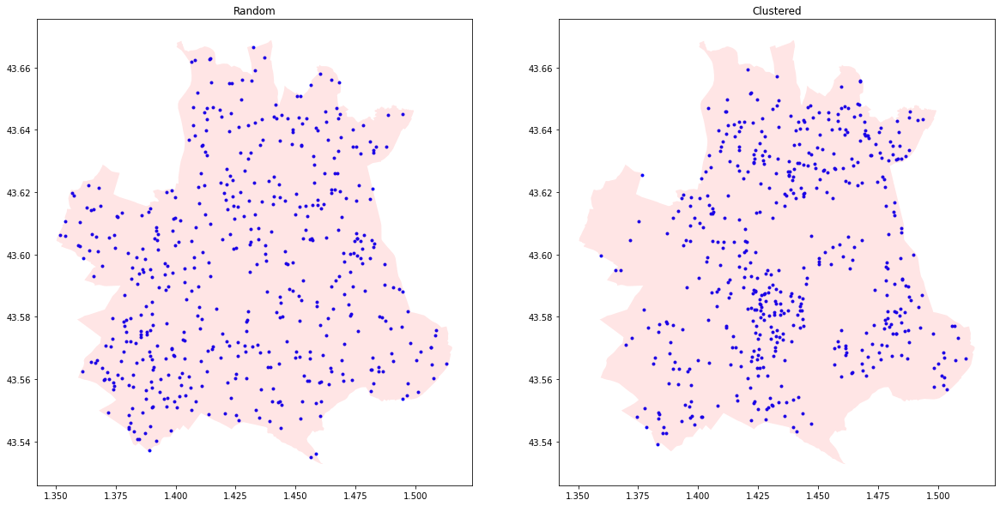

In [156]:
fig, ax = plt.subplots(1, 2, figsize = (20, 10))

ax[0].fill(xs, ys, alpha=0.1, fc='r', ec='none')
ax[0].scatter(df_csr[["longitude"]], df_csr[["latitude"]], 
              fc = "blue", marker=".", s = 35)
ax[0].set_title("Random")

ax[1].fill(xs, ys, alpha=0.1, fc='r', ec='none')
ax[1].scatter(df_clustered[["longitude"]], df_clustered[["latitude"]], 
              fc = "blue", marker=".", s = 35)
ax[1].set_title("Clustered");

Note: varying the radius of the clustered point process we get various degrees of spatial clustering.

What we have to do next is to index the realizations into H3 at resolution 9, outer join with the set of cells of resolution 9 covering this city subzone and compute Global Moran's I.

In [168]:
def generate_training_sample(window, flag_clustered = True, 
                             num_points_to_generate = 500,
                             num_parents = 50, radius_offsprings = 0.01):
    
    # generate points in space
    if flag_clustered is True:
        samples_generated = pp.PoissonClusterPointProcess(
                                 window = window, 
                                 n = num_points_to_generate, 
                                 parents = num_parents, 
                                 radius = radius_offsprings, 
                                 samples = 1, 
                                 asPP = False, 
                                 conditioning = False)
    else:
        samples_generated = pp.PoissonPointProcess(
                                 window = window, 
                                 n = num_points_to_generate, 
                                 samples = 1, 
                                 conditioning = False,
                                 asPP = False)
        
    # make dataframe with their lon/lat
    df_generated = pd.DataFrame(samples_generated.realizations[0], 
                                columns= ["longitude", "latitude"])
    # index in H3
    df_generated["hex_id_9"] = df_generated.apply(
                                  lambda row: h3.geo_to_h3(
                                              lat = row["latitude"],
                                              lng = row["longitude"],
                                              resolution = 9),
                                  axis = 1)
    
    # counts groupped by cell
    df_aggreg = df_generated.groupby(by = "hex_id_9").agg({"latitude": "count"})
    df_aggreg.reset_index(inplace = True)
    df_aggreg.rename(columns={"latitude": "value"}, inplace = True)
    
    # outer join with set of cells covering the city's subzone
    df_outer = pd.merge(left = dict_fillings[9][["hex_id", "geometry"]],
                        right = df_aggreg[["hex_id_9", "value"]],
                        left_on = "hex_id",
                        right_on = "hex_id_9",
                        how = "left")
    df_outer.drop(columns = ["hex_id_9"], inplace = True)
    df_outer["value"].fillna(value = 0, inplace = True)
    
    # compute Global Moran's I
    df_GMI_prepared = prepare_geodataframe_GMI(df_outer,
                                               num_rings = 1,
                                               flag_debug = False,
                                               flag_return_gdf = False)
    
    I_9 = compute_Global_Moran_I_using_H3(gdf_prepared = df_GMI_prepared)
    
    # assert the hypothesis testing is consistent with the manner we generated points
    p_sim = reshuffle_and_recompute_GMI(gdf_prepared = df_GMI_prepared, 
                                        num_permut = 999,                            
                                        I_observed = I_9,
                                        alternative = "two-tailed",
                                        flag_plot = False, flag_verdict = False)
    
    result_valid = True
    alpha = 0.005
    if (p_sim > alpha) and (flag_clustered is True):
        msg_ = "Failed to produce clustered point pattern with params {},{},{} (failed to reject H0)" 
        print(msg_.format(num_points_to_generate, num_parents, radius_offsprings))
        result_valid = False
    elif (p_sim < alpha) and (flag_clustered is False):
        print("Failed to produce random point pattern (H0 was rejected)")
        result_valid = False
    
    # create matrix
    arr_ij = df_to_matrix(df = df_GMI_prepared)
    
    if result_valid is True:
        # return the matrix and the computed Moran's I
        return arr_ij, I_9, samples_generated.realizations[0]
    else:
        return None, None, None
    

Distributions from which to draw the num_points_to_generate,num_parents, radius_offsprings

In [169]:
# sidenote: how it works
list_multiples_of_100 = [random.randrange(100, 1000, 100) for _ in range(50)]
print(Counter(list_multiples_of_100))

list_choice = [random.choice([0.01, 0.02, 0.03, 0.05]) for _ in range(50)]
print(Counter(list_choice))

Counter({800: 7, 600: 7, 500: 6, 200: 6, 900: 6, 700: 6, 400: 4, 300: 4, 100: 4})
Counter({0.03: 15, 0.05: 13, 0.01: 11, 0.02: 11})


**Generate a small batch of samples with randomly distributed points**

In [182]:
%%time
arr_matrices = None
arr_GMI = np.array([])
arr_labels = np.array([])
arr_points = []

k = 0
while k < 10:
    arr_ij, GMI, points = generate_training_sample(
                            window = window,
                            flag_clustered = False, 
                            num_points_to_generate = random.randrange(100, 1000, 100),
                            num_parents = None, 
                            radius_offsprings = None)
    if GMI is not None:
        if arr_matrices is None:
            arr_matrices = np.array([arr_ij])
        else:
            arr_matrices = np.vstack((arr_matrices, [arr_ij]))
        arr_GMI = np.append(arr_GMI, GMI)
        arr_labels = np.append(arr_labels, 0)
        arr_points.append(points)
        k = k + 1

np.save("datasets_demo/smallbatch.npy", arr_matrices)

CPU times: user 1min 6s, sys: 120 ms, total: 1min 7s
Wall time: 1min 7s


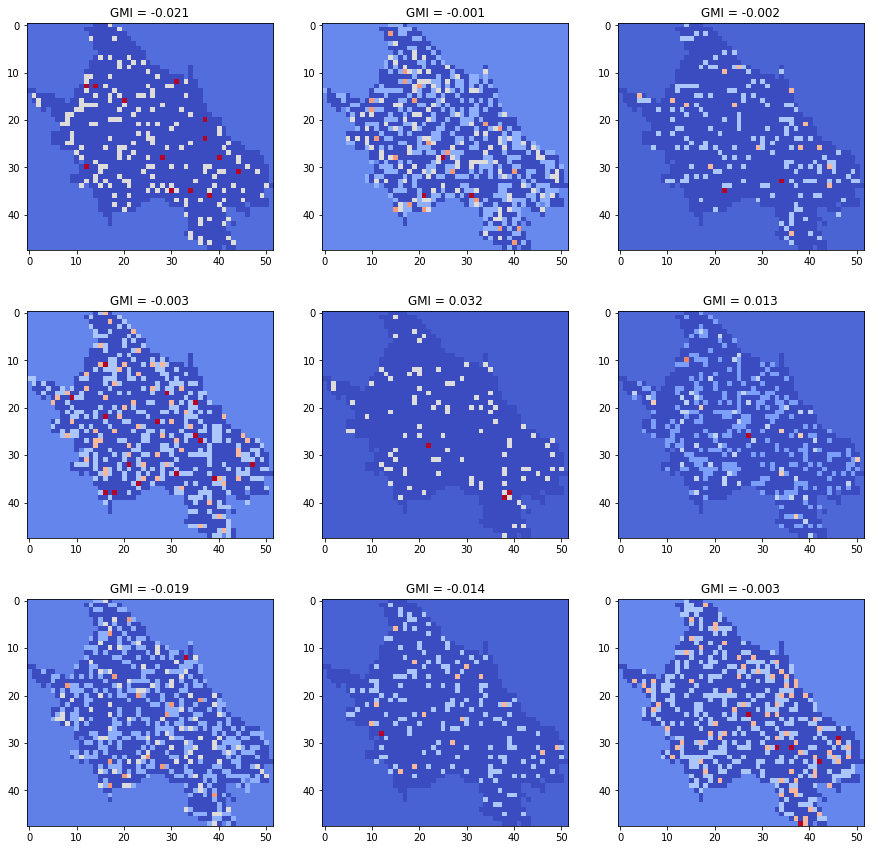

In [183]:
fig, ax = plt.subplots(3, 3, figsize = (15, 15))

arr_restored = np.load("datasets_demo/smallbatch.npy")

for k1 in range(3):
    for k2 in range(3):
        arr_ij = arr_restored[3 * k1 + k2]
        GMI = arr_GMI[3 * k1 + k2]
        ax[k1][k2].imshow(arr_ij, cmap='coolwarm', interpolation = None)
        ax[k1][k2].set_title("GMI = {}".format(round(GMI, 3)))

**Generate a small batch of samples with spatially clustered points:**

In [184]:
%%time
arr_matrices = None
arr_GMI = np.array([])
arr_labels = np.array([])
arr_points = []

k = 0
while k < 10:
    arr_ij, GMI, points  = generate_training_sample(
                            window = window,
                            flag_clustered = True, 
                            num_points_to_generate = random.randrange(100, 1000, 100),
                            num_parents = random.randrange(10, 100, 10), 
                            radius_offsprings = random.choice([0.01, 0.02, 0.03, 0.05]))
    if GMI is not None:
        if arr_matrices is None:
            arr_matrices = np.array([arr_ij])
        else:
            arr_matrices = np.vstack((arr_matrices, [arr_ij]))
        arr_GMI = np.append(arr_GMI, GMI)
        arr_labels = np.append(arr_labels, 0)
        arr_points.append(points)
        k = k + 1

np.save("datasets_demo/smallbatch2.npy", arr_matrices)

Failed to produce clustered point pattern with params 200,30,0.05 (failed to reject H0)
Failed to produce clustered point pattern with params 400,20,0.05 (failed to reject H0)
Failed to produce clustered point pattern with params 100,20,0.03 (failed to reject H0)
Failed to produce clustered point pattern with params 200,10,0.05 (failed to reject H0)
Failed to produce clustered point pattern with params 500,50,0.03 (failed to reject H0)
Failed to produce clustered point pattern with params 300,60,0.02 (failed to reject H0)
Failed to produce clustered point pattern with params 300,20,0.05 (failed to reject H0)
Failed to produce clustered point pattern with params 900,60,0.03 (failed to reject H0)
Failed to produce clustered point pattern with params 800,30,0.05 (failed to reject H0)
Failed to produce clustered point pattern with params 900,80,0.05 (failed to reject H0)
Failed to produce clustered point pattern with params 100,20,0.03 (failed to reject H0)
Failed to produce clustered poin

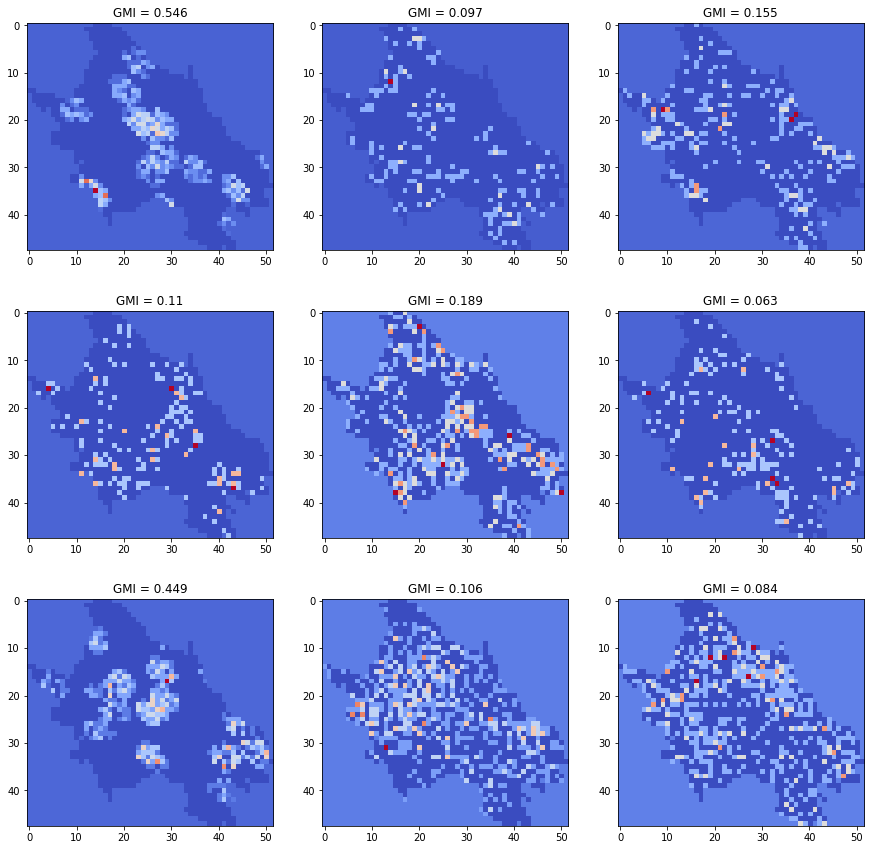

In [185]:
fig, ax = plt.subplots(3, 3, figsize = (15, 15))

arr_restored = np.load("datasets_demo/smallbatch2.npy")

for k1 in range(3):
    for k2 in range(3):
        arr_ij = arr_restored[3 * k1 + k2]
        GMI = arr_GMI[3 * k1 + k2]
        ax[k1][k2].imshow(arr_ij, cmap='coolwarm', interpolation = None)
        ax[k1][k2].set_title("GMI = {}".format(round(GMI, 3)))

Correspond to the following clustered point process realizations:

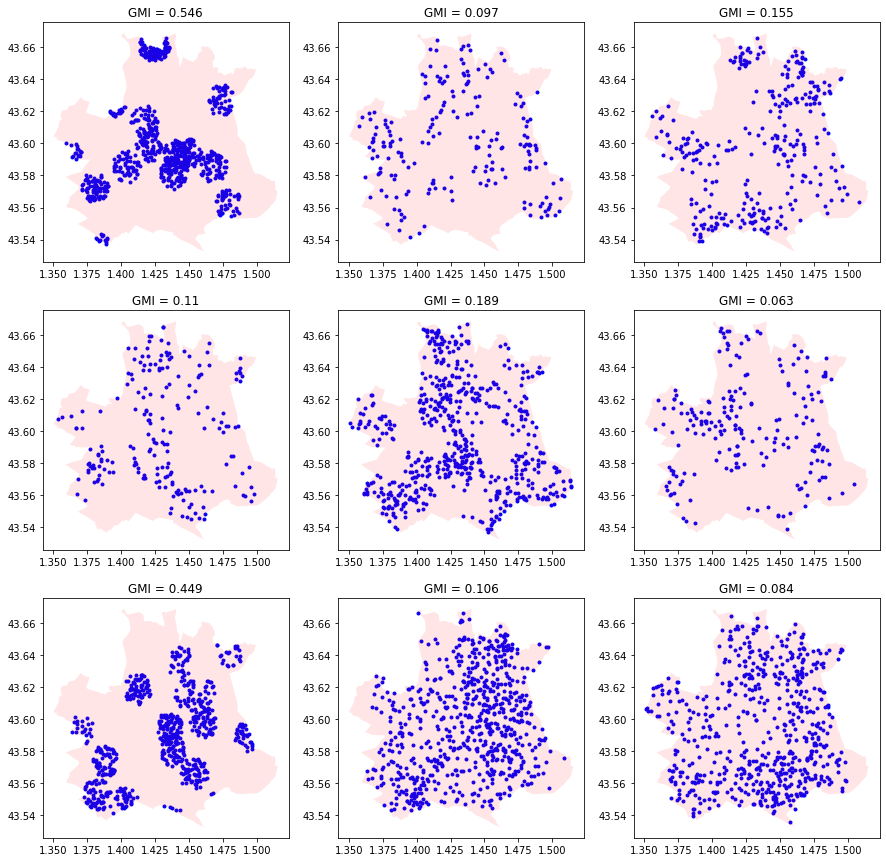

In [186]:
fig, ax = plt.subplots(3, 3, figsize = (15, 15))

for k1 in range(3):
    for k2 in range(3):
        points = arr_points[3 * k1 + k2]
        GMI = arr_GMI[3 * k1 + k2]
        # the shape of the subzone in pale pink
        ax[k1][k2].fill(xs, ys, alpha=0.1, fc='r', ec='none')
        # the points generated
        df_clust = pd.DataFrame(points, 
                                columns= ["longitude", "latitude"])
        ax[k1][k2].scatter(
              df_clust[["longitude"]], df_clust[["latitude"]], 
              fc = "blue", marker=".", s = 35)
        ax[k1][k2].set_title("GMI = {}".format(round(GMI, 3)))


**Generate the actual training set:**

In [190]:
%%capture
arr_matrices = None
arr_GMI = np.array([])
arr_labels = np.array([])
list_points = []

k = 0
while k < 600:
    arr_ij, GMI, points = generate_training_sample(
                            window = window,
                            flag_clustered = False, 
                            num_points_to_generate = random.randrange(100, 1000, 100),
                            num_parents = None, 
                            radius_offsprings = None)
    if GMI is not None:
        if arr_matrices is None:
            arr_matrices = np.array([arr_ij])
        else:
            arr_matrices = np.vstack((arr_matrices, [arr_ij]))
        arr_GMI = np.append(arr_GMI, GMI)
        arr_labels = np.append(arr_labels, 0)
        arr_points = np.concatenate((arr_points,))
        list_points.append(points)
        k = k + 1

np.save("datasets_demo/csr_matrices.npy", arr_matrices)
np.save("datasets_demo/csr_GMI.npy", arr_GMI)

arr_points = np.array(list_points)
np.save("datasets_demo/csr_points.npy", arr_points)

In [191]:
%%capture

arr_matrices = None
arr_GMI = np.array([])
arr_labels = np.array([])
list_points = []

k = 0
while k < 600:
    arr_ij, GMI, points = generate_training_sample(
                            window = window,
                            flag_clustered = True, 
                            num_points_to_generate = random.randrange(100, 1000, 100),
                            num_parents = random.randrange(10, 100, 10), 
                            radius_offsprings = random.choice([0.01, 0.02, 0.03, 0.05]))
    if GMI is not None:
        if arr_matrices is None:
            arr_matrices = np.array([arr_ij])
        else:
            arr_matrices = np.vstack((arr_matrices, [arr_ij]))
        arr_GMI = np.append(arr_GMI, GMI)
        arr_labels = np.append(arr_labels, 0)
        list_points.append(points)
        k = k + 1

np.save("datasets_demo/clustered_matrices.npy", arr_matrices)
np.save("datasets_demo/clustered_GMI.npy", arr_GMI)

arr_points = np.array(list_points)
np.save("datasets_demo/clustered_points.npy", arr_points)

In [192]:
!rm datasets_demo/a.npy
!ls -al datasets_demo/*.npy

-rw-rw-r-- 1 camelia camelia    4928 aug  9 11:10 datasets_demo/clustered_GMI.npy
-rw-rw-r-- 1 camelia camelia 5990528 aug  9 11:10 datasets_demo/clustered_matrices.npy
-rw-rw-r-- 1 camelia camelia 5598761 aug  9 11:10 datasets_demo/clustered_points.npy
-rw-rw-r-- 1 camelia camelia    4928 aug  9 09:19 datasets_demo/csr_GMI.npy
-rw-rw-r-- 1 camelia camelia 5990528 aug  9 09:19 datasets_demo/csr_matrices.npy
-rw-rw-r-- 1 camelia camelia 4886684 aug  9 09:19 datasets_demo/csr_points.npy
-rw-rw-r-- 1 camelia camelia   99968 aug  9 08:16 datasets_demo/smallbatch2.npy
-rw-rw-r-- 1 camelia camelia   99968 aug  9 08:13 datasets_demo/smallbatch.npy


### IV.4.3 Prepare Tensorflow Dataset:

In [ ]:
help(tf.data.Dataset.from_tensor_slices)

In [195]:
def prepare_datasets():
    
    batch_size = 4
    
    arr_ij_csr = np.load("datasets_demo/csr_matrices.npy")
    arr_ij_clustered = np.load("datasets_demo/clustered_matrices.npy")
    arr_ij_combined = np.concatenate((arr_ij_csr, arr_ij_clustered), axis = 0)
    assert(arr_ij_combined.shape[0] == (arr_ij_csr.shape[0] + arr_ij_clustered.shape[0]))
            
    #labels are 0 (for csr) and 1 (for clustered)
    labels_csr = np.zeros(arr_ij_csr.shape[0])
    labels_clustered = np.ones(arr_ij_clustered.shape[0])
    labels_combined = np.concatenate((labels_csr, labels_clustered), axis = 0)
    assert(labels_combined.shape[0] == arr_ij_combined.shape[0])

    with tf.device('/cpu:0'):
        dataset_matrices = tf.data.Dataset.from_tensor_slices(arr_ij_combined)
        dataset_labels = tf.data.Dataset.from_tensor_slices(labels_combined)
        
        dataset = tf.data.Dataset.zip((dataset_matrices, dataset_labels))
        dataset = dataset.shuffle(buffer_size=2000)
        print(dataset)
        print(" ------------------------------------------------------------ ")

        train_dataset = dataset.take(1000)
        validation_dataset = dataset.skip(1000)

        # we need repeat() otherwise it will later complain that:
        # tensorflow:Your input ran out of data; interrupting training.
        train_dataset = train_dataset.repeat().batch(batch_size)
        validation_dataset = validation_dataset.repeat().batch(batch_size)

        train_dataset = train_dataset.prefetch(1)
        validation_dataset = validation_dataset.prefetch(1)

        print(train_dataset)
        print(validation_dataset)
        
        return train_dataset, validation_dataset

In [196]:
train_dataset, validation_dataset = prepare_datasets()

<ShuffleDataset shapes: ((48, 52), ()), types: (tf.float32, tf.float64)>
 ------------------------------------------------------------ 
<PrefetchDataset shapes: ((None, 48, 52), (None,)), types: (tf.float32, tf.float64)>
<PrefetchDataset shapes: ((None, 48, 52), (None,)), types: (tf.float32, tf.float64)>


In [197]:
# get a batch of samples

# note: make_one_shot_iterator was deprecated in tf v2
iterator = train_dataset.__iter__() 
x_batch = next(iterator)

print(type(x_batch[0]), x_batch[0].dtype, x_batch[0].shape)
print(type(x_batch[1]), x_batch[1].dtype, x_batch[1].shape)

<class 'tensorflow.python.framework.ops.EagerTensor'> <dtype: 'float32'> (4, 48, 52)
<class 'tensorflow.python.framework.ops.EagerTensor'> <dtype: 'float64'> (4,)


(48, 52)


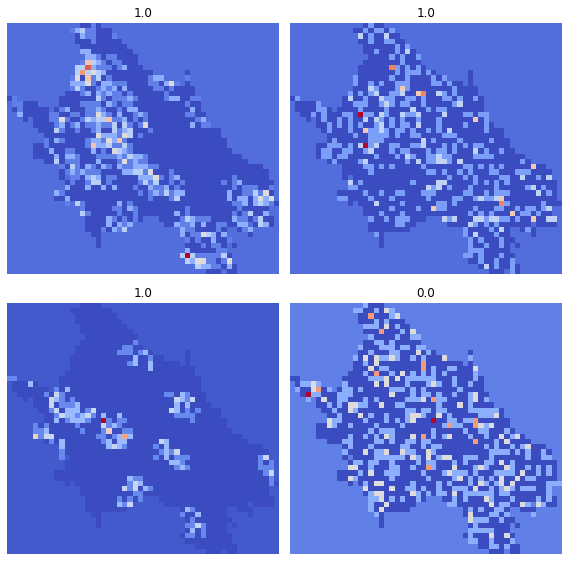

In [198]:
batch_size = 4
nr = batch_size // 2

fig = plt.figure(figsize = (8, 8))

for i in range(0, nr * nr):
    ax = fig.add_subplot(nr, nr, i+1)
    image = x_batch[0][i]
    if i == 0:
        print(image.shape)
    ax.imshow(image, cmap="coolwarm", interpolation = None)
    ax.set_title(str(x_batch[1][i].numpy()))
    ax.set_axis_off()

fig.tight_layout()

### IV.4.4. Build the Tensorflow model:

The first convolution layer has a specified kernel and is not trainable, its role being of computing the spatial lag 

In [199]:
def get_fixed_kernel(shape = (3, 3, 1, 1), dtype=np.float32):
    kernel_fixed = np.array([[1/6, 1/6, 0],
                            [1/6, 1, 1/6],
                            [0, 1/6, 1/6]])
    kernel = np.zeros(shape)
    kernel[:, :, 0, 0] = kernel_fixed
    return kernel


get_fixed_kernel()

array([[[[0.16666667]],

        [[0.16666667]],

        [[0.        ]]],


       [[[0.16666667]],

        [[1.        ]],

        [[0.16666667]]],


       [[[0.        ]],

        [[0.16666667]],

        [[0.16666667]]]])

In [200]:
help(layers.Conv2D.__init__)

Help on function __init__ in module tensorflow.python.keras.layers.convolutional:

__init__(self, filters, kernel_size, strides=(1, 1), padding='valid', data_format=None, dilation_rate=(1, 1), activation=None, use_bias=True, kernel_initializer='glorot_uniform', bias_initializer='zeros', kernel_regularizer=None, bias_regularizer=None, activity_regularizer=None, kernel_constraint=None, bias_constraint=None, **kwargs)



In [201]:
help(layers.Dense.__init__)

Help on function __init__ in module tensorflow.python.keras.layers.core:

__init__(self, units, activation=None, use_bias=True, kernel_initializer='glorot_uniform', bias_initializer='zeros', kernel_regularizer=None, bias_regularizer=None, activity_regularizer=None, kernel_constraint=None, bias_constraint=None, **kwargs)



In [202]:
def build_classifier():

    # build a sequential model using the functional API
    tf.keras.backend.clear_session()

    # theuse input shape (None,None,1) to allow variable size inputs; 1 channel
    model_inputs = tf.keras.Input(shape=(48, 52, 1), name = "ClassifInput")

    # first is a hexagonal convolution with the specified kernel (non-trainable)
    conv1 = layers.Conv2D(filters = 1, 
                          kernel_size = [3, 3], 
                          kernel_initializer = get_fixed_kernel, 
                          input_shape = (None, None, 1), 
                          padding = "valid",                       # no padding
                          use_bias = False,
                          activation='relu',
                          name='HexConv')
    conv1.trainable = False
    x = conv1(model_inputs)

    # other usual convolutional layers layer
    x = layers.Convolution2D(128, 3, 3, activation='relu', name='Conv2')(x)
    x = layers.Convolution2D(64, 3, 3, activation='relu', name='Conv3')(x)

    # here use GlobalAveragePooling2D; we cannot use Flatten because we have no fix inputshape
    x = layers.GlobalAveragePooling2D(data_format='channels_last', name='GlobalAvgPool')(x)

    x = layers.Dense(16, activation='relu', name='Dense1')(x)

    # the output for binary classifier
    model_outputs = layers.Dense(2, activation='softmax', name = "ClassifOutput")(x)

    model = tf.keras.Model(inputs = model_inputs, 
                           outputs = model_outputs, 
                           name="global_spatial_assoc_classifier")

    model.compile(loss = "sparse_categorical_crossentropy",
                  optimizer = tf.keras.optimizers.Adamax(learning_rate=0.001),
                  metrics = ["accuracy"])
    
    return model


In [203]:
model_classif = build_classifier()
model_classif.summary()

Model: "global_spatial_assoc_classifier"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
ClassifInput (InputLayer)    [(None, 48, 52, 1)]       0         
_________________________________________________________________
HexConv (Conv2D)             (None, 46, 50, 1)         9         
_________________________________________________________________
Conv2 (Conv2D)               (None, 15, 16, 128)       1280      
_________________________________________________________________
Conv3 (Conv2D)               (None, 5, 5, 64)          73792     
_________________________________________________________________
GlobalAvgPool (GlobalAverage (None, 64)                0         
_________________________________________________________________
Dense1 (Dense)               (None, 16)                1040      
_________________________________________________________________
ClassifOutput (Dense)        (None,

**Automatically generate diagram of the Tensorflow model in LaTex:**

In [204]:
!rm -r -f latex_files
!mkdir -p latex_files

In [205]:
# sidenote: how it works
print(to_head( '../PlotNeuralNet' ))
print("-----------------------------------------")
print(to_cor())
print("-----------------------------------------")
print(to_begin())
print("-----------------------------------------")
print(to_end())


\documentclass[border=8pt, multi, tikz]{standalone} 
\usepackage{import}
\subimport{../PlotNeuralNet/layers/}{init}
\usetikzlibrary{positioning}
\usetikzlibrary{3d} %for including external image 

-----------------------------------------

\def\ConvColor{rgb:yellow,5;red,2.5;white,5}
\def\ConvReluColor{rgb:yellow,5;red,5;white,5}
\def\PoolColor{rgb:red,1;black,0.3}
\def\UnpoolColor{rgb:blue,2;green,1;black,0.3}
\def\FcColor{rgb:blue,5;red,2.5;white,5}
\def\FcReluColor{rgb:blue,5;red,5;white,4}
\def\SoftmaxColor{rgb:magenta,5;black,7}   

-----------------------------------------

\newcommand{\copymidarrow}{\tikz \draw[-Stealth,line width=0.8mm,draw={rgb:blue,4;red,1;green,1;black,3}] (-0.3,0) -- ++(0.3,0);}

\begin{document}
\begin{tikzpicture}
\tikzstyle{connection}=[ultra thick,every node/.style={sloped,allow upside down},draw=\edgecolor,opacity=0.7]
\tikzstyle{copyconnection}=[ultra thick,every node/.style={sloped,allow upside down},draw={rgb:blue,4;red,1;green,1;black,3},opacity=0

In [207]:
list_info_layers = []


# note: every path should be relative to folder latex_files
arch = [
    to_head( '../PlotNeuralNet' ),
    """\\usepackage{geometry}
       \\geometry{
            paperwidth=6cm,
            paperheight=4cm,
            margin=0.5cm
        }
    """,
    to_cor(),
    to_begin()
]

last_lay = None
prev_lay_pos = "(0,0,0)"


for lay in list(model_classif.layers):
    list_info_layers.append((lay.name, type(lay), 
                             lay.input_shape, lay.output_shape))
    
    #for the latex diagram    
    # where to position the current layer in the diagram
    if last_lay is not None:
        output_dim = lay.output_shape
        if last_lay != "ClassifInput":
            prev_lay_pos = "({}-east)".format(last_lay)  
        else:
            prev_lay_pos = "(0,0,0)"
    else:
        output_dim = lay.output_shape[0]
        prev_lay_pos = "(-1,0,0)"
    print(str(type(lay)).ljust(50), output_dim)

    if isinstance(lay, layers.InputLayer) is True:
        arch.append(to_input(name = lay.name, 
                             pathfile = '../images/matrix_city_busstops.png', 
                             to = prev_lay_pos, 
                             width = 14, height = 14)
                   )
    
    elif isinstance(lay, layers.Conv2D) is True:
        size_kernel = lay.kernel_size[0]
        num_filters = lay.filters
            
        arch.append(to_Conv(name = lay.name,
                            s_filer = output_dim[2], 
                            n_filer = num_filters, 
                            offset = "(1,1,2)", 
                            to = prev_lay_pos,
                            depth = output_dim[1], height = output_dim[2], 
                            width = num_filters // 4,   # divide by 4 for design
                            caption=lay.name)
                   )
        
    elif isinstance(lay, layers.GlobalAveragePooling2D) is True:
        arch.append(to_Pool(name = lay.name, 
                            offset="(1,1,3)", 
                            to = prev_lay_pos, 
                            depth = 1, height = 1, 
                            width = output_dim[1]// 4,   # divide by 4 for design
                            caption = lay.name)
                   )
        
    elif isinstance(lay, layers.Dense) is True:
        num_units = lay.units
        
        arch.append(to_SoftMax(name = lay.name, 
                               s_filer = num_units,
                               offset="(2,1,3)", 
                               to = prev_lay_pos,
                               depth = output_dim[1], height = 1, 
                               width = 1, 
                               caption=lay.name)
                   )
        
    #prepare for next  
    last_lay = lay.name

arch.append(to_end())

pd.DataFrame(list_info_layers, columns = ["name", "type",
                                          "input_shape", "output_shape"])

<class 'tensorflow.python.keras.engine.input_layer.InputLayer'> (None, 48, 52, 1)
<class 'tensorflow.python.keras.layers.convolutional.Conv2D'> (None, 46, 50, 1)
<class 'tensorflow.python.keras.layers.convolutional.Conv2D'> (None, 15, 16, 128)
<class 'tensorflow.python.keras.layers.convolutional.Conv2D'> (None, 5, 5, 64)
<class 'tensorflow.python.keras.layers.pooling.GlobalAveragePooling2D'> (None, 64)
<class 'tensorflow.python.keras.layers.core.Dense'> (None, 16)
<class 'tensorflow.python.keras.layers.core.Dense'> (None, 2)


,name,type,input_shape,output_shape
0,ClassifInput,<class 'tensorflow.python.keras.engine.input_layer.InputLay...,"[(None, 48, 52, 1)]","[(None, 48, 52, 1)]"
1,HexConv,<class 'tensorflow.python.keras.layers.convolutional.Conv2D'>,"(None, 48, 52, 1)","(None, 46, 50, 1)"
2,Conv2,<class 'tensorflow.python.keras.layers.convolutional.Conv2D'>,"(None, 46, 50, 1)","(None, 15, 16, 128)"
3,Conv3,<class 'tensorflow.python.keras.layers.convolutional.Conv2D'>,"(None, 15, 16, 128)","(None, 5, 5, 64)"
4,GlobalAvgPool,<class 'tensorflow.python.keras.layers.pooling.GlobalAverag...,"(None, 5, 5, 64)","(None, 64)"
5,Dense1,<class 'tensorflow.python.keras.layers.core.Dense'>,"(None, 64)","(None, 16)"
6,ClassifOutput,<class 'tensorflow.python.keras.layers.core.Dense'>,"(None, 16)","(None, 2)"


In [208]:
%%capture
to_generate(arch, "latex_files/demovis_nn.tex")

In [209]:
%%sh
cd latex_files
pdflatex demovis_nn.tex  >/dev/null 2>&1

In [210]:
!ls -alh latex_files

total 84K
drwxrwxr-x  2 camelia camelia 4,0K aug  9 11:15 .
drwxrwxr-x 11 camelia camelia 4,0K aug  9 11:15 ..
-rw-rw-r--  1 camelia camelia    8 aug  9 11:15 demovis_nn.aux
-rw-rw-r--  1 camelia camelia  21K aug  9 11:15 demovis_nn.log
-rw-rw-r--  1 camelia camelia  42K aug  9 11:15 demovis_nn.pdf
-rw-rw-r--  1 camelia camelia 2,7K aug  9 11:15 demovis_nn.tex


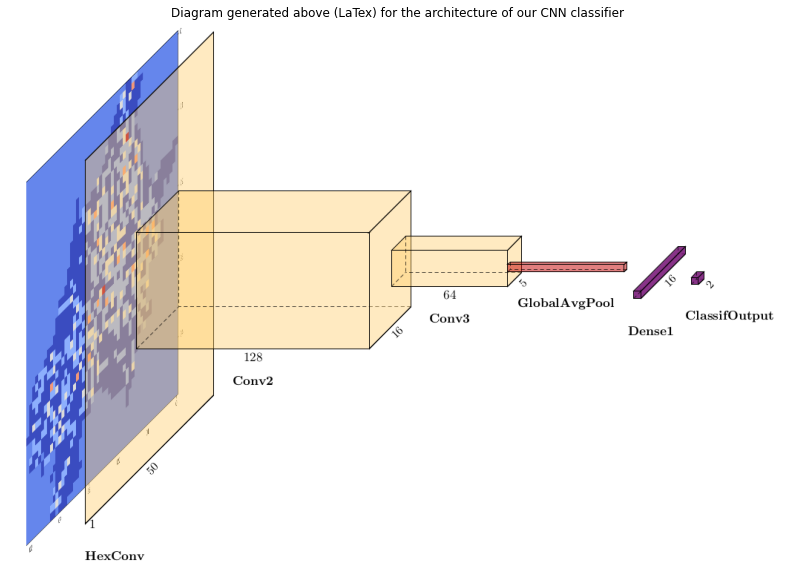

In [211]:
fig, ax = plt.subplots(1, 1, figsize=(14, 14))

im1 = pilim.open('images/cnn_arch.png', 'r')
ax.imshow(np.asarray(im1))
ax.set_title("Diagram generated above (LaTex) for the architecture of our CNN classifier")
ax.set_axis_off()

<br/><br/>

### IV.4.5 Train the model

In [212]:
batch_size = 4
num_iter_per_epoch_train = 1000//batch_size
num_iter_per_epoch_valid = 200//batch_size

print("Iterations per epoch: training {}  validation {}".format(
                                             num_iter_per_epoch_train, 
                                             num_iter_per_epoch_valid))
print("Num_batches samples trained on per epoch = ", 
      batch_size * num_iter_per_epoch_train)

Iterations per epoch: training 250  validation 50
Num_batches samples trained on per epoch =  1000


In [213]:
!rm -r -f tf_models/checkpoint_classif
!mkdir -p tf_models/checkpoint_classif

In [214]:
checkpoint_filepath = 'tf_models/checkpoint_classif'
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
                                filepath=checkpoint_filepath,
                                save_weights_only=False,
                                monitor='val_accuracy',
                                mode='max',
                                save_best_only=True,
                                verbose=0)


# custom callback for printing metrics only on certain epochs 
class SelectiveProgress(tf.keras.callbacks.Callback):
    """ inspired by tfdocs.EpochDots """

    def __init__(self, report_every=10):
        self.report_every = report_every

    def on_epoch_end(self, epoch, logs):
        if epoch % self.report_every == 0:
            print('Epoch: {:d}, '.format(epoch), end='')
            for name, value in sorted(logs.items()):
                print('{}:{:0.4f}'.format(name, value), end=',  ')
            print()


In [215]:
history = model_classif.fit(x = train_dataset, 
                            steps_per_epoch = num_iter_per_epoch_train,
                            validation_data = validation_dataset, 
                            validation_steps = num_iter_per_epoch_valid,
                            epochs = 50, 
                            shuffle = False, 
                            workers = 1,
                            verbose=0,
                            callbacks = [checkpoint_callback, 
                                         SelectiveProgress()])

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
INFO:tensorflow:Assets written to: tf_models/checkpoint_classif/assets
Epoch: 0, accuracy:0.6420,  loss:0.6559,  val_accuracy:0.6200,  val_loss:0.6034,  
INFO:tensorflow:Assets written to: tf_models/checkpoint_classif/assets
INFO:tensorflow:Assets written to: tf_models/checkpoint_classif/assets
INFO:tensorflow:Assets written to: tf_models/checkpoint_classif/assets
Epoch: 10, accuracy:0.9690,  loss:0.0942,  val_accuracy:0.9650,  val_loss:0.0987,  
INFO:tensorflow:Assets written to: tf_models/checkpoint_classif/assets
INFO:tensorflow:Assets written to: tf_models/checkpoint_classif/assets
Epoch: 20, accuracy:0.9920,  loss:0.0314,  val_accuracy:1.0000,  val_loss:0.0143,  
Epoch: 30, accuracy:0.9990,  loss:0.0113,  val_accuracy:1.0000,  val_loss:0.0082,  
Epoch: 40, accuracy:1.0000,  loss:0.0074,  val_accuracy:1.0000,  val_loss:0.0047,  


In [216]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.tail()


,loss,accuracy,val_loss,val_accuracy,epoch
45,0.00413,1.00000,0.01378,0.99500,45
46,0.00436,1.00000,0.00254,1.00000,46
47,0.00418,0.99900,0.00383,1.00000,47
48,0.00220,1.00000,0.00249,1.00000,48
49,0.00336,1.00000,0.00236,1.00000,49


['ClassifOutput']


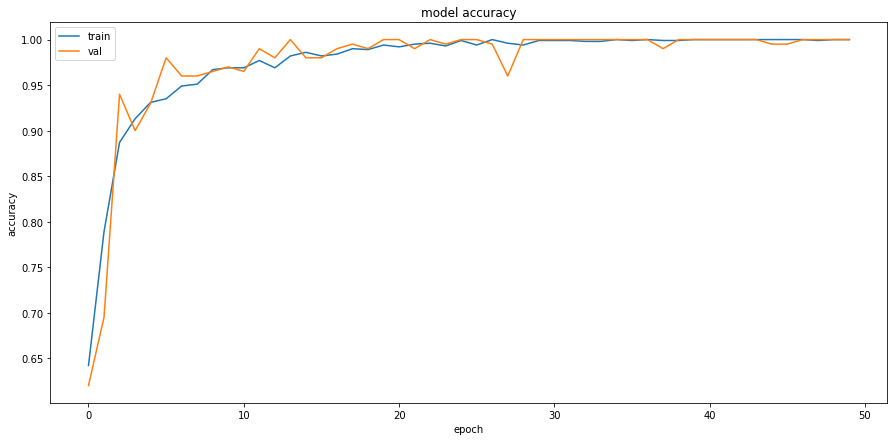

In [217]:
print(model_classif.output_names)

fig, ax = plt.subplots(1, 1, figsize = (15, 7))
ax.plot(history.history['accuracy'])
ax.plot(history.history['val_accuracy'])
ax.set_title('model accuracy')
ax.set_ylabel('accuracy')
ax.set_xlabel('epoch')
ax.legend(['train', 'val'], loc='upper left')

In [218]:
!ls -alh tf_models/checkpoint_classif

total 148K
drwxrwxr-x 4 camelia camelia 4,0K aug  9 11:16 .
drwxrwxr-x 5 camelia camelia 4,0K aug  9 11:16 ..
drwxr-xr-x 2 camelia camelia 4,0K aug  9 11:16 assets
-rw-rw-r-- 1 camelia camelia 132K aug  9 11:16 saved_model.pb
drwxr-xr-x 2 camelia camelia 4,0K aug  9 11:16 variables


In [235]:
#sidenote: we can verify that the hexagonal convolution preserved the kernel specified by us

print(model_classif.get_layer("HexConv").get_weights())

[array([[[[0.16666667]],

        [[0.16666667]],

        [[0.        ]]],


       [[[0.16666667]],

        [[1.        ]],

        [[0.16666667]]],


       [[[0.        ]],

        [[0.16666667]],

        [[0.16666667]]]], dtype=float32)]


<br/>

### IV.4.6. Load the best iteration model and make predictions

In [219]:
loaded_classifier = tf.keras.models.load_model("tf_models/checkpoint_classif")

# ------------------- 

print(list(loaded_classifier.signatures.keys())) 

infer = loaded_classifier.signatures["serving_default"]
print(infer.structured_outputs)


['serving_default']
{'ClassifOutput': TensorSpec(shape=(None, 2), dtype=tf.float32, name='ClassifOutput')}


In [220]:
def predicted_label(arr_ij):   
    
    # reshape input from (m,n) to (1,m,n)
    reshaped_input = arr_ij[np.newaxis, :, :]
    
    #the result from the binary classifier
    prediction_logits = loaded_classifier.predict([reshaped_input])
    top_prediction = tf.argmax(prediction_logits, 1)
    the_label = top_prediction.numpy()[0]    
   
    return prediction_logits[0], the_label

In [221]:
pred_logits, the_label  = predicted_label(arr_ij_busstops)

dict_decode = {0: "CSR", 1: "Clustered"}

print(pred_logits, 
      " ---> PREDICTED CLASS:", the_label, 
      " ---> DECODED AS: ", dict_decode[the_label])


[0.00000862 0.9999914 ]  ---> PREDICTED CLASS: 1  ---> DECODED AS:  Clustered


**Confusion matrix and confused samples**

(600, 48, 52)
(600, 48, 52)


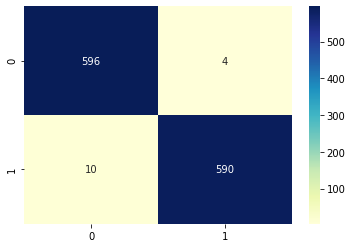

In [226]:
# here N = CSR, P = CLUSTERED

TP = 0
TN = 0
FP = 0
FN = 0

list_misclassified = []
list_misclassified_realizations = []

arr_ij_csr = np.load("datasets_demo/csr_matrices.npy")
points_csr = np.load("datasets_demo/csr_points.npy", allow_pickle = True)
 
print(arr_ij_csr.shape)
for k in range(arr_ij_csr.shape[0]):
    sample_csr = arr_ij_csr[k]
    pred_logits, the_label = predicted_label(sample_csr)

    if the_label == 0:
        TN += 1
    else:
        FP += 1
        list_misclassified.append((0, arr_ij_csr[k], pred_logits))
        list_misclassified_realizations.append((0, points_csr[k], pred_logits))

arr_ij_clustered = np.load("datasets_demo/clustered_matrices.npy")
points_clustered = np.load("datasets_demo/clustered_points.npy", allow_pickle = True)

print(arr_ij_clustered.shape)
for k in range(arr_ij_clustered.shape[0]):
    sample_clustered = arr_ij_clustered[k]
    pred_logits, the_label = predicted_label(sample_clustered)

    if the_label == 1:
        TP += 1
    else:
        FN += 1  
        list_misclassified.append((1, arr_ij_csr[k], pred_logits))
        list_misclassified_realizations.append((1, points_clustered[k], pred_logits))

confusion_matrix = [[TN, FP], [FN, TP]]

assert(len(list_misclassified) == (FP + FN))

ax = sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="YlGnBu")

**Confused samples:**

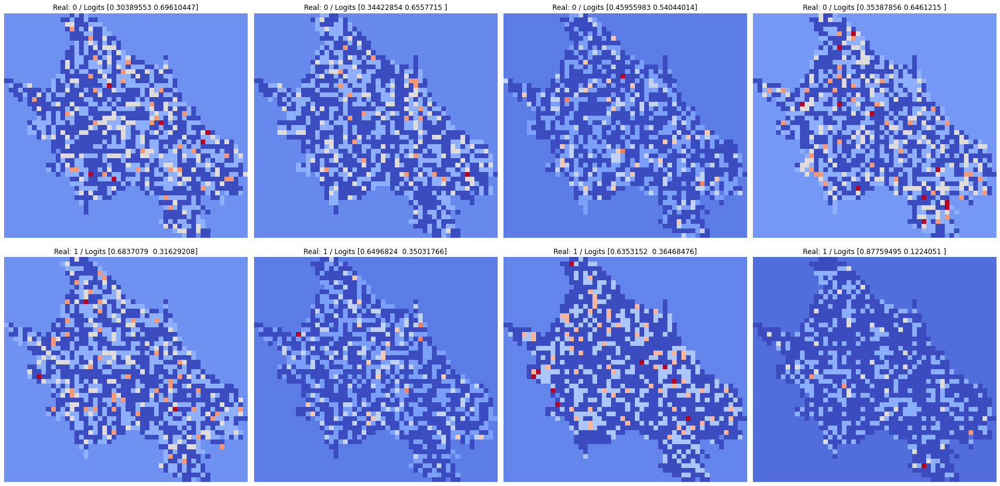

In [227]:
nr = min(8, len(list_misclassified))

fig = plt.figure(figsize = (24, 12))

for i in range(0, nr):
    ax = fig.add_subplot(2, 4, i+1)
    
    sample_chosen = list_misclassified[i]
    image = sample_chosen[1]

    ax.imshow(image, cmap="coolwarm", interpolation = None)
    ax.set_title("Real: {} / Logits {}".format(sample_chosen[0], sample_chosen[2]))
    ax.set_axis_off()

fig.tight_layout()

The point processes realizations of these were:

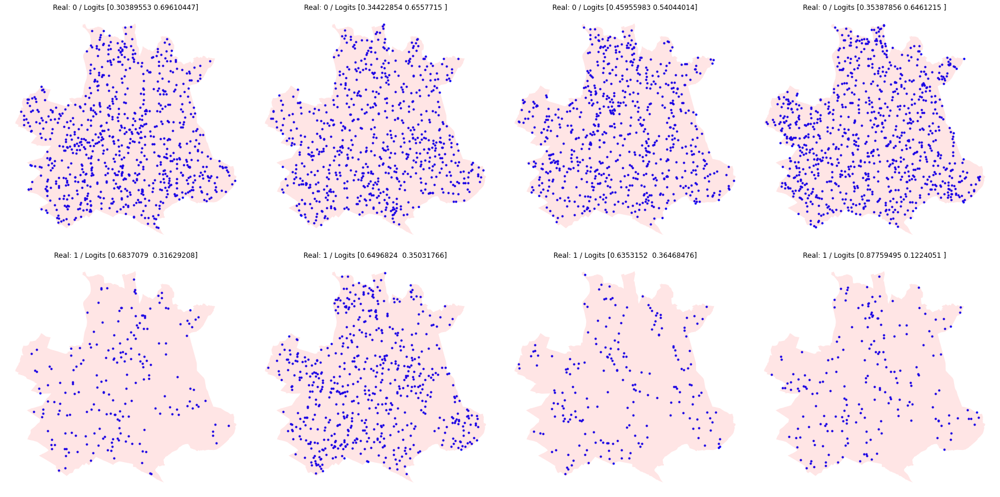

In [231]:
nr = min(8, len(list_misclassified))

fig = plt.figure(figsize = (24, 12))

for i in range(0, nr):
    ax = fig.add_subplot(2, 4, i+1)
    
    sample_chosen = list_misclassified_realizations[i]

    realizations = sample_chosen[1]
    df_points = pd.DataFrame(realizations, 
                             columns= ["longitude", "latitude"])

    # the shape of the subzone in pale pink
    ax.fill(xs, ys, alpha=0.1, fc='r', ec='none')
    
    ax.scatter(
      df_points[["longitude"]], df_points[["latitude"]], 
      fc = "blue", marker=".", s = 35)
    
    ax.set_title("Real: {} / Logits {}".format(sample_chosen[0], sample_chosen[2]))
    ax.set_axis_off()

fig.tight_layout()

### IV.4.7. Attemp to find similar point process realizations using embeddings

Based on the embeddings extracted from the trained CNN, we seek to retrieve training instances which are most similar to a given query pattern.

Extract embeddings at a specified layer of the CNN:

In [238]:
list_layers = loaded_classifier.layers
assert(list_layers[-1].name == list(infer.structured_outputs.keys())[0])
print(list_layers[-2].name)

Dense1


In [239]:
embeddings_extractor = tf.keras.Model(loaded_classifier.inputs,
                                      loaded_classifier.get_layer(list_layers[-2].name).output)
embeddings_extractor.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
ClassifInput (InputLayer)    [(None, 48, 52, 1)]       0         
_________________________________________________________________
HexConv (Conv2D)             (None, 46, 50, 1)         9         
_________________________________________________________________
Conv2 (Conv2D)               (None, 15, 16, 128)       1280      
_________________________________________________________________
Conv3 (Conv2D)               (None, 5, 5, 64)          73792     
_________________________________________________________________
GlobalAvgPool (GlobalAverage (None, 64)                0         
_________________________________________________________________
Dense1 (Dense)               (None, 16)                1040      
Total params: 76,121
Trainable params: 76,121
Non-trainable params: 0
_________________________________________________________

In [240]:
reshaped_input = arr_ij_busstops[np.newaxis, :, :]

embedd_vector_busstops = embeddings_extractor.predict([reshaped_input])
embedd_vector_busstops[0]

array([0.        , 0.        , 0.        , 0.70607924, 0.        ,
       3.5509427 , 0.        , 3.170703  , 0.        , 0.10992116,
       3.0460455 , 0.        , 0.03592302, 0.        , 0.        ,
       0.        ], dtype=float32)

Extract embeddings of all training samples and build an index of them in Annoy.

Annoy is an open source project by Spotify, aimed at fast nearest neighbor search (see https://github.com/spotify/annoy#readme)

In [245]:
%%time

embedd_length = 16
annoy_idx = AnnoyIndex(embedd_length, 'angular') 

for k in range(arr_ij_csr.shape[0]):
    sample_csr = arr_ij_csr[k]
    reshaped_input = sample_csr[np.newaxis, :, :]
    embedd_vect = embeddings_extractor.predict([reshaped_input])
    
    # note: ids must be integers in seq starting from 0 
    annoy_idx.add_item(k, embedd_vect[0])
    

for k2 in range(arr_ij_clustered.shape[0]):
    sample_clustered = arr_ij_clustered[k2]
    reshaped_input = sample_clustered[np.newaxis, :, :]
    embedd_vect = embeddings_extractor.predict([reshaped_input])
    
    # note: ids must be integers in seq starting from 0 
    annoy_idx.add_item(k + k2, embedd_vect[0])


num_trees = 10
annoy_idx.build(num_trees)
annoy_idx.save("datasets_demo/embeddings_index.ann")

CPU times: user 38.2 s, sys: 424 ms, total: 38.6 s
Wall time: 37.6 s


Now load it and query the index for the 8 most similar point patterns compared to the busstops pattern:

In [254]:
help(annoy_idx.get_nns_by_vector)

Help on built-in function get_nns_by_vector:

get_nns_by_vector(...) method of annoy.Annoy instance
    Returns the `n` closest items to vector `vector`.
    
    :param search_k: the query will inspect up to `search_k` nodes.
    `search_k` gives you a run-time tradeoff between better accuracy and speed.
    `search_k` defaults to `n_trees * n` if not provided.
    
    :param include_distances: If `True`, this function will return a
    2 element tuple of lists. The first list contains the `n` closest items.
    The second list contains the corresponding distances.



In [257]:
%%time
loaded_annoy_idx = AnnoyIndex(embedd_length, 'angular')

#loading is fast, will just mmap the file
loaded_annoy_idx.load("datasets_demo/embeddings_index.ann")

similar = loaded_annoy_idx.get_nns_by_vector(
               vector = embedd_vector_busstops[0],
               n = 8, 
               search_k = -1, 
               include_distances = True)

CPU times: user 0 ns, sys: 0 ns, total: 0 ns
Wall time: 326 µs


In [258]:
instances_similar =  similar[0]
print(instances_similar)

distances_similar = similar[1]
distances_similar

[971, 887, 1196, 1024, 1192, 839, 683, 1055]


[0.010445427149534225,
 0.015298523008823395,
 0.018302790820598602,
 0.018318073824048042,
 0.018522070720791817,
 0.02075383812189102,
 0.02111842855811119,
 0.022061001509428024]

Visualize:

Counter({1: 8})


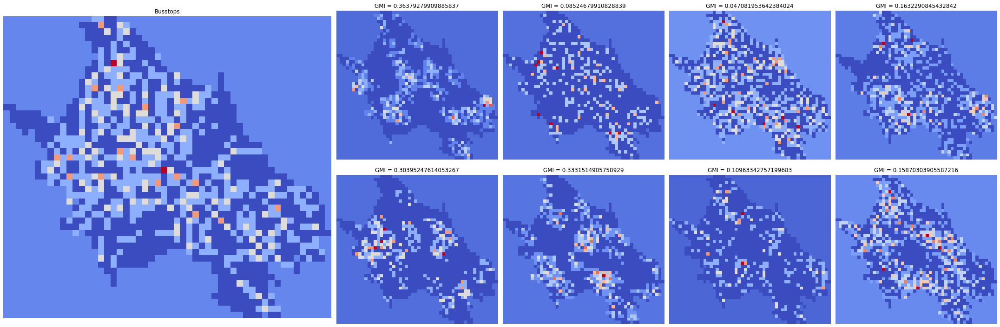

In [265]:
gmi_csr = np.load("datasets_demo/csr_GMI.npy")
gmi_clustered = np.load("datasets_demo/clustered_GMI.npy")

list_labels_similar = []

fig = plt.figure(figsize=(30,15), constrained_layout=True) 
gs = fig.add_gridspec(3, 6) 

ax = fig.add_subplot(gs[0:2, 0:2])
ax.imshow(arr_ij_busstops, cmap="coolwarm", interpolation = None)
ax.set_title("Busstops")
ax.set_axis_off()

ii = 0
for k in range(len(similar[0])):
               
    idx_pos = similar[0][k]
    if idx_pos < arr_ij_csr.shape[0]: 
        similar_arr_ij = arr_ij_csr[idx_pos]
        gmi = gmi_crs[idx_pos]
        list_labels_similar.append(0)
    else:
        idx_pos = idx_pos - arr_ij_csr.shape[0]
        similar_arr_ij = arr_ij_clustered[idx_pos]
        gmi = gmi_clustered[idx_pos]
        list_labels_similar.append(1)
    
    i = int(ii /4)
    j = 2 + int (ii  % 4)
    ax = fig.add_subplot(gs[i:i+1, j:j+1])

    ax.imshow(similar_arr_ij, cmap="coolwarm", interpolation = None)
    ax.set_title("GMI = {}".format(gmi))
    ax.set_axis_off()
    ii = ii + 1
    
print(Counter(list_labels_similar))
fig.tight_layout()

All of them were clustered pattern, as is the busstops pattern. However, the spatial distribution differs.

------------------

-------------------

# V. 3D visualizations in JavaScript with deck.gl

In [266]:
def repr_html(html_data, height = 500):
    """Build the HTML representation for Jupyter."""
    srcdoc = html_data.replace('"', "'")
    
    ifr = '''<iframe srcdoc="{srcdoc}" style="width: 100%; height: {h}px; border: none">
             </iframe>'''
    return (ifr.format(srcdoc = srcdoc, h = height))


The following resources were guidelines for this part:
- https://www.mapbox.com/mapbox-gl-js/example/3d-buildings/
- http://deck.gl/showcases/gallery/hexagon-layer
- https://github.com/uber/deck.gl/blob/master/docs/layers/hexagon-layer.md
- https://github.com/uber/deck.gl/blob/master/docs/layers/geojson-layer.md
- https://github.com/uber/deck.gl/blob/master/docs/layers/arc-layer.md


In [267]:
# MAPBOX_TOKEN = '<THE_MAPBOX_API_TOKEN_HERE>';

In [268]:
%%bash

mkdir -p js/lib
cd js/lib
wget https://unpkg.com/s2-geometry@1.2.10/src/s2geometry.js
mv s2geometry.js s2Geometry.js
ls -alh

total 24K
drwxrwxr-x 2 camelia camelia 4,0K aug  9 13:10 .
drwxrwxr-x 3 camelia camelia 4,0K aug  9 13:10 ..
-rw-rw-r-- 1 camelia camelia  15K dec 30  2016 s2Geometry.js


--2020-08-09 13:10:16--  https://unpkg.com/s2-geometry@1.2.10/src/s2geometry.js
Resolving unpkg.com (unpkg.com)... 104.16.122.175, 104.16.125.175, 104.16.124.175, ...
Connecting to unpkg.com (unpkg.com)|104.16.122.175|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/javascript]
Saving to: ‘s2geometry.js’

     0K .......... ....                                        16,5M=0,001s

2020-08-09 13:10:16 (16,5 MB/s) - ‘s2geometry.js’ saved [14911]



## V.1. deck.gl Arc, Scatterplot and GeoJSON layers for the route of bus 14

In [ ]:
srcall = """

<!DOCTYPE html>
<html>
<head>
    <meta charset='utf-8' />
    <meta name='viewport' content='initial-scale=1,maximum-scale=1,user-scalable=no' />    
    <link href='https://api.tiles.mapbox.com/mapbox-gl-js/v0.51.0/mapbox-gl.css' 
          rel='stylesheet' />
    <script src="https://cdnjs.cloudflare.com/ajax/libs/require.js/2.3.6/require.js">
    </script>
    <style>
        body { margin:0; padding:0; }
        #map { position:absolute; top:0; bottom:0; width:100%; }
    </style>
</head>
<body>

<div id="container">
   <div id="map"></div>
   <canvas id="deck-canvas"></canvas>
</div>

<script>

requirejs.config({"baseUrl": "js/lib",
                  "paths": {
    "my_mapboxgl" : 'https://api.tiles.mapbox.com/mapbox-gl-js/v0.53.1/mapbox-gl', 
    "h3" :       'https://cdn.jsdelivr.net/npm/h3-js@3.6.4/dist/h3-js.umd', 
    "my_deck" :  'https://unpkg.com/deck.gl@~8.0.2/dist.min', 
    "my_d3" :    'https://d3js.org/d3.v5.min' 
    } 
 });


require(['my_mapboxgl', 'my_deck', 'my_d3'], function(mapboxgl,deck,d3) {


  // --- mapboxgl ----------------------------------------------------------
  const INITIAL_VIEW_STATE = {
    latitude: 43.600378,
    longitude: 1.445478,
    zoom: 12,
    bearing: 30,
    pitch: 60
  };  

  mapboxgl.accessToken = '""" + MAPBOX_TOKEN + """';
  var mymap = new mapboxgl.Map({
                container: 'map', 
                style: 'mapbox://styles/mapbox/streets-v9', 
                center: [INITIAL_VIEW_STATE.longitude, INITIAL_VIEW_STATE.latitude],
                zoom: INITIAL_VIEW_STATE.zoom,
                bearing: INITIAL_VIEW_STATE.bearing, 
                pitch: INITIAL_VIEW_STATE.pitch,
                interactive: false 
              });

  mymap.on('load', () => {
    var layers = mymap.getStyle().layers;
    var labelLayerId;
    for (var i = 0; i < layers.length; i++) {
      if (layers[i].type === 'symbol' && layers[i].layout['text-field']) {
        labelLayerId = layers[i].id;
        break;
      }
    }


    mymap.addLayer({
      'id': '3d-buildings',
      'source': 'composite',
      'source-layer': 'building',
      'filter': ['==', 'extrude', 'true'],
      'type': 'fill-extrusion',
      'minzoom': 15,
      'paint': {
        'fill-extrusion-color': '#aaa',
        // use an 'interpolate' expression to add a smooth transition effect to the
        // buildings as the user zooms in
        'fill-extrusion-height': ["interpolate", ["linear"], ["zoom"], 15, 0,
                                   15.05, ["get", "height"] ],
        'fill-extrusion-base': ["interpolate", ["linear"], ["zoom"], 15, 0,
                                  15.05, ["get", "min_height"] ],
        'fill-extrusion-opacity': .6
       }
    }, labelLayerId);
  });  

  // ---  -------------------------------------------------------------
  function color_arc(x){
    if (x == 0){
      return [0,160,0];
    }
    else{
      return [250,0,0];
    }
  };
 

  // The positions of lights specified as [x, y, z], in a flattened array.
  // The length should be 3 x numberOfLights
  const LIGHT_SETTINGS = {
    lightsPosition: [1.288984920469113, 43.5615971219998, 2000, 
                     1.563934056342489, 43.52658309103259, 4000],
    ambientRatio: 0.4,
    diffuseRatio: 0.6,
    specularRatio: 0.2,
    lightsStrength: [0.8, 0.0, 0.8, 0.0],
    numberOfLights: 2
  };
  
  
  //add also the geometries of the traversed districts, in pale beige color 
  geo_layer_border = new deck.GeoJsonLayer({
    id: 'traversed_districts_border',
    data: d3.json('datasets_demo/bus_14_districts.geojson'),
    elevationRange: [0, 10],
    elevationScale: 1,
    extruded: false,
    stroked: true,
    filled: true,
    lightSettings: LIGHT_SETTINGS,
    opacity: 0.2,
    getElevation: 10,
    getLineColor: f => [194, 122, 66],
    getLineWidth: 50,
    getFillColor: f => [245, 198, 144],
  });
  

  // scatterplots of busstops points
  scatter_layer =  new deck.ScatterplotLayer({
    id: 'busstops_1',
    pickable: true,
    data: d3.json('datasets_demo/bus_14_route.json'),
    getPosition: d => [d.longitude, d.latitude,10],
    getColor: [0,0,0],
    radiusScale: 30
  });

  scatter_layer2 =  new deck.ScatterplotLayer({
    id: 'busstops_2',
    pickable: true,
    data: d3.json('datasets_demo/bus_14_route.json'),
    getPosition: d => [d.next_longitude, d.next_latitude,10],
    getColor: [0,0,0],
    radiusScale: 20
  });

  arcs_layer = new deck.ArcLayer({
    id: 'busroute',
    data: d3.json('datasets_demo/bus_14_route.json'),
    pickable: false,
    getWidth: 12,
    getSourcePosition: d => [d.longitude, d.latitude],
    getTargetPosition: d => [d.next_longitude, d.next_latitude],
    getSourceColor:  d => color_arc(d.sens),
    getTargetColor:  d => color_arc(d.next_sens)
  });
  
  const mydeck = new deck.Deck({
    canvas: 'deck-canvas',
    width: '100%',
    height: '100%',
    initialViewState: INITIAL_VIEW_STATE,
    controller: true,
    layers: [geo_layer_border,scatter_layer,scatter_layer2,arcs_layer],
    onViewStateChange: ({viewState}) => {
      mymap.jumpTo({
        center: [viewState.longitude, viewState.latitude],
        zoom: viewState.zoom,
        bearing: viewState.bearing,
        pitch: viewState.pitch
     });
    }
  });

});
</script>


</body>
</html>


"""

# Load the map into an iframe
map4_html = repr_html(srcall, height = 900)

# Display the map
display(HTML(map4_html))


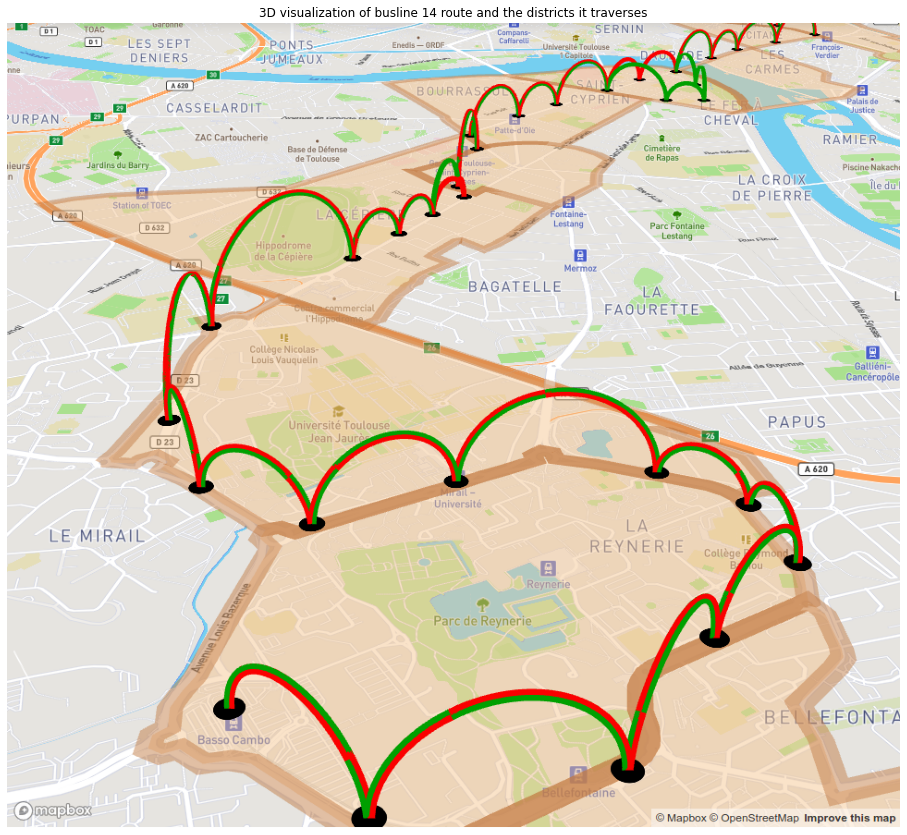

In [270]:
fig, ax = plt.subplots(1, 1, figsize=(16, 16))

im1 = pilim.open('images/busline14_img1.png', 'r')
ax.imshow(np.asarray(im1))
ax.set_title("3D visualization of busline 14 route and the districts it traverses")
ax.set_axis_off()


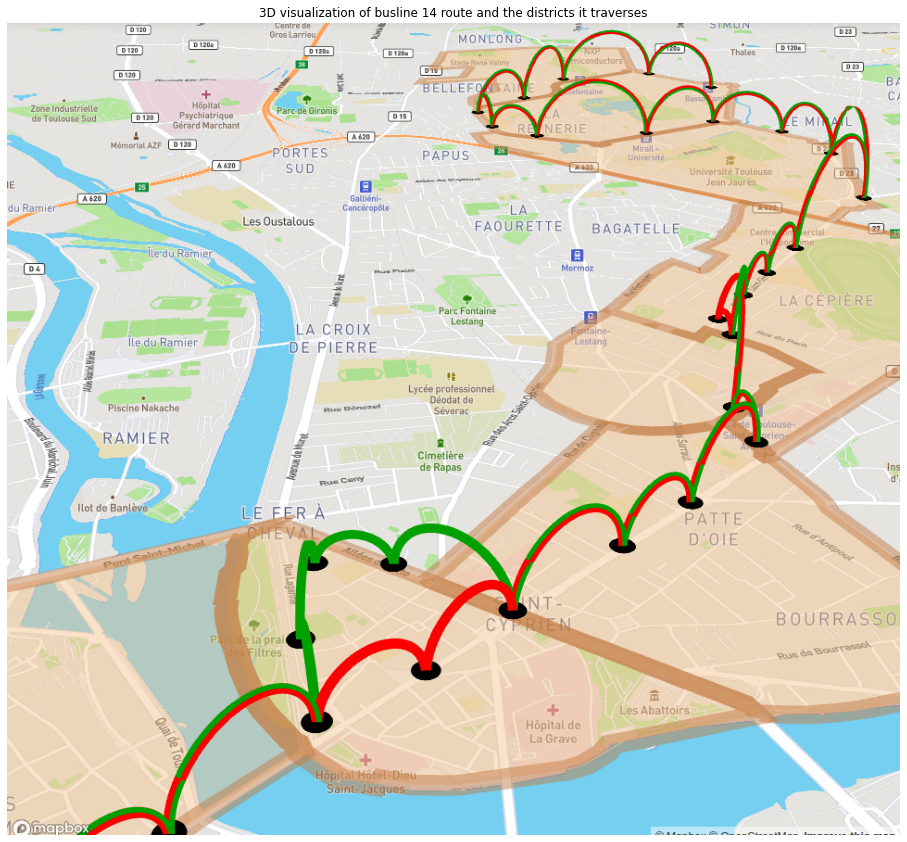

In [271]:
fig, ax = plt.subplots(1, 1, figsize=(16, 16))

im1 = pilim.open('images/busline14_img3.png', 'r')
ax.imshow(np.asarray(im1))
ax.set_title("3D visualization of busline 14 route and the districts it traverses")
ax.set_axis_off()

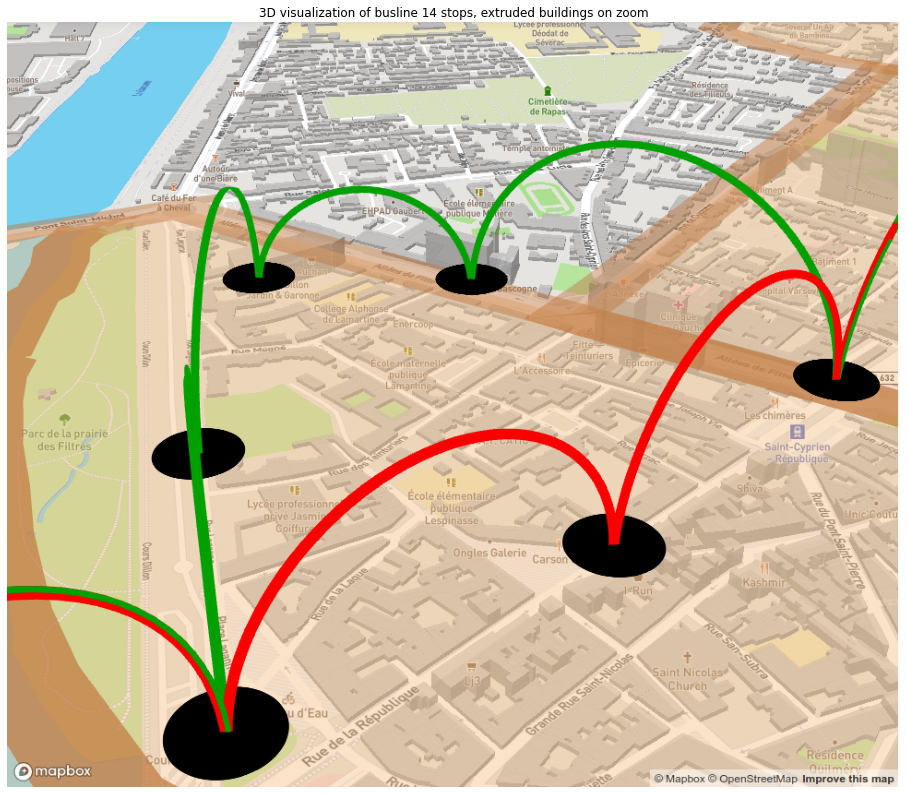

In [272]:
fig, ax = plt.subplots(1, 1, figsize=(16, 16))

im1 = pilim.open('images/busline14_img2.png', 'r')
ax.imshow(np.asarray(im1))
ax.set_title("3D visualization of busline 14 stops, extruded buildings on zoom")
ax.set_axis_off()


## V.2. deck.gl H3Hexagon layer for aggregated counts of busstops

In [273]:
!head -n 20 datasets_demo/counts_res9.json

[
    {
        "hex_id":"893960112cfffff",
        "value":0.0
    },
    {
        "hex_id":"8939601843bffff",
        "value":1.0
    },
    {
        "hex_id":"8939601a80bffff",
        "value":0.0
    },
    {
        "hex_id":"89396019583ffff",
        "value":0.0
    },
    {
        "hex_id":"8939601805bffff",
        "value":1.0


In [ ]:
srcall = """

<!DOCTYPE html>
<html>
<head>
    <meta charset='utf-8' />
    <meta name='viewport' content='initial-scale=1,maximum-scale=1,user-scalable=no' />    
    <link href='https://api.tiles.mapbox.com/mapbox-gl-js/v0.51.0/mapbox-gl.css' 
          rel='stylesheet' />
    <script src="https://cdnjs.cloudflare.com/ajax/libs/require.js/2.3.6/require.js">
    </script>
    <style>
        body { margin:0; padding:0; }
        #map { position:absolute; top:0; bottom:0; width:100%; }
    </style>
</head>
<body>

<div id="container">
   <div id="map"></div>
   <canvas id="deck-canvas"></canvas>
</div>

<script>



requirejs.config({"baseUrl": "js/lib",
                  "paths": {
    "my_mapboxgl" : 'https://api.tiles.mapbox.com/mapbox-gl-js/v0.53.1/mapbox-gl', 
    "h3" :       'https://cdn.jsdelivr.net/npm/h3-js@3.6.4/dist/h3-js.umd', 
    "my_deck" :  'https://unpkg.com/deck.gl@~8.0.2/dist.min', 
    "my_d3" :    'https://d3js.org/d3.v5.min' 
    } 
 });


require(['h3', 'my_mapboxgl', 'my_deck', 'my_d3'], function(h3,mapboxgl,deck,d3) {


  // --- mapboxgl ----------------------------------------------------------
  const INITIAL_VIEW_STATE = {
    latitude: 43.600378,
    longitude: 1.445478,
    zoom: 12,
    bearing: 30,
    pitch: 60
  };  

  mapboxgl.accessToken = '""" + MAPBOX_TOKEN + """';
  var mymap = new mapboxgl.Map({
                container: 'map', 
                style: 'mapbox://styles/mapbox/light-v9', 
                center: [INITIAL_VIEW_STATE.longitude, INITIAL_VIEW_STATE.latitude],
                zoom: INITIAL_VIEW_STATE.zoom,
                bearing: INITIAL_VIEW_STATE.bearing, 
                pitch: INITIAL_VIEW_STATE.pitch,
                interactive: false 
              });

  mymap.on('load', () => {
    var layers = mymap.getStyle().layers;
    var labelLayerId;
    for (var i = 0; i < layers.length; i++) {
      if (layers[i].type === 'symbol' && layers[i].layout['text-field']) {
        labelLayerId = layers[i].id;
        break;
      }
    }
  });  

  //---deckgl -------------------------------------------------------------
  const COLOR_RANGE = [
      [243, 240, 247],  //gray for counts = 0
      [0, 200, 0],
      [250, 250, 0],
      [250, 170, 90],
      [250, 70, 70]
    ];
  
  function colorScale(x) {
    list_thresholds = [0.0, 1.0, 2.0, 3.0, 4.0, 5.0];
    for(var i = 0; i < list_thresholds.length; i++){
      if(x <= list_thresholds[i]){
        return COLOR_RANGE[i];
      }  
    }
    return COLOR_RANGE[COLOR_RANGE.length - 1];
  };
  
  function defaultcolorScale(x) {
    return [255, (1 - d.value / 3) * 255, 100];
  }

  hexes_layer = new deck.H3HexagonLayer({
    id: 'hexes_counts',
    data: d3.json('datasets_demo/counts_res9.json'),
    pickable: true,
    wireframe: false,
    filled: true,
    extruded: true,
    elevationScale: 30,
    elevationRange: [0, 100],
    getHexagon: d => d.hex_id,
    getElevation: d => d.value * 10,
    getFillColor: d => colorScale(d.value),
    opacity: 0.8
  });

  // lights
  const cameraLight = new deck._CameraLight({
    color: [255, 255, 255],
    intensity: 2.0
  });
  
  const pointLight1 = new deck.PointLight({
    color: [255, 255, 255],
    intensity: 2.0,
    position: [1.288984920469113, 43.5615971219998, 2000]
  });
  
  const pointLight2 = new deck.PointLight({
    color: [255, 255, 255],
    intensity: 2.0,
    position: [1.563934056342489, 43.52658309103259, 4000]
  });
  

  const mydeck = new deck.Deck({
    canvas: 'deck-canvas',
    width: '100%',
    height: '100%',
    initialViewState: INITIAL_VIEW_STATE,
    controller: true,
    layers: [hexes_layer],
    effects: [ new deck.LightingEffect({cameraLight}, pointLight1, pointLight2)],
    onViewStateChange: ({viewState}) => {
      mymap.jumpTo({
        center: [viewState.longitude, viewState.latitude],
        zoom: viewState.zoom,
        bearing: viewState.bearing,
        pitch: viewState.pitch
     });
    }
  });

});
</script>

</body>
</html>

"""

# Load the map into an iframe
map_html = repr_html(srcall, height=900)

# Display the map
display(HTML(map_html))


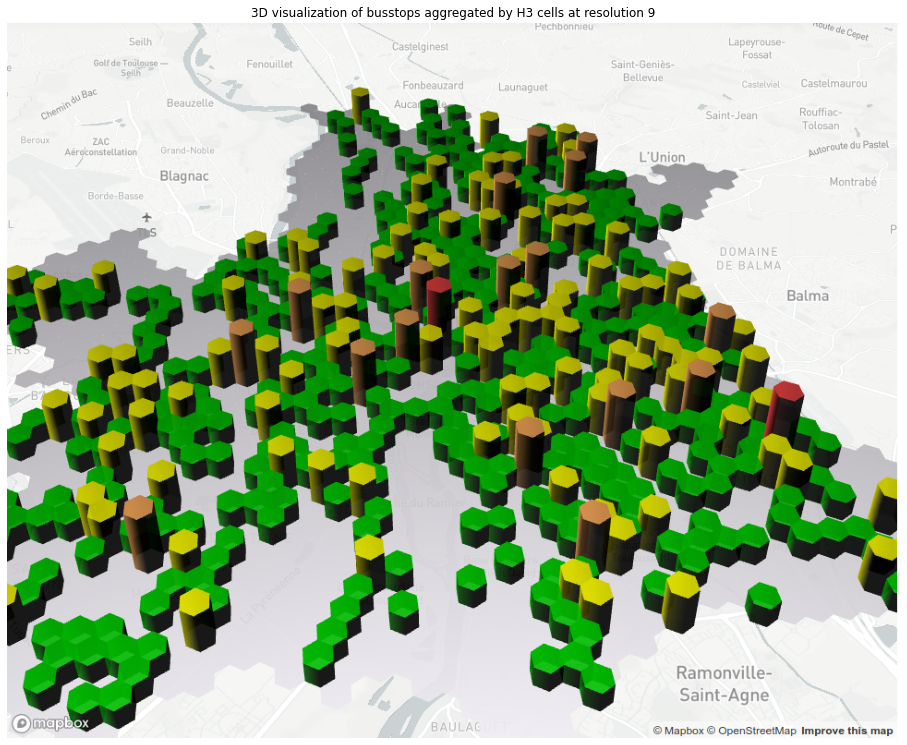

In [275]:
fig, ax = plt.subplots(1, 1, figsize=(16, 16))

im1 = pilim.open('images/vis_aggreg_img1.png', 'r')
ax.imshow(np.asarray(im1))
ax.set_title("3D visualization of busstops aggregated by H3 cells at resolution 9")
ax.set_axis_off()

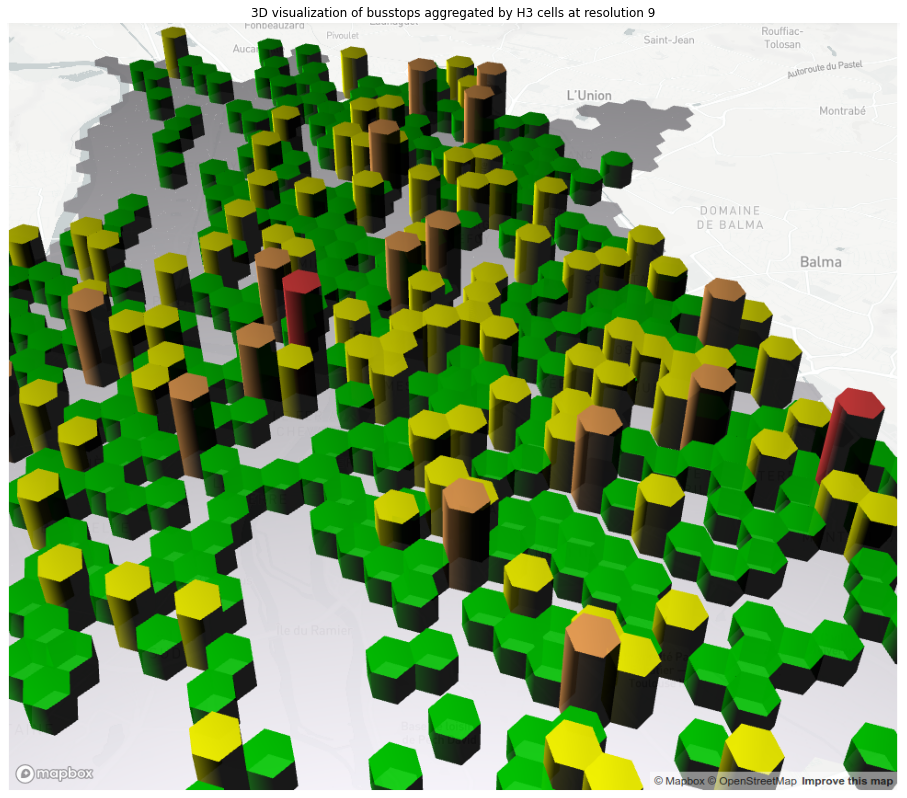

In [276]:
fig, ax = plt.subplots(1, 1, figsize=(16, 16))

im1 = pilim.open('images/vis_aggreg_img2.png', 'r')
ax.imshow(np.asarray(im1))
ax.set_title("3D visualization of busstops aggregated by H3 cells at resolution 9")
ax.set_axis_off()

### The end.

----